# Implementation setup

In [ ]:
import sys, platform, sklearn, numpy, pandas, matplotlib, seaborn
import xgboost

print("Python :", sys.version)
print("Platform:", platform.platform())

print("\nCore libs")
print("NumPy      :", numpy.__version__)
print("Pandas     :", pandas.__version__)
print("Scikit-learn:", sklearn.__version__)
print("Matplotlib :", matplotlib.__version__)
print("Seaborn    :", seaborn.__version__)
print("XGBoost    :", xgboost.__version__)

!nvidia-smi


Python : 3.12.12 (main, Oct 10 2025, 08:52:57) [GCC 11.4.0]
Platform: Linux-6.6.105+-x86_64-with-glibc2.35

Core libs
NumPy      : 2.0.2
Pandas     : 2.2.2
Scikit-learn: 1.6.1
Matplotlib : 3.10.0
Seaborn    : 0.13.2
XGBoost    : 3.1.3
/bin/bash: line 1: nvidia-smi: command not found


# **Data Laod**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd
toddler_df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/My Thesis on ASD Education/ASD_Datasets/Toddler Autism dataset July 2018.csv')
map_toddler_df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/My Thesis on ASD Education/Mapping(Edu_and_ASC_on_targeted_skill)Toddler.csv', encoding="latin1")

toddler_df2 = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/My Thesis on ASD Education/ASD_Datasets/Behavior Analysis of Autism.csv')
map_behavior_df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/My Thesis on ASD Education/Mapping(Edu_and_ASC_on_targeted_skill)Toddler.csv', encoding="latin1")

child2017_df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/My Thesis on ASD Education/ASD_Datasets/Child-Data2017.csv')
map_child2017_df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/My Thesis on ASD Education/Mapping(Edu_and_ASC_on_targeted_skill)Child.csv', encoding="latin1")

child2018_df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/My Thesis on ASD Education/ASD_Datasets/Child-Data2018.csv')
map_child2018_df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/My Thesis on ASD Education/Mapping(Edu_and_ASC_on_targeted_skill)Child.csv', encoding="latin1")

adolescent_df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/My Thesis on ASD Education/ASD_Datasets/csv_result-Autism-Adolescent-Data.csv')
map_adolescent_df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/My Thesis on ASD Education/Mapping(Edu_and_ASC_on_targeted_skill)Adolescent.csv', encoding="latin1")

# **Mapping Datasets with Teaching Strategy**

### **For Toddlers**

In [ ]:
####========================###
######### TODDLER 2018 ######
## ======================== ###

import pandas as pd

# Define file paths for the Toddler dataset
data_files = [
    "/content/drive/MyDrive/Colab Notebooks/My Thesis on ASD Education/ASD_Datasets/Toddler Autism dataset July 2018.csv"
]

# Load the mapping file for Toddler
mapping_file = {
    "Toddler": "/content/drive/MyDrive/Colab Notebooks/My Thesis on ASD Education/Mapping(Edu_and_ASC_on_targeted_skill)Toddler.csv"
}

# Load mapping DataFrame and ensure 'Charac_No' is string
mapping_todd_dfs = {key: pd.read_csv(path, encoding="latin1") for key, path in mapping_file.items()}
for key, df in mapping_todd_dfs.items():
    df['Charac_No'] = df['Charac_No'].astype(str)

# Characteristic-to-skills mapping
characteristic_to_skills = {
    'A1': ["responding_to_others"],
    'A2': ["eye_contact"],
    'A3': ["joint_attention"],
    'A4': ["joint_attention"],
    'A5': ["play_skill", "adaptive"],
    'A6': ["cognitive"],
    'A7': ["communication", "understanding_others", "interacting_with_others"],
    'A8': ["language", "communication"],
    'A9': ["social", "adaptive"],
    'A10': ["sensory_integration"]
}

# Skills-to-teaching-strategies mapping
teaching_strategies = {
    "Pivotal_Response_Treatment": ["communication", "language", "play_skill", "sensory_integration"],
    "Peer_Mediated_Instruction_and_Intervention": ["responding_to_others", "understanding_others", "interacting_with_others", "interacting_in_groups"],
    "Task_Analysis": ["social", "adaptive", "joint_attention", "communication"],
    "Picture_Exchange_Communication_System": ["eye_contact", "social", "language", "communication", "joint_attention"],
    "Technology_Aided_Instruction_and_Intervention": ["social", "cognitive", "communication", "joint_attention", "adaptive"]
}

# Priority order of strategies
priority_order = [
    "Task_Analysis",
    "Picture_Exchange_Communication_System",
    "Peer_Mediated_Instruction_and_Intervention",
    "Technology_Aided_Instruction_and_Intervention",
    "Pivotal_Response_Treatment"
]

# Function to get the best teaching strategy
def get_best_teaching_strategy(row, characteristic_to_skills, teaching_strategies, priority_order):
    present_skills = set()
    skill_counts = {}

    # Step 1: Collect all unique skills flagged in A1-A10
    for col in ['A1', 'A2', 'A3', 'A4', 'A5', 'A6', 'A7', 'A8', 'A9', 'A10']:
        if col in row.index and row[col] == 1:
            present_skills.update(characteristic_to_skills[col])

    # Step 2: Calculate match counts for ALL strategies
    for strategy, skills in teaching_strategies.items():
        skill_counts[strategy] = sum(skill in present_skills for skill in skills)

    # Step 3: Find the strategy with the highest score
    max_score = max(skill_counts.values())
    best_strategies = [s for s, score in skill_counts.items() if score == max_score]

    for strategy in priority_order:
      if strategy in best_strategies:
        return strategy


# Process Toddler dataset
for file in data_files:
    df = pd.read_csv(file)

    # ---- Strip whitespace from all column names ----
    df.columns = df.columns.str.strip()

    # Convert 'Age_Mons' to 'age' in years if it exists, then drop 'Age_Mons'
    if 'Age_Mons' in df.columns:
        df['age'] = (df['Age_Mons'] / 12).round(2)
        df.drop(columns=['Age_Mons'], inplace=True)

    # Ensure relevant columns are integers
    for col in ['A1','A2','A3','A4','A5','A6','A7','A8','A9','A10']:
        if col in df.columns:
            df[col] = df[col].astype(int)

    # Filter rows where 'Class/ASD Traits' is 'Yes'
    if 'Class/ASD Traits' in df.columns:
        df['Class/ASD Traits'] = df['Class/ASD Traits'].str.strip().str.lower()
        filtered_df = df.loc[df['Class/ASD Traits'] == 'yes'].copy()

        if not filtered_df.empty:
            # Apply teaching strategy function
            filtered_df['Teaching_Strategy'] = filtered_df.apply(
                get_best_teaching_strategy,
                axis=1,
                args=(characteristic_to_skills, teaching_strategies, priority_order)
            )

            # Save updated DataFrame
            output_filename = file.replace(".csv", "_with_Teaching_Strategy.csv")
            filtered_df.to_csv(output_filename, index=False)

            # Display relevant columns
            print(f"\nDataset: {file}")
            if 'Case_No' in filtered_df.columns:
                print(filtered_df[['Case_No', 'age', 'Teaching_Strategy']].head())
            else:
                print(filtered_df[['age', 'Teaching_Strategy']].head())
        else:
            print(f"No rows with 'Class/ASD Traits' = 'Yes' found in {file}.")
    else:
        print(f"'Class/ASD Traits' column not found in {file}.")



Dataset: /content/drive/MyDrive/Colab Notebooks/My Thesis on ASD Education/ASD_Datasets/Toddler Autism dataset July 2018.csv
   Case_No   age                           Teaching_Strategy
1        2  3.00  Peer_Mediated_Instruction_and_Intervention
2        3  3.00  Peer_Mediated_Instruction_and_Intervention
3        4  2.00       Picture_Exchange_Communication_System
4        5  1.67       Picture_Exchange_Communication_System
5        6  1.75       Picture_Exchange_Communication_System


In [ ]:
####========================###
######### Behavior #########
## ======================== ###


import pandas as pd

# Define file paths using absolute paths for only Toddler and Behavior Analysis datasets
data_files = [
    #"/content/drive/MyDrive/Colab Notebooks/My Thesis on ASD Education/ASD_Datasets/Toddler Autism dataset July 2018.csv",
    "/content/drive/MyDrive/Colab Notebooks/My Thesis on ASD Education/ASD_Datasets/Behavior Analysis of Autism.csv"
]

# Define mapping files for Toddler and Behavior datasets
mapping_file = {
    "Toddler": "/content/drive/MyDrive/Colab Notebooks/My Thesis on ASD Education/Mapping(Edu_and_ASC_on_targeted_skill)Toddler.csv"
}

# Load each mapping file as DataFrames and ensure 'Charac_No' is treated as string
mapping_todd_dfs = {key: pd.read_csv(path, encoding="latin1") for key, path in mapping_file.items()}
for key, df in mapping_todd_dfs.items():
    df['Charac_No'] = df['Charac_No'].astype(str)  # Ensure 'Charac_No' is a string for each mapping

# Define characteristic-to-skills mapping
characteristic_to_skills = {
    'A1': ["responding_to_others"],
    'A2': ["eye_contact"],
    'A3': ["joint_attention"],
    'A4': ["joint_attention"],
    'A5': ["play_skill", "adaptive"],
    'A6': ["cognitive"],
    'A7': ["communication", "understanding_others", "interacting_with_others"],
    'A8': ["language", "communication"],
    'A9': ["social", "adaptive"],
    'A10': ["sensory_integration"]
}

# Define skills-to-teaching-strategies mapping
teaching_strategies = {
    "Pivotal_Response_Treatment": ["communication", "language", "play_skill", "sensory_integration"],
    "Peer_Mediated_Instruction_and_Intervention": ["responding_to_others", "understanding_others", "interacting_with_others", "interacting_in_groups"],
    "Task_Analysis": ["social", "adaptive", "joint_attention", "communication"],
    "Picture_Exchange_Communication_System": ["eye_contact", "social", "language", "communication", "joint_attention"],
    "Technology_Aided_Instruction_and_Intervention": ["social", "cognitive", "communication", "joint_attention", "adaptive"]
}

# Define priority order of strategies
priority_order = [
    "Task_Analysis",
    "Picture_Exchange_Communication_System",
    "Peer_Mediated_Instruction_and_Intervention",
    "Technology_Aided_Instruction_and_Intervention",
    "Pivotal_Response_Treatment"
]

# Function to get the best teaching strategy
def get_best_teaching_strategy(row, characteristic_to_skills, teaching_strategies, priority_order):
    present_skills = set()
    skill_counts = {}

    # Step 1: Collect all unique skills flagged in A1-A10
    for col in ['A1', 'A2', 'A3', 'A4', 'A5', 'A6', 'A7', 'A8', 'A9', 'A10']:
        if col in row.index and row[col] == 1:
            present_skills.update(characteristic_to_skills[col])

    # Step 2: Calculate match counts for ALL strategies
    for strategy, skills in teaching_strategies.items():
        skill_counts[strategy] = sum(skill in present_skills for skill in skills)

    # Step 3: Find the strategy with the highest score
    max_score = max(skill_counts.values())
    best_strategies = [s for s, score in skill_counts.items() if score == max_score]

    for strategy in priority_order:
      if strategy in best_strategies:
        return strategy

# Process only Toddler and Behavior Analysis datasets
for file in data_files:
    # Load the dataset
    df = pd.read_csv(file)

    # Convert 'Age_Mons' to 'age' in years if it exists, then drop 'Age_Mons'
    if 'Age_Mons' in df.columns:
        df['age'] = (df['Age_Mons'] / 12).round(2)  # Convert months to years
        df.drop(columns=['Age_Mons'], inplace=True)  # Drop original 'Age_Mons' column

    # Ensure relevant columns are integers
    for col in ['A1', 'A2', 'A3', 'A4', 'A5', 'A6', 'A7', 'A8', 'A9', 'A10']:
        if col in df.columns:
            df[col] = df[col].astype(int)

    # Filter rows where 'Class/ASD' is 'Yes'
    if 'Class' in df.columns:
        df['Class'] = df['Class'].str.strip().str.lower()
        filtered_df = df[df['Class'] == 'yes']

        if not filtered_df.empty:
            # Apply the teaching strategy function
            filtered_df['Teaching_Strategy'] = filtered_df.apply(
                get_best_teaching_strategy,
                axis=1,
                args=(characteristic_to_skills, teaching_strategies, priority_order)
            )

            # Save the updated DataFrame to a new CSV file
            output_filename = file.replace(".csv", "_with_Teaching_Strategy.csv")
            filtered_df.to_csv(output_filename, index=False)

            # Display relevant columns
            print(f"\nDataset: {file}")
            if 'Case_No' in filtered_df.columns:
                print(filtered_df[['Case_No', 'age', 'Teaching_Strategy']])
            elif 'id' in filtered_df.columns:
                print(filtered_df[['id', 'age', 'Teaching_Strategy']])
            else:
                print(filtered_df[['age', 'Teaching_Strategy']].head())
        else:
            print(f"No rows with 'Class' = 'Yes' found in {file}.")
    else:
        print(f"'Class' column not found in {file}.")

/tmp/ipykernel_552/387184524.py:100: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['Teaching_Strategy'] = filtered_df.apply(



Dataset: /content/drive/MyDrive/Colab Notebooks/My Thesis on ASD Education/ASD_Datasets/Behavior Analysis of Autism.csv
      Case_No   age                              Teaching_Strategy
1           2  3.00     Peer_Mediated_Instruction_and_Intervention
2           3  3.00     Peer_Mediated_Instruction_and_Intervention
3           4  2.00          Picture_Exchange_Communication_System
4           5  1.67          Picture_Exchange_Communication_System
5           6  1.75          Picture_Exchange_Communication_System
...       ...   ...                                            ...
1183     1184  1.92                                  Task_Analysis
1184     1185  3.00  Technology_Aided_Instruction_and_Intervention
1185     1186  3.00                                  Task_Analysis
1186     1187  2.17                                  Task_Analysis
1187     1188  3.00     Peer_Mediated_Instruction_and_Intervention

[823 rows x 3 columns]


### **For Children**

In [ ]:
####========================###
######### CHILD 2017 ######
## ======================== ###


import pandas as pd

# Define file paths for the Child datasets
data_files = [
    "/content/drive/MyDrive/Colab Notebooks/My Thesis on ASD Education/ASD_Datasets/Child-Data2017.csv",
    #"/content/drive/MyDrive/Colab Notebooks/My Thesis on ASD Education/ASD_Datasets/Child-Data2018.csv"
]

mapping_files = {
    "Child": "/content/drive/MyDrive/Colab Notebooks/My Thesis on ASD Education/Mapping(Edu_and_ASC_on_targeted_skill)Child.csv"
}



# Load the Child mapping file as a DataFrame and ensure 'Charac_No' is treated as a string
mapping_dfs = {key: pd.read_csv(path, encoding="latin1") for key, path in mapping_files.items()}
for key, df in mapping_dfs.items():
    df['Charac_No'] = df['Charac_No'].astype(str)

# Define characteristic-to-skills mapping
characteristic_to_skills = {
    'A1': ["sensory_integration"],
    'A2': ["cognitive", "joint_attention"],
    'A3': ["social", "interacting_in_groups"],
    'A4': ["sensory_integration"],
    'A5': ["language"],
    'A6': ["social", "communication"],
    'A7': ["cognitive"],
    'A8': ["play_skill"],
    'A9': ["social", "understanding_others"],
    'A10': ["communication", "social"]
}

# Define skills-to-teaching-strategies mapping
teaching_strategies = {
    "Pivotal_Response_Treatment": ["communication", "language", "play_skill", "sensory_integration"],
    "Peer_Mediated_Instruction_and_Intervention": ["responding_to_others", "understanding_others", "interacting_with_others", "interacting_in_groups"],
    "Task_Analysis": ["social", "adaptive", "joint_attention", "communication"],
    "Picture_Exchange_Communication_System": ["eye_contact", "social", "language", "communication", "joint_attention"],
    "Technology_Aided_Instruction_and_Intervention": ["social", "cognitive", "communication", "joint_attention", "adaptive"]
}

# Define priority order of strategies
priority_order = [
    "Task_Analysis",
    "Picture_Exchange_Communication_System",
    "Peer_Mediated_Instruction_and_Intervention",
    "Technology_Aided_Instruction_and_Intervention",
    "Pivotal_Response_Treatment"
]

# Function to get the best teaching strategy
def get_best_teaching_strategy(row, characteristic_to_skills, teaching_strategies, priority_order):
    present_skills = set()
    skill_counts = {}

    # Step 1: Collect all unique skills flagged in A1-A10
    for col in ['A1', 'A2', 'A3', 'A4', 'A5', 'A6', 'A7', 'A8', 'A9', 'A10']:
        if col in row.index and row[col] == 1:
            present_skills.update(characteristic_to_skills[col])

    # Step 2: Calculate match counts for ALL strategies
    for strategy, skills in teaching_strategies.items():
        skill_counts[strategy] = sum(skill in present_skills for skill in skills)

    # Step 3: MUST be outside the loop above to see all results
    max_score = max(skill_counts.values())
    best_strategies = [s for s, score in skill_counts.items() if score == max_score]

    # Step 4: Resolve ties via priority
    for strategy in priority_order:
        if strategy in best_strategies:
            return strategy

# Mapping for 2017 columns A1_Score -> A1 etc.
score_rename_map = {
    "A1_Score": "A1",
    "A2_Score": "A2",
    "A3_Score": "A3",
    "A4_Score": "A4",
    "A5_Score": "A5",
    "A6_Score": "A6",
    "A7_Score": "A7",
    "A8_Score": "A8",
    "A9_Score": "A9",
    "A10_Score": "A10"
}

# Process Child datasets
for file in data_files:
    df = pd.read_csv(file)

    # Normalize column names for 2017 dataset
    df.rename(columns=score_rename_map, inplace=True)

    # Standardize the column names for ID
    df.rename(columns={'id': 'Case_No', 'Case No': 'Case_No'}, inplace=True)

    # Ensure relevant columns are integers
    for col in ['A1','A2','A3','A4','A5','A6','A7','A8','A9','A10']:
        if col in df.columns:
            df[col] = df[col].astype(int)

    # Filter rows where 'Class/ASD' is 'Yes'
    if 'Class/ASD' in df.columns:
        df['Class/ASD'] = df['Class/ASD'].str.strip().str.lower()
        filtered_df = df.loc[df['Class/ASD'] == 'yes'].copy()

        # Rename 'jundice' column to 'Jaundice' if it exists
        if 'jundice' in filtered_df.columns:
            filtered_df.rename(columns={'jundice': 'Jaundice'}, inplace=True)

        if not filtered_df.empty:
            # Apply the teaching strategy function
            filtered_df['Teaching_Strategy'] = filtered_df.apply(
                get_best_teaching_strategy,
                axis=1,
                args=(characteristic_to_skills, teaching_strategies, priority_order)
            )

            # Save the updated DataFrame to a new CSV file
            output_filename = file.replace(".csv", "_with_Teaching_Strategy.csv")
            filtered_df.to_csv(output_filename, index=False)

            # Display relevant columns
            print(f"\nDataset: {file}")
            if 'Case_No' in filtered_df.columns:
                print(filtered_df[['Case_No', 'Teaching_Strategy']].head())
            else:
                print(filtered_df[['Teaching_Strategy']].head())
        else:
            print(f"No rows with 'Class/ASD' = 'Yes' found in {file}.")
    else:
        print(f"'Class/ASD' column not found in {file}.")




Dataset: /content/drive/MyDrive/Colab Notebooks/My Thesis on ASD Education/ASD_Datasets/Child-Data2017.csv
    Case_No                      Teaching_Strategy
4         5  Picture_Exchange_Communication_System
6         7             Pivotal_Response_Treatment
7         8  Picture_Exchange_Communication_System
8         9  Picture_Exchange_Communication_System
10       11             Pivotal_Response_Treatment


In [ ]:
####========================###
######### CHILD 2018 ######
## ======================== ###

import pandas as pd

# Define file paths for the Child datasets
data_files = [
    #"/content/drive/MyDrive/Colab Notebooks/My Thesis on ASD Education/ASD_Datasets/Child-Data2017.csv",
    "/content/drive/MyDrive/Colab Notebooks/My Thesis on ASD Education/ASD_Datasets/Child-Data2018.csv"

]

# Define mapping file for the Child dataset
mapping_files = {
    "Child": "/content/drive/MyDrive/Colab Notebooks/My Thesis on ASD Education/Mapping(Edu_and_ASC_on_targeted_skill)Child.csv"
}



# Load the Child mapping file as a DataFrame and ensure 'Charac_No' is treated as a string
mapping_dfs = {key: pd.read_csv(path, encoding="latin1") for key, path in mapping_files.items()}
for key, df in mapping_dfs.items():
    df['Charac_No'] = df['Charac_No'].astype(str)

# Define characteristic-to-skills mapping
characteristic_to_skills = {
    'A1': ["sensory_integration"],
    'A2': ["cognitive", "joint_attention"],
    'A3': ["social", "interacting_in_groups"],
    'A4': ["sensory_integration"],
    'A5': ["language"],
    'A6': ["social", "communication"],
    'A7': ["cognitive"],
    'A8': ["play_skill"],
    'A9': ["social", "understanding_others"],
    'A10': ["communication", "social"]
}

# Define skills-to-teaching-strategies mapping
teaching_strategies = {
    "Pivotal_Response_Treatment": ["communication", "language", "play_skill", "sensory_integration"],
    "Peer_Mediated_Instruction_and_Intervention": ["responding_to_others", "understanding_others", "interacting_with_others", "interacting_in_groups"],
    "Task_Analysis": ["social", "adaptive", "joint_attention", "communication"],
    "Picture_Exchange_Communication_System": ["eye_contact", "social", "language", "communication", "joint_attention"],
    "Technology_Aided_Instruction_and_Intervention": ["social", "cognitive", "communication", "joint_attention", "adaptive"]
}

# Define priority order of strategies
priority_order = [
    "Task_Analysis",
    "Picture_Exchange_Communication_System",
    "Peer_Mediated_Instruction_and_Intervention",
    "Technology_Aided_Instruction_and_Intervention",
    "Pivotal_Response_Treatment"
]

# Function to get the best teaching strategy
def get_best_teaching_strategy(row, characteristic_to_skills, teaching_strategies, priority_order):
    present_skills = set()
    skill_counts = {}

    for col in ['A1', 'A2', 'A3', 'A4', 'A5', 'A6', 'A7', 'A8', 'A9', 'A10']:
        if row[col] == 1:
            present_skills.update(characteristic_to_skills[col])

    for strategy, skills in teaching_strategies.items():
        skill_counts[strategy] = sum(skill in present_skills for skill in skills)


    max_score = max(skill_counts.values())
    best_strategies = [s for s, score in skill_counts.items() if score == max_score]

    for strategy in priority_order:
      if strategy in best_strategies:
        return strategy

# Process Child datasets and standardize column names
for file in data_files:
    # Load the dataset
    df = pd.read_csv(file)

    # Standardize the column names to replace 'id' or 'Case No' with 'Case_No'
    df.rename(columns={'id': 'Case_No', 'Case No': 'Case_No'}, inplace=True)

    # Ensure relevant columns are integers
    for col in ['A1', 'A2', 'A3', 'A4', 'A5', 'A6', 'A7', 'A8', 'A9', 'A10']:
        if col in df.columns:
            df[col] = df[col].astype(int)

    # Filter rows where 'Class/ASD' is 'Yes'
    if 'Class' in df.columns:
        df['Class'] = df['Class'].str.strip().str.lower()
        filtered_df = df[df['Class'] == 'yes']

        # Rename 'jundice' column to 'Jaundice' if it exists
        if 'jundice' in filtered_df.columns:
            filtered_df.rename(columns={'jundice': 'Jaundice'}, inplace=True)

        if not filtered_df.empty:
            # Apply the teaching strategy function
            filtered_df['Teaching_Strategy'] = filtered_df.apply(
                get_best_teaching_strategy,
                axis=1,
                args=(characteristic_to_skills, teaching_strategies, priority_order)
            )

            # Save the updated DataFrame to a new CSV file
            output_filename = file.replace(".csv", "_with_Teaching_Strategy.csv")
            filtered_df.to_csv(output_filename, index=False)

            # Display relevant columns
            print(f"\nDataset: {file}")
            if 'Case_No' in filtered_df.columns:
                print(filtered_df[['Case_No', 'Teaching_Strategy']])
            else:
                print(filtered_df[['Teaching_Strategy']].head())
        else:
            print(f"No rows with 'Class' = 'Yes' found in {file}.")
    else:
        print(f"'Class' column not found in {file}.")


/tmp/ipykernel_552/1989731275.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['Teaching_Strategy'] = filtered_df.apply(



Dataset: /content/drive/MyDrive/Colab Notebooks/My Thesis on ASD Education/ASD_Datasets/Child-Data2018.csv
     Case_No                              Teaching_Strategy
1          3          Picture_Exchange_Communication_System
2          4          Picture_Exchange_Communication_System
5         11          Picture_Exchange_Communication_System
19        69          Picture_Exchange_Communication_System
20        70          Picture_Exchange_Communication_System
..       ...                                            ...
500     2460                     Pivotal_Response_Treatment
504     2475          Picture_Exchange_Communication_System
505     2476                     Pivotal_Response_Treatment
506     2482  Technology_Aided_Instruction_and_Intervention
507     2490  Technology_Aided_Instruction_and_Intervention

[257 rows x 2 columns]


### **For Adolescent**

In [ ]:
import pandas as pd

# Define file path for the Adolescent dataset
data_files = [
    "/content/drive/MyDrive/Colab Notebooks/My Thesis on ASD Education/ASD_Datasets/csv_result-Autism-Adolescent-Data.csv"
]

# Define mapping file for the Adolescent dataset
mapping_files = {
    "Adolescent": "/content/drive/MyDrive/Colab Notebooks/My Thesis on ASD Education/Mapping(Edu_and_ASC_on_targeted_skill)Adolescent.csv"
}

# Load the Adolescent mapping file as a DataFrame and ensure 'Charac_No' is treated as a string
mapping_dfs = {key: pd.read_csv(path, encoding="latin1") for key, path in mapping_files.items()}
for key, df in mapping_dfs.items():
    df['Charac_No'] = df['Charac_No'].astype(str)

# Characteristic-to-skills mapping (unchanged)
characteristic_to_skills = {
    'A1': ["sensory_integration"],
    'A2': ["cognitive", "joint_attention"],
    'A3': ["social", "interacting_in_groups"],
    'A4': ["sensory_integration"],
    'A5': ["language"],
    'A6': ["social", "communication"],
    'A7': ["play_skill"],
    'A8': ["cognitive"],
    'A9': ["social", "understanding_others"],
    'A10': ["communication", "social"]
}

# Skills-to-teaching-strategies mapping (unchanged)
teaching_strategies = {
    "Pivotal_Response_Treatment": ["communication", "language", "play_skill", "sensory_integration"],
    "Peer_Mediated_Instruction_and_Intervention": ["responding_to_others", "understanding_others", "interacting_with_others", "interacting_in_groups"],
    "Task_Analysis": ["social", "adaptive", "joint_attention", "communication"],
    "Picture_Exchange_Communication_System": ["eye_contact", "social", "language", "communication", "joint_attention"],
    "Technology_Aided_Instruction_and_Intervention": ["social", "cognitive", "communication", "joint_attention", "adaptive"]
}

# Priority order of strategies (unchanged)
priority_order = [
    "Task_Analysis",
    "Picture_Exchange_Communication_System",
    "Peer_Mediated_Instruction_and_Intervention",
    "Technology_Aided_Instruction_and_Intervention",
    "Pivotal_Response_Treatment"
]

# Function to get the best teaching strategy (unchanged)
def get_best_teaching_strategy(row, characteristic_to_skills, teaching_strategies, priority_order):
    present_skills = set()
    skill_counts = {}

    # Step 1: Identify all skills required based on screening results (A1-A10)
    for col in ['A1', 'A2', 'A3', 'A4', 'A5', 'A6', 'A7', 'A8', 'A9', 'A10']:
        if col in row.index and row[col] == 1:
            present_skills.update(characteristic_to_skills[col])

    # Step 2: Calculate the "Skill Match Score" for every teaching strategy
    for strategy, skills in teaching_strategies.items():
        skill_counts[strategy] = sum(skill in present_skills for skill in skills)

    # Step 3: Find the strategy with the highest score
    max_score = max(skill_counts.values())
    best_strategies = [s for s, score in skill_counts.items() if score == max_score]

    # Step 4: Resolve ties using the predefined priority order
    for strategy in priority_order:
        if strategy in best_strategies:
            return strategy


# Mapping A1_Score -> A1 etc.
score_rename_map = {
    "A1_Score": "A1",
    "A2_Score": "A2",
    "A3_Score": "A3",
    "A4_Score": "A4",
    "A5_Score": "A5",
    "A6_Score": "A6",
    "A7_Score": "A7",
    "A8_Score": "A8",
    "A9_Score": "A9",
    "A10_Score": "A10"
}

# Process Adolescent dataset
for file in data_files:
    df = pd.read_csv(file)

    # Rename A1_Score -> A1, ..., A10_Score -> A10
    df.rename(columns=score_rename_map, inplace=True)

    # Standardize ID column
    df.rename(columns={'id': 'Case_No', 'Case No': 'Case_No'}, inplace=True)

    # Ensure A1-A10 are integers
    for col in ['A1','A2','A3','A4','A5','A6','A7','A8','A9','A10']:
        if col in df.columns:
            df[col] = df[col].astype(int)

    # Filter ASD cases
    if 'Class/ASD' in df.columns:
        df['Class/ASD'] = df['Class/ASD'].str.strip().str.lower()
        filtered_df = df.loc[df['Class/ASD'] == 'yes'].copy()

        # Rename 'jundice' column safely
        if 'jundice' in filtered_df.columns:
            filtered_df.rename(columns={'jundice': 'Jaundice'}, inplace=True)

        if not filtered_df.empty:
            filtered_df['Teaching_Strategy'] = filtered_df.apply(
                get_best_teaching_strategy,
                axis=1,
                args=(characteristic_to_skills, teaching_strategies, priority_order)
            )

            output_filename = file.replace(".csv", "_with_Teaching_Strategy.csv")
            filtered_df.to_csv(output_filename, index=False)

            print(f"\nDataset: {file}")
            print(filtered_df[['Case_No', 'Teaching_Strategy']].head())
        else:
            print(f"No rows with 'Class/ASD' = 'Yes' found in {file}.")
    else:
        print(f"'Class/ASD' column not found in {file}.")



Dataset: /content/drive/MyDrive/Colab Notebooks/My Thesis on ASD Education/ASD_Datasets/csv_result-Autism-Adolescent-Data.csv
    Case_No                      Teaching_Strategy
3         4  Picture_Exchange_Communication_System
4         5  Picture_Exchange_Communication_System
7         8  Picture_Exchange_Communication_System
12       13  Picture_Exchange_Communication_System
13       14  Picture_Exchange_Communication_System


# ***Making Hermonize datasets***




In [ ]:
##===================##
##### Toddler Group Datasets #########
##====================##


import pandas as pd
import os

# -----------------------------
# File paths
# -----------------------------
files = [
    "/content/drive/MyDrive/Colab Notebooks/My Thesis on ASD Education/ASD_Datasets/Toddler Autism dataset July 2018_with_Teaching_Strategy.csv",
    "/content/drive/MyDrive/Colab Notebooks/My Thesis on ASD Education/ASD_Datasets/Behavior Analysis of Autism_with_Teaching_Strategy.csv",
   ]

# -----------------------------
# Output folder for 80_20 splits
# -----------------------------
output_dir = "/content/drive/MyDrive/Colab Notebooks/My Thesis on ASD Education/80_20"
os.makedirs(output_dir, exist_ok=True)

# -----------------------------
# Canonical columns after standardization
# -----------------------------
CANONICAL_COLS = [
    "Case_No","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10",
    "Age","Sex","Ethnicity","Jaundice","Family_ASD","Score","Blood_group",
    "Who_completed_test","Class_ASD","Teaching_Strategy","Dataset_Source"
]

# -----------------------------
# Column mapping
# -----------------------------
COLUMN_MAP = {
    "austim": "Family_ASD",
    "Family_mem_with_ASD": "Family_ASD",
    "Family_ASD": "Family_ASD",

    "gender": "Sex",
    "Sex": "Sex",

    "contry_of_res": "Country_of_res",
    "Residence": "Country_of_res",
    "Country_of_res": "Country_of_res",

    "age": "Age",
    "Age": "Age",

    "ethnicity": "Ethnicity",
    "Ethnicity" : "Ethnicity",

    "jaundice" : "Jaundice",
    "jundice" : "Jaundice",
    "Jaundice": "Jaundice",


    "User": "Who_completed_test",
    "relation" : "Who_completed_test",
    "Who completed the test": "Who_completed_test",


    "result": "Score",
    "Score": "Score",
    "Qchat-10-Score": "Score",

    "used_app_before" : "Used_App_Before",

     "Screening Type" : "age_desc",

    "Blood group": "Blood_group",

    "Class/ASD": "Class_ASD",
    "Class" : "Class_ASD",
    "Class/ASD Traits": "Class_ASD"
}

# -----------------------------
# Load, standardize, show first rows
# -----------------------------
def load_and_standardize(file_path):
    df = pd.read_csv(file_path)

    # Normalize column names (MANDATORY)
    df.columns = df.columns.str.strip()

    # Rename columns
    df = df.rename(columns=COLUMN_MAP)

    # Keep only columns that exist
    existing_cols = [c for c in CANONICAL_COLS if c in df.columns]
    df = df[existing_cols]

    # Add missing canonical columns AFTER slicing
    for col in CANONICAL_COLS:
        if col not in df.columns:
            df[col] = None

    # Reorder
    df = df[CANONICAL_COLS]

    # Track source
    df["Dataset_Source"] = os.path.basename(file_path)

    return df

for f in files:
    df_clean = load_and_standardize(f)
    print(f"\n=== Preview of {os.path.basename(f)} ===")
    print(df_clean.head(5).to_string(index=False))

    # Save standardized dataset
    save_path = os.path.join(output_dir, os.path.basename(f).replace(".csv", "_standardized.csv"))
    df_clean.to_csv(save_path, index=False)
    print(f"Saved standardized dataset to: {save_path}")



=== Preview of Toddler Autism dataset July 2018_with_Teaching_Strategy.csv ===
 Case_No  A1  A2  A3  A4  A5  A6  A7  A8  A9  A10  Age Sex      Ethnicity Jaundice Family_ASD  Score Blood_group Who_completed_test Class_ASD                          Teaching_Strategy                                              Dataset_Source
       2   1   1   0   0   0   1   1   0   0    0 3.00   m White European      yes         no      4        None      family member       yes Peer_Mediated_Instruction_and_Intervention Toddler Autism dataset July 2018_with_Teaching_Strategy.csv
       3   1   0   0   0   0   0   1   1   0    1 3.00   m middle eastern      yes         no      4        None      family member       yes Peer_Mediated_Instruction_and_Intervention Toddler Autism dataset July 2018_with_Teaching_Strategy.csv
       4   1   1   1   1   1   1   1   1   1    1 2.00   m       Hispanic       no         no     10        None      family member       yes      Picture_Exchange_Communication_System 

In [ ]:
##===============================##
##======Child-Adolescent Group Datasets =========##
##===============================##

import pandas as pd
import os

# -----------------------------
# File paths
# -----------------------------
files = [
    "/content/drive/MyDrive/Colab Notebooks/My Thesis on ASD Education/ASD_Datasets/Child-Data2017_with_Teaching_Strategy.csv",
    "/content/drive/MyDrive/Colab Notebooks/My Thesis on ASD Education/ASD_Datasets/Child-Data2018_with_Teaching_Strategy.csv",
    "/content/drive/MyDrive/Colab Notebooks/My Thesis on ASD Education/ASD_Datasets/csv_result-Autism-Adolescent-Data_with_Teaching_Strategy.csv"
]

# -----------------------------
# Output folder for 80_20 splits
# -----------------------------
output_dir = "/content/drive/MyDrive/Colab Notebooks/My Thesis on ASD Education/80_20"
os.makedirs(output_dir, exist_ok=True)

# -----------------------------
# Canonical columns after standardization
# -----------------------------
CANONICAL_COLS = [
    "Case_No","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10",
    "Age","Sex","Ethnicity","Jaundice","Family_ASD","Country_of_res","Used_App_Before","Score","age_desc",
    "Who_completed_test","Class_ASD","Teaching_Strategy","Dataset_Source"
]

# -----------------------------
# Column mapping
# -----------------------------
COLUMN_MAP = {
    "austim": "Family_ASD",
    "Family_mem_with_ASD": "Family_ASD",
    "Family_ASD": "Family_ASD",

    "gender": "Sex",
    "Sex": "Sex",

    "contry_of_res": "Country_of_res",
    "Residence": "Country_of_res",
    "Country_of_res": "Country_of_res",

    "age": "Age",
    "Age": "Age",

    "ethnicity": "Ethnicity",
    "Ethnicity" : "Ethnicity",

    "jaundice" : "Jaundice",
    "jundice" : "Jaundice",
    "Jaundice": "Jaundice",


    "User": "Who_completed_test",
    "relation" : "Who_completed_test",
    "Who completed the test": "Who_completed_test",


    "result": "Score",
    "Score": "Score",
    "Qchat-10-Score": "Score",

    "used_app_before" : "Used_App_Before",

     "Screening Type" : "age_desc",

    "Blood group": "Blood_group",

    "Class/ASD": "Class_ASD",
    "Class" : "Class_ASD",
    "Class/ASD Traits": "Class_ASD"
}

# -----------------------------
# Load, standardize, show first rows
# -----------------------------
def load_and_standardize(file_path):
    df = pd.read_csv(file_path)

    # Normalize column names (MANDATORY)
    df.columns = df.columns.str.strip()

    # Rename columns
    df = df.rename(columns=COLUMN_MAP)

    # Keep only columns that exist
    existing_cols = [c for c in CANONICAL_COLS if c in df.columns]
    df = df[existing_cols]

    # Add missing canonical columns AFTER slicing
    for col in CANONICAL_COLS:
        if col not in df.columns:
            df[col] = None

    # Reorder
    df = df[CANONICAL_COLS]

    # Track source
    df["Dataset_Source"] = os.path.basename(file_path)

    return df

for f in files:
    df_clean = load_and_standardize(f)
    print(f"\n=== Preview of {os.path.basename(f)} ===")
    print(df_clean.head(5).to_string(index=False))

    # Save standardized dataset
    save_path = os.path.join(output_dir, os.path.basename(f).replace(".csv", "_standardized.csv"))
    df_clean.to_csv(save_path, index=False)
    print(f"Saved standardized dataset to: {save_path}")



=== Preview of Child-Data2017_with_Teaching_Strategy.csv ===
 Case_No  A1  A2  A3  A4  A5  A6  A7  A8  A9  A10 Age Sex       Ethnicity Jaundice Family_ASD Country_of_res Used_App_Before  Score   age_desc Who_completed_test Class_ASD                     Teaching_Strategy                            Dataset_Source
       5   1   1   1   1   1   1   1   1   1    1   5   m          Others      yes         no  United States              no     10 4-11 years             Parent       yes Picture_Exchange_Communication_System Child-Data2017_with_Teaching_Strategy.csv
       7   1   0   1   1   1   1   0   1   0    1   5   m  White-European       no         no United Kingdom              no      7 4-11 years             Parent       yes            Pivotal_Response_Treatment Child-Data2017_with_Teaching_Strategy.csv
       8   1   1   1   1   1   1   1   1   0    0   5   f Middle Eastern        no         no        Bahrain              no      8 4-11 years             Parent       yes Picture_Ex

# ***Stratified Train Test Split***

In [ ]:
# =====================================================
# STRATIFIED 80/20 SPLIT
# =====================================================

import pandas as pd
from sklearn.model_selection import train_test_split
import os

# -----------------------------
# Standardized input files
# -----------------------------
processed_files = [
    "/content/drive/MyDrive/Colab Notebooks/My Thesis on ASD Education/80_20/Toddler Autism dataset July 2018_with_Teaching_Strategy_standardized.csv",
    "/content/drive/MyDrive/Colab Notebooks/My Thesis on ASD Education/80_20/Behavior Analysis of Autism_with_Teaching_Strategy_standardized.csv",
    "/content/drive/MyDrive/Colab Notebooks/My Thesis on ASD Education/80_20/Child-Data2017_with_Teaching_Strategy_standardized.csv",
    "/content/drive/MyDrive/Colab Notebooks/My Thesis on ASD Education/80_20/Child-Data2018_with_Teaching_Strategy_standardized.csv",
    "/content/drive/MyDrive/Colab Notebooks/My Thesis on ASD Education/80_20/csv_result-Autism-Adolescent-Data_with_Teaching_Strategy_standardized.csv"
]

# -----------------------------
# Output folder for splits
# -----------------------------
output_dir = "/content/drive/MyDrive/Colab Notebooks/My Thesis on ASD Education/80_20"
os.makedirs(output_dir, exist_ok=True)

# -----------------------------
# Perform stratified 80/20 split
# -----------------------------
for file in processed_files:
    print(f"\nProcessing 80/20 stratified split for: {os.path.basename(file)}")

    df = pd.read_csv(file)

    # Check Teaching_Strategy column
    if 'Teaching_Strategy' not in df.columns:
        print(f" Skipped {file} — 'Teaching_Strategy' column not found.")
        continue

    df = df.dropna(subset=['Teaching_Strategy'])
    df['Teaching_Strategy'] = df['Teaching_Strategy'].astype(str).str.strip()

    # Add Dataset_Source column for traceability
    df['Dataset_Source'] = os.path.basename(file).replace('_standardized.csv', '')

    # Skip if only one class exists
    if df['Teaching_Strategy'].nunique() < 2:
        print(f" Only one class in {file} — skipping stratification.")
        continue

    # -----------------------------
    # 80/20 stratified split
    # -----------------------------
    train_df, test_df = train_test_split(
        df,
        train_size=0.8,
        stratify=df['Teaching_Strategy'],
        random_state=42
    )

    train_df.reset_index(drop=True, inplace=True)
    test_df.reset_index(drop=True, inplace=True)

    # -----------------------------
    # Save splits
    # -----------------------------
    base_name = os.path.basename(file).replace(".csv", "")
    train_path = os.path.join(output_dir, f"{base_name}_train_80.csv")
    test_path  = os.path.join(output_dir, f"{base_name}_test_20.csv")

    train_df.to_csv(train_path, index=False)
    test_df.to_csv(test_path, index=False)

    # -----------------------------
    # Summary
    # -----------------------------
    total = len(df)
    print(f"Split complete | Train: {len(train_df)} ({len(train_df)/total:.1%}) | Test: {len(test_df)} ({len(test_df)/total:.1%})")

    # Distribution check
    for subset_name, subset in [("Train", train_df), ("Test", test_df)]:
        dist = subset['Teaching_Strategy'].value_counts(normalize=True).round(3)
        print(f"\n{subset_name} ({len(subset)} samples) distribution:\n{dist}")

    # Preview
    print("\nPreview Train:")
    print(train_df.head(5).to_string(index=False))
    print("\nPreview Test:")
    print(test_df.head(5).to_string(index=False))
    print("\n" + "="*80)



Processing 80/20 stratified split for: Toddler Autism dataset July 2018_with_Teaching_Strategy_standardized.csv
Split complete | Train: 582 (79.9%) | Test: 146 (20.1%)

Train (582 samples) distribution:
Teaching_Strategy
Picture_Exchange_Communication_System            0.416
Technology_Aided_Instruction_and_Intervention    0.364
Task_Analysis                                    0.120
Peer_Mediated_Instruction_and_Intervention       0.058
Pivotal_Response_Treatment                       0.041
Name: proportion, dtype: float64

Test (146 samples) distribution:
Teaching_Strategy
Picture_Exchange_Communication_System            0.418
Technology_Aided_Instruction_and_Intervention    0.363
Task_Analysis                                    0.116
Peer_Mediated_Instruction_and_Intervention       0.062
Pivotal_Response_Treatment                       0.041
Name: proportion, dtype: float64

Preview Train:
 Case_No  A1  A2  A3  A4  A5  A6  A7  A8  A9  A10  Age Sex      Ethnicity Jaundice Family_ASD 

# **Merging 'Toddler Group'**

**> Trainsets**



In [ ]:
# =====================================================
#   MERGE TODDLER + BEHAVIOR ANALYSIS (TRAIN) & DROP Dataset_Source
# =====================================================

import pandas as pd

# -----------------------------------
# Paths
# -----------------------------------
toddler_train_path = "/content/drive/MyDrive/Colab Notebooks/My Thesis on ASD Education/80_20/Toddler Autism dataset July 2018_with_Teaching_Strategy_standardized_train_80.csv"
behavior_train_path = "/content/drive/MyDrive/Colab Notebooks/My Thesis on ASD Education/80_20/Behavior Analysis of Autism_with_Teaching_Strategy_standardized_train_80.csv"

# -----------------------------------
# Load datasets
# -----------------------------------
toddler_train = pd.read_csv(toddler_train_path)
behavior_train = pd.read_csv(behavior_train_path)

# -----------------------------------
# Define common columns
# -----------------------------------
common_columns = [
    "Case_No","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10",
    "Age","Sex","Ethnicity","Jaundice","Family_ASD","Score",
    "Who_completed_test","Class_ASD","Teaching_Strategy"
]

# -----------------------------------
# Align columns
# -----------------------------------
toddler_train = toddler_train[common_columns]
behavior_train = behavior_train[common_columns]

# -----------------------------------
# Merge
# -----------------------------------
merged_train = pd.concat(
    [toddler_train, behavior_train],
    axis=0,
    ignore_index=True
)

# -----------------------------------
# Drop Dataset_Source if exists
# -----------------------------------
if "Dataset_Source" in merged_train.columns:
    merged_train = merged_train.drop(columns=["Dataset_Source"])

# -----------------------------------
# Display settings
# -----------------------------------
pd.set_option("display.max_columns", None)
pd.set_option("display.width", 200)
pd.set_option("display.max_colwidth", None)

# -----------------------------------
# Print first 5 instances with all columns
# -----------------------------------
print("===== FIRST 5 INSTANCES OF MERGED TRAIN =====")
print(merged_train.head(5).to_string(index=False))

# -----------------------------------
# Save merged train dataset
# -----------------------------------
output_train_path = "/content/drive/MyDrive/Colab Notebooks/My Thesis on ASD Education/ASD_Datasets/ToddlerGroup_MERGED_train.csv"
merged_train.to_csv(output_train_path, index=False)

print("\nMerged TRAIN set saved:", output_train_path)
print("Shape:", merged_train.shape)
print("\nTeaching Strategy distribution:")
print(merged_train["Teaching_Strategy"].value_counts())


===== FIRST 5 INSTANCES OF MERGED TRAIN =====
 Case_No  A1  A2  A3  A4  A5  A6  A7  A8  A9  A10  Age Sex      Ethnicity Jaundice Family_ASD  Score Who_completed_test Class_ASD                             Teaching_Strategy
     791   1   0   0   0   0   1   1   0   0    1 2.58   f White European       no        yes      4      family member       yes    Peer_Mediated_Instruction_and_Intervention
     221   1   1   1   1   0   0   1   0   1    0 3.00   f White European       no         no      6      family member       yes                                 Task_Analysis
     466   0   0   1   1   1   0   1   1   1    1 1.08   m White European      yes        yes      7      family member       yes                                 Task_Analysis
      11   1   0   0   1   0   1   1   0   1    1 3.00   m       Hispanic      yes        yes      6      family member       yes Technology_Aided_Instruction_and_Intervention
     323   1   1   1   1   1   1   1   1   1    1 1.00   f          asian 

# **Mergin for 'Toddler Group'**

**> Testsets**



In [ ]:
# =====================================================
#   MERGE TODDLER + BEHAVIOR ANALYSIS (Test) & DROP Dataset_Source
# =====================================================

import pandas as pd

# -----------------------------------
# Paths
# -----------------------------------
toddler_test_path = "/content/drive/MyDrive/Colab Notebooks/My Thesis on ASD Education/80_20/Toddler Autism dataset July 2018_with_Teaching_Strategy_standardized_test_20.csv"
behavior_test_path = "/content/drive/MyDrive/Colab Notebooks/My Thesis on ASD Education/80_20/Behavior Analysis of Autism_with_Teaching_Strategy_standardized_test_20.csv"

# -----------------------------------
# Load datasets
# -----------------------------------
toddler_test = pd.read_csv(toddler_test_path)
behavior_test = pd.read_csv(behavior_test_path)

# -----------------------------------
# Define common columns
# -----------------------------------
common_columns = [
    "Case_No","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10",
    "Age","Sex","Ethnicity","Jaundice","Family_ASD","Score",
    "Who_completed_test","Class_ASD","Teaching_Strategy"
]

# -----------------------------------
# Align columns
# -----------------------------------
toddler_test = toddler_test[common_columns]
behavior_test = behavior_test[common_columns]

# -----------------------------------
# Merge
# -----------------------------------
merged_test = pd.concat(
    [toddler_test, behavior_test],
    axis=0,
    ignore_index=True
)

# -----------------------------------
# Drop Dataset_Source if exists
# -----------------------------------
if "Dataset_Source" in merged_test.columns:
    merged_test = merged_test.drop(columns=["Dataset_Source"])

# -----------------------------------
# Display settings
# -----------------------------------
pd.set_option("display.max_columns", None)
pd.set_option("display.width", 200)
pd.set_option("display.max_colwidth", None)

# -----------------------------------
# Print first 5 instances with all columns
# -----------------------------------
print("===== FIRST 5 INSTANCES OF MERGED TEST =====")
print(merged_test.head(5).to_string(index=False))

# -----------------------------------
# Save merged train dataset
# -----------------------------------
output_test_path = "/content/drive/MyDrive/Colab Notebooks/My Thesis on ASD Education/ASD_Datasets/ToddlerGroup_MERGED_test.csv"
merged_test.to_csv(output_test_path, index=False)

print("\nMerged TEST set saved:", output_test_path)
print("Shape:", merged_test.shape)
print("\nTeaching Strategy distribution:")
print(merged_test["Teaching_Strategy"].value_counts())


===== FIRST 5 INSTANCES OF MERGED TEST =====
 Case_No  A1  A2  A3  A4  A5  A6  A7  A8  A9  A10  Age Sex      Ethnicity Jaundice Family_ASD  Score Who_completed_test Class_ASD                             Teaching_Strategy
     558   1   1   0   1   0   1   1   1   1    1 1.83   m White European       no         no      8      family member       yes         Picture_Exchange_Communication_System
     709   1   0   1   1   1   0   1   1   1    1 1.25   m White European      yes         no      8      family member       yes                                 Task_Analysis
      20   1   1   1   0   1   0   1   1   0    1 1.00   f          black       no         no      7      family member       yes         Picture_Exchange_Communication_System
     121   0   1   0   1   1   0   1   0   0    1 2.25   m          asian       no         no      5      family member       yes                                 Task_Analysis
     646   0   0   1   1   1   1   0   0   1    0 2.00   f          asian  

# **Mergin for 'Child Group'**

**> Trainsets**



In [ ]:
# =====================================================
#   MERGE CHILD17 + CHILD18 + ADOLESCENT & DROP Dataset_Source
# =====================================================

import pandas as pd

# -----------------------------------
# Paths
# -----------------------------------
child17_train_path = "/content/drive/MyDrive/Colab Notebooks/My Thesis on ASD Education/80_20/Child-Data2017_with_Teaching_Strategy_standardized_train_80.csv"
child18_train_path = "/content/drive/MyDrive/Colab Notebooks/My Thesis on ASD Education/80_20/Child-Data2018_with_Teaching_Strategy_standardized_train_80.csv"
adolescent_train_path = "/content/drive/MyDrive/Colab Notebooks/My Thesis on ASD Education/80_20/csv_result-Autism-Adolescent-Data_with_Teaching_Strategy_standardized_train_80.csv"
# -----------------------------------
# Load datasets
# -----------------------------------
child17_train = pd.read_csv(child17_train_path)
child18_train = pd.read_csv(child18_train_path)
adolescent_train = pd.read_csv(adolescent_train_path)
# -----------------------------------
# Define common columns
# -----------------------------------
common_columns = [
    "Case_No","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10",
    "Age","Sex","Ethnicity","Jaundice","Family_ASD","Country_of_res","Used_App_Before","Score","age_desc",
    "Who_completed_test","Class_ASD","Teaching_Strategy"
]

# -----------------------------------
# Align columns
# -----------------------------------
child17_train = child17_train[common_columns]
child18_train = child18_train[common_columns]
adolescent_train = adolescent_train[common_columns]
# -----------------------------------
# Merge
# -----------------------------------
merged_train = pd.concat(
    [child17_train, child18_train, adolescent_train],
    axis=0,
    ignore_index=True
)

# -----------------------------------
# Drop Dataset_Source if exists
# -----------------------------------
if "Dataset_Source" in merged_train.columns:
    merged_train = merged_train.drop(columns=["Dataset_Source"])

# -----------------------------------
# Display settings
# -----------------------------------
pd.set_option("display.max_columns", None)
pd.set_option("display.width", 200)
pd.set_option("display.max_colwidth", None)

# -----------------------------------
# Print first 5 instances with all columns
# -----------------------------------
print("===== FIRST 5 INSTANCES OF MERGED TRAIN =====")
print(merged_train.head(5).to_string(index=False))

# -----------------------------------
# Save merged train dataset
# -----------------------------------
output_train_path = "/content/drive/MyDrive/Colab Notebooks/My Thesis on ASD Education/ASD_Datasets/ChildGroup_MERGED_train.csv"
merged_train.to_csv(output_train_path, index=False)

print("\nMerged TRAIN set saved:", output_train_path)
print("Shape:", merged_train.shape)
print("\nTeaching Strategy distribution:")
print(merged_train["Teaching_Strategy"].value_counts())


===== FIRST 5 INSTANCES OF MERGED TRAIN =====
 Case_No  A1  A2  A3  A4  A5  A6  A7  A8  A9  A10 Age Sex      Ethnicity Jaundice Family_ASD Country_of_res Used_App_Before  Score   age_desc Who_completed_test Class_ASD                             Teaching_Strategy
     102   1   1   1   1   0   1   1   0   0    1   6   f          Asian       no         no    Philippines              no      7 4-11 years             Parent       yes Technology_Aided_Instruction_and_Intervention
     137   1   1   1   0   1   0   1   0   1    1   4   f White-European      yes         no United Kingdom              no      7 4-11 years             Parent       yes         Picture_Exchange_Communication_System
     162   1   0   0   0   1   1   1   1   1    1   9   m White-European       no         no      Australia              no      7 4-11 years             Parent       yes                    Pivotal_Response_Treatment
     155   1   1   1   1   1   0   1   0   1    1   5   f White-European       no     

# **Mergin for 'Child Group'**

**> Testsets**



In [ ]:
# =====================================================
#   MERGE CHILD17 + CHILD18 + ADOLESCENT (TEST) & DROP Dataset_Source
# =====================================================

import pandas as pd

# -----------------------------------
# Paths to test datasets
# -----------------------------------
child17_test_path = "/content/drive/MyDrive/Colab Notebooks/My Thesis on ASD Education/80_20/Child-Data2017_with_Teaching_Strategy_standardized_test_20.csv"
child18_test_path = "/content/drive/MyDrive/Colab Notebooks/My Thesis on ASD Education/80_20/Child-Data2018_with_Teaching_Strategy_standardized_test_20.csv"
adolescent_test_path = "/content/drive/MyDrive/Colab Notebooks/My Thesis on ASD Education/80_20/csv_result-Autism-Adolescent-Data_with_Teaching_Strategy_standardized_test_20.csv"

# -----------------------------------
# Load datasets
# -----------------------------------
child17_test = pd.read_csv(child17_test_path)
child18_test = pd.read_csv(child18_test_path)
adolescent_test = pd.read_csv(adolescent_test_path)

# -----------------------------------
# Define common columns
# -----------------------------------
common_columns = [
    "Case_No","A1","A2","A3","A4","A5","A6","A7","A8","A9","A10",
    "Age","Sex","Ethnicity","Jaundice","Family_ASD","Country_of_res","Used_App_Before","Score","age_desc",
    "Who_completed_test","Class_ASD","Teaching_Strategy"
]

# -----------------------------------
# Align columns
# -----------------------------------
child17_test = child17_test[common_columns]
child18_test = child18_test[common_columns]
adolescent_test = adolescent_test[common_columns]

# -----------------------------------
# Merge datasets
# -----------------------------------
merged_test = pd.concat(
    [child17_test, child18_test, adolescent_test],
    axis=0,
    ignore_index=True
)

# -----------------------------------
# Drop Dataset_Source if exists
# -----------------------------------
if "Dataset_Source" in merged_test.columns:
    merged_test = merged_test.drop(columns=["Dataset_Source"])

# -----------------------------------
# Display settings
# -----------------------------------
pd.set_option("display.max_columns", None)
pd.set_option("display.width", 200)
pd.set_option("display.max_colwidth", None)

# -----------------------------------
# Print first 5 instances with all columns
# -----------------------------------
print("===== FIRST 5 INSTANCES OF MERGED TEST =====")
print(merged_test.head(5).to_string(index=False))

# -----------------------------------
# Save merged test dataset
# -----------------------------------
output_test_path = "/content/drive/MyDrive/Colab Notebooks/My Thesis on ASD Education/ASD_Datasets/ChildGroup_MERGED_test.csv"
merged_test.to_csv(output_test_path, index=False)

print("\nMerged TEST set saved:", output_test_path)
print("Shape:", merged_test.shape)
print("\nTeaching Strategy distribution:")
print(merged_test["Teaching_Strategy"].value_counts())


===== FIRST 5 INSTANCES OF MERGED TEST =====
 Case_No  A1  A2  A3  A4  A5  A6  A7  A8  A9  A10  Age Sex       Ethnicity Jaundice Family_ASD Country_of_res Used_App_Before  Score   age_desc Who_completed_test Class_ASD                     Teaching_Strategy
      62   1   0   1   1   1   1   1   1   1    1    9   m  White-European       no         no  United States              no      9 4-11 years             Parent       yes            Pivotal_Response_Treatment
      74   1   0   1   1   1   1   0   1   1    1    5   f Middle Eastern        no         no         Canada              no      8 4-11 years             Parent       yes            Pivotal_Response_Treatment
     263   1   1   1   1   1   1   1   1   1    1    6   f           Black       no         no         Canada              no     10 4-11 years             Parent       yes Picture_Exchange_Communication_System
     152   1   0   1   0   1   1   0   1   1    1    4   m           Black       no        yes  United States  

# KNN **Toddler**

Starting Nested CV (KNN Toddler)
Fold 1 complete: Accuracy = 0.9032
Fold 2 complete: Accuracy = 0.9073
Fold 3 complete: Accuracy = 0.8669
Fold 4 complete: Accuracy = 0.9194
Fold 5 complete: Accuracy = 0.8911

===== KNN Toddler OUTER FOLD SCORES =====
Fold 1: 0.9032
Fold 2: 0.9073
Fold 3: 0.8669
Fold 4: 0.9194
Fold 5: 0.8911
\KNN_outer_scores:
[0.9032258064516129, 0.907258064516129, 0.8669354838709677, 0.9193548387096774, 0.8911290322580645]

Outer CV Accuracy: 0.8976 ± 0.0178

===== FINAL 1-SE SELECTED PARAMETERS =====
clf__n_neighbors: 21
clf__p: 1
clf__weights: uniform
feature_select__k: 9


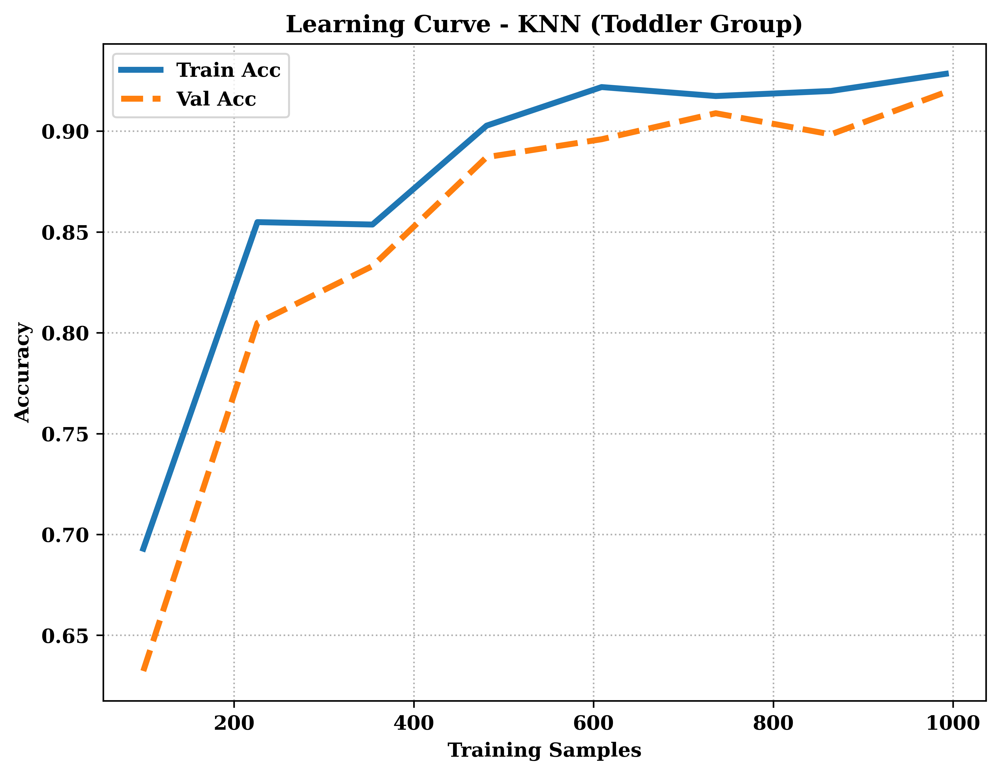


===== FINAL TEST METRICS =====
Accuracy:                 0.9003
Precision (Weighted):     0.8991
Recall (Weighted):        0.9003
Weighted F1-Score:        0.8994
Macro F1-Score:           0.8119
ROC-AUC (Weighted):       0.9902
Log-Loss:                 0.2736


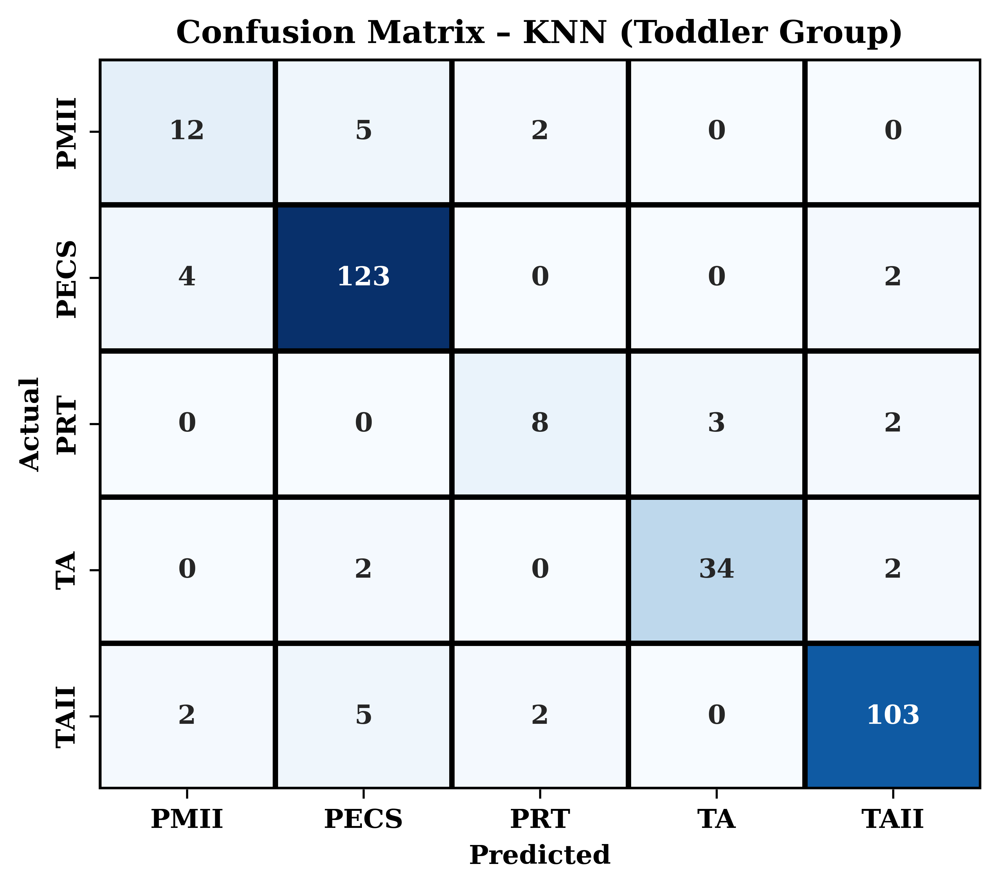

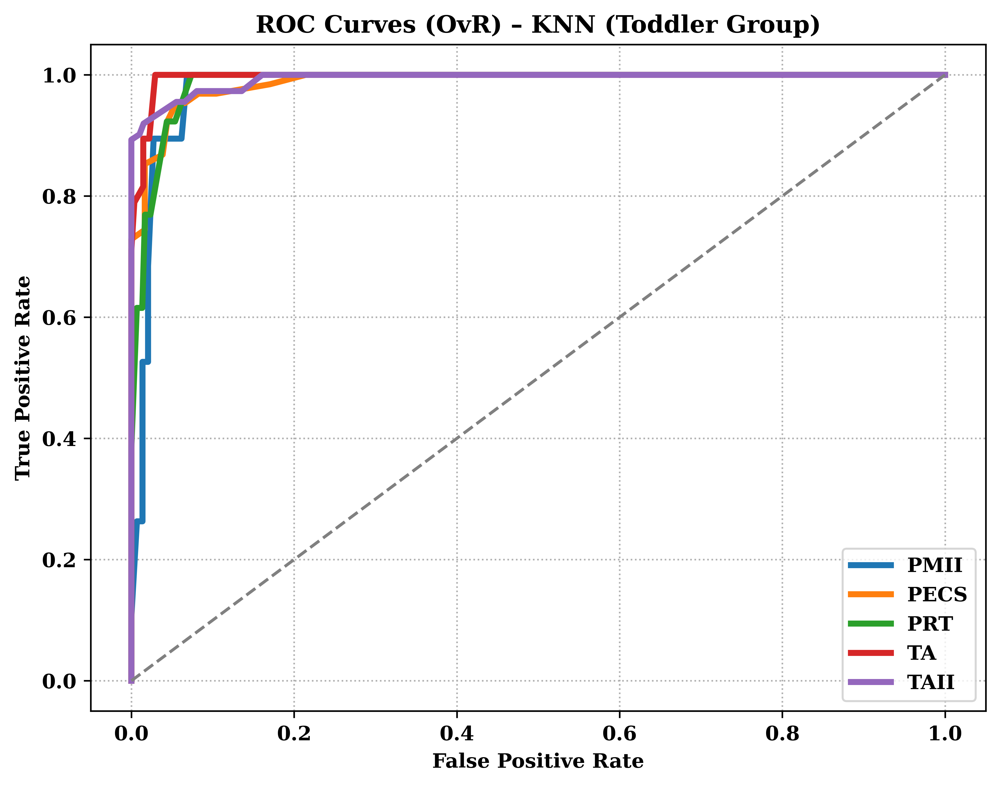


BOOTSTRAP METRICS CI
Accuracy: mean=0.9008, std=0.0170, 95%CI=[0.8650-0.9325]
Weighted F1: mean=0.8998, std=0.0174, 95%CI=[0.8652-0.9325]
Macro F1: mean=0.8094, std=0.0344, 95%CI=[0.7440-0.8737]
ROC-AUC: mean=0.9902, std=0.0027, 95%CI=[0.9838-0.9950]
Log-Loss: mean=0.2735, std=0.0206, 95%CI=[0.2347-0.3148]


In [ ]:
# ============================= KNN TODDLER=============================

# ============================================================
# 1. IMPORTS
# ============================================================
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import StratifiedKFold, GridSearchCV, learning_curve
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, StandardScaler, LabelEncoder, label_binarize
from sklearn.impute import SimpleImputer
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import *
from sklearn.base import clone
from sklearn.utils import resample
from collections import Counter
import warnings
warnings.filterwarnings("ignore")

plt.rcParams.update({
    "font.family": "serif",
    "font.weight": "bold",
    "axes.labelweight": "bold",
    "axes.titleweight": "bold"
})

# ============================================================
# 2. LOAD DATA
# ============================================================
train_path = "/content/drive/MyDrive/Colab Notebooks/My Thesis on ASD Education/ASD_Datasets/ToddlerGroup_MERGED_train.csv"
test_path  = "/content/drive/MyDrive/Colab Notebooks/My Thesis on ASD Education/ASD_Datasets/ToddlerGroup_MERGED_test.csv"

df_train = pd.read_csv(train_path)
df_test  = pd.read_csv(test_path)

drop_cols = ["Case_No", "Class_ASD", "Score", "Teaching_Strategy"]

X_train = df_train.drop(columns=drop_cols)
y_train = df_train["Teaching_Strategy"]
X_test  = df_test.drop(columns=drop_cols)
y_test  = df_test["Teaching_Strategy"]

# ============================================================
# 3. HANDLE MISSING VALUES
# ============================================================
placeholders = ['?', '.', 'NA', '', '@', 'NONE']
for ph in placeholders:
    X_train.replace(ph, np.nan, inplace=True)
    X_test.replace(ph, np.nan, inplace=True)

numeric_imputer = SimpleImputer(strategy='median')
categorical_imputer = SimpleImputer(strategy='most_frequent')

# ============================================================
# 4. PREPROCESSING
# ============================================================
numeric_cols = [f"A{i}" for i in range(1, 11)] + ["Age"]
categorical_cols = [c for c in X_train.columns if c not in numeric_cols]

ohe = OneHotEncoder(drop="first", handle_unknown="ignore", sparse_output=False)

le = LabelEncoder()
y_train_enc = le.fit_transform(y_train.astype(str))
y_test_enc  = le.transform(y_test.astype(str))

classes = le.classes_
n_classes = len(classes)

strategy_short = {
    "Pivotal Response Treatment": "PRT",
    "Task Analysis": "TA",
    "Peer Mediated Instruction and Intervention": "PMII",
    "Picture Exchange Communication System": "PECS",
    "Technology Aided Instruction and Intervention": "TAII"
}
short_classes = [strategy_short.get(c.replace("_"," "), c) for c in classes]

preprocessor = ColumnTransformer(transformers=[
    ('num', Pipeline([('imputer', numeric_imputer)]), numeric_cols),
    ('cat', Pipeline([('imputer', categorical_imputer), ('ohe', ohe)]), categorical_cols)
])

# ============================================================
# 5. PIPELINE
# ============================================================
pipe = Pipeline([
    ("preproc", preprocessor),
    ("scaler", StandardScaler()),
    ("feature_select", SelectKBest(score_func=f_classif)),
    ("clf", KNeighborsClassifier())
])

# ============================================================
# 6. PARAM GRID
# ============================================================
param_grid = {
    "feature_select__k": np.arange(1,29),
    "clf__n_neighbors": [15, 21, 25],
    "clf__weights": ["uniform"],
    "clf__p": [1, 2]
}

outer_cv = StratifiedKFold(5, shuffle=True, random_state=42)
inner_cv = StratifiedKFold(5, shuffle=True, random_state=42)

# ============================================================
# 7. NESTED CV
# ============================================================
KNN_toddler_outer_scores = []
KNN_toddler_outer_params = []

print("Starting Nested CV (KNN Toddler)")

for fold, (tr_idx, val_idx) in enumerate(outer_cv.split(X_train, y_train_enc), 1):
    X_tr, X_val = X_train.iloc[tr_idx], X_train.iloc[val_idx]
    y_tr, y_val = y_train_enc[tr_idx], y_train_enc[val_idx]

    grid = GridSearchCV(pipe, param_grid, cv=inner_cv,
                        scoring="accuracy", n_jobs=-1)
    grid.fit(X_tr, y_tr)

    pred = grid.best_estimator_.predict(X_val)
    acc = accuracy_score(y_val, pred)

    #Store fold-wise accuracy
    KNN_toddler_outer_scores.append(acc)
    KNN_toddler_outer_params.append(grid.best_params_)

    print(f"Fold {fold} complete: Accuracy = {accuracy_score(y_val, pred):.4f}")

print("\n===== KNN Toddler OUTER FOLD SCORES =====")
for i, score in enumerate(KNN_toddler_outer_scores, 1):
    print(f"Fold {i}: {score:.4f}")

print("\KNN_outer_scores:")
print(KNN_toddler_outer_scores)

print("\nOuter CV Accuracy: %.4f ± %.4f" % (np.mean(KNN_toddler_outer_scores), np.std(KNN_toddler_outer_scores)))

# ============================================================
# 8. FINAL GRID SEARCH + 1-SE
# ============================================================
final_search = GridSearchCV(pipe, param_grid,
                            cv=inner_cv,
                            scoring="accuracy",
                            n_jobs=-1)

final_search.fit(X_train, y_train_enc)
results = pd.DataFrame(final_search.cv_results_)

best_idx = results["mean_test_score"].idxmax()
max_mean = results.loc[best_idx, "mean_test_score"]
se = results.loc[best_idx, "std_test_score"] / np.sqrt(inner_cv.get_n_splits())
threshold = max_mean - se

candidates = results[results["mean_test_score"] >= threshold].copy()

candidates = candidates.sort_values(
    by=["param_clf__n_neighbors", "param_clf__p"],
    ascending=[True, True]
)

final_params = candidates.iloc[0]["params"]

final_model = clone(pipe)
final_model.set_params(**final_params)
final_model.fit(X_train, y_train_enc)

print("\n===== FINAL 1-SE SELECTED PARAMETERS =====")
for k, v in final_params.items():
    print(f"{k}: {v}")
print("="*50)

# ============================================================
# 9. LEARNING CURVE
# ============================================================
ts, train_acc, val_acc = learning_curve(
    final_model, X_train, y_train_enc,
    cv=outer_cv, scoring="accuracy",
    train_sizes=np.linspace(0.1,1.0,8), n_jobs=-1
)

plt.figure(figsize=(8,6), dpi=600)
plt.plot(ts, train_acc.mean(axis=1), linewidth=3, label="Train Acc")
plt.plot(ts, val_acc.mean(axis=1), linestyle="--", linewidth=3, label="Val Acc")
plt.xlabel("Training Samples")
plt.ylabel("Accuracy")
plt.title("Learning Curve - KNN (Toddler Group)")
plt.legend()
plt.grid(True, linestyle=":")
plt.show()

# ============================================================
# 10. FINAL TEST EVALUATION
# ============================================================
y_test_pred = final_model.predict(X_test)
y_test_prob = final_model.predict_proba(X_test)
y_test_bin = label_binarize(y_test_enc, classes=range(n_classes))

print("\n===== FINAL TEST METRICS =====")
print("="*40)
print(f"{'Accuracy:':25s} {accuracy_score(y_test_enc, y_test_pred):.4f}")
print(f"{'Precision (Weighted):':25s} {precision_score(y_test_enc, y_test_pred, average='weighted'):.4f}")
print(f"{'Recall (Weighted):':25s} {recall_score(y_test_enc, y_test_pred, average='weighted'):.4f}")
print(f"{'Weighted F1-Score:':25s} {f1_score(y_test_enc, y_test_pred, average='weighted'):.4f}")
print(f"{'Macro F1-Score:':25s} {f1_score(y_test_enc, y_test_pred, average='macro'):.4f}")
print(f"{'ROC-AUC (Weighted):':25s} {roc_auc_score(y_test_bin, y_test_prob, average='weighted', multi_class='ovr'):.4f}")
print(f"{'Log-Loss:':25s} {log_loss(y_test_enc, y_test_prob):.4f}")
print("="*40)

# ============================================================
# 11. CONFUSION MATRIX
# ============================================================
cm = confusion_matrix(y_test_enc, y_test_pred)

plt.figure(figsize=(6,5), dpi=600)
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=short_classes,
            yticklabels=short_classes,
            linewidths=2, linecolor="black", cbar=False)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix – KNN (Toddler Group)")
plt.show()

# ============================================================
# 12. ROC CURVES (OvR)
# ============================================================
plt.figure(figsize=(8,6), dpi=600)

for i in range(n_classes):
    fpr, tpr, _ = roc_curve(y_test_bin[:, i], y_test_prob[:, i])
    plt.plot(fpr, tpr, linewidth=3, label=short_classes[i])

plt.plot([0,1], [0,1], "--", color="gray")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curves (OvR) – KNN (Toddler Group)")
plt.legend()
plt.grid(True, linestyle=":")
plt.show()

# ============================================================
# 13. BOOTSTRAP CONFIDENCE INTERVALS
# ============================================================
def bootstrap_metrics(y_true, y_pred, y_prob, n_classes, n_bootstrap=1000):

    rng = np.random.RandomState(42)

    boot_metrics = {
        "Accuracy": [],
        "Weighted F1": [],
        "Macro F1": [],
        "ROC-AUC": [],
        "Log-Loss": []
    }

    y_true_bin = label_binarize(y_true, classes=range(n_classes))

    for _ in range(n_bootstrap):

        idx = resample(np.arange(len(y_true)), replace=True)

        if len(np.unique(y_true[idx])) < n_classes:
            continue

        boot_metrics["Accuracy"].append(
            accuracy_score(y_true[idx], y_pred[idx])
        )

        boot_metrics["Weighted F1"].append(
            f1_score(y_true[idx], y_pred[idx], average='weighted')
        )

        boot_metrics["Macro F1"].append(
            f1_score(y_true[idx], y_pred[idx], average='macro')
        )

        boot_metrics["ROC-AUC"].append(
            roc_auc_score(y_true_bin[idx], y_prob[idx],
                          average='weighted', multi_class='ovr')
        )

        boot_metrics["Log-Loss"].append(
            log_loss(y_true[idx], y_prob[idx])
        )

    summary = {}
    for m, v in boot_metrics.items():
        summary[m] = {
            "mean": np.mean(v),
            "std": np.std(v),
            "low_ci": np.percentile(v, 2.5),
            "high_ci": np.percentile(v, 97.5)
        }

    return summary

final_stats = bootstrap_metrics(
    y_test_enc, y_test_pred, y_test_prob, n_classes
)

print("\nBOOTSTRAP METRICS CI")
for metric, stats in final_stats.items():
    print(f"{metric}: mean={stats['mean']:.4f}, "
          f"std={stats['std']:.4f}, "
          f"95%CI=[{stats['low_ci']:.4f}-{stats['high_ci']:.4f}]")


# **KNN CHild**

Starting Nested CV (KNN Child)
Fold 1 complete: Accuracy = 0.9865
Fold 2 complete: Accuracy = 0.9189
Fold 3 complete: Accuracy = 0.9178
Fold 4 complete: Accuracy = 0.9726
Fold 5 complete: Accuracy = 0.9863

===== CHILD KNN OUTER FOLD SCORES =====
Fold 1: 0.9865
Fold 2: 0.9189
Fold 3: 0.9178
Fold 4: 0.9726
Fold 5: 0.9863
\KNN_outer_scores:
[0.9864864864864865, 0.918918918918919, 0.9178082191780822, 0.9726027397260274, 0.9863013698630136]

Outer CV Accuracy: 0.9564 ± 0.0315

===== FINAL 1-SE SELECTED PARAMETERS =====
clf__n_neighbors: 15
clf__p: 1
clf__weights: uniform
feature_select__k: 3


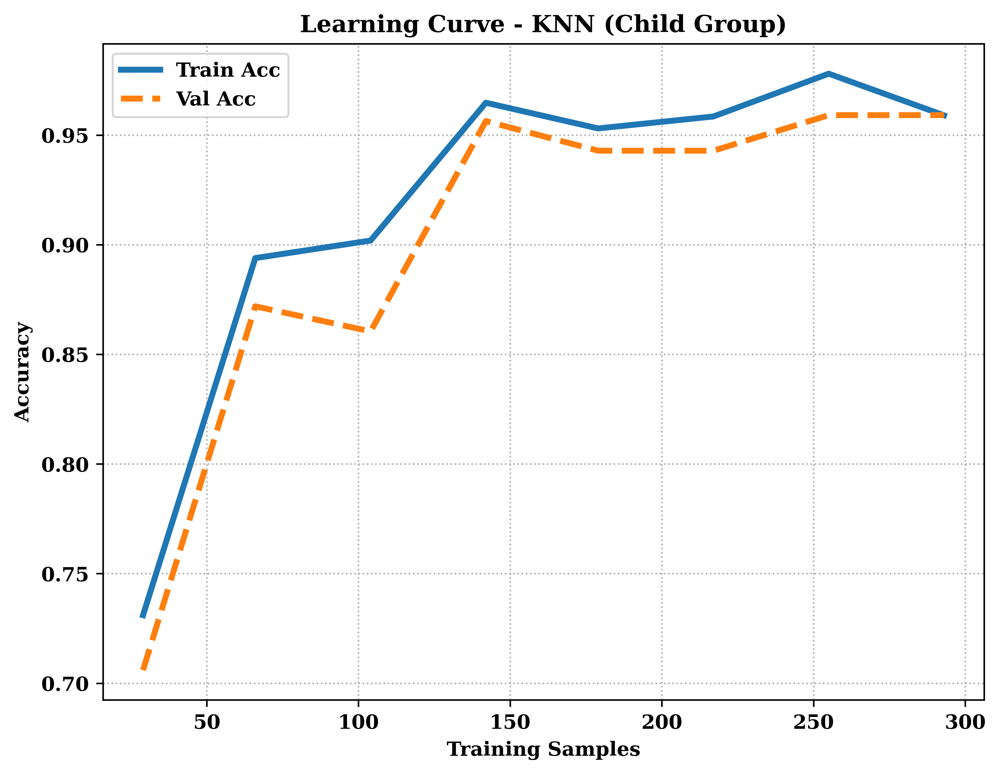


===== FINAL TEST METRICS =====
Accuracy:                 0.9574
Precision (Weighted):     0.9640
Recall (Weighted):        0.9574
Weighted F1-Score:        0.9585
Macro F1-Score:           0.9615
ROC-AUC (Weighted):       0.9779
Log-Loss:                 0.1200


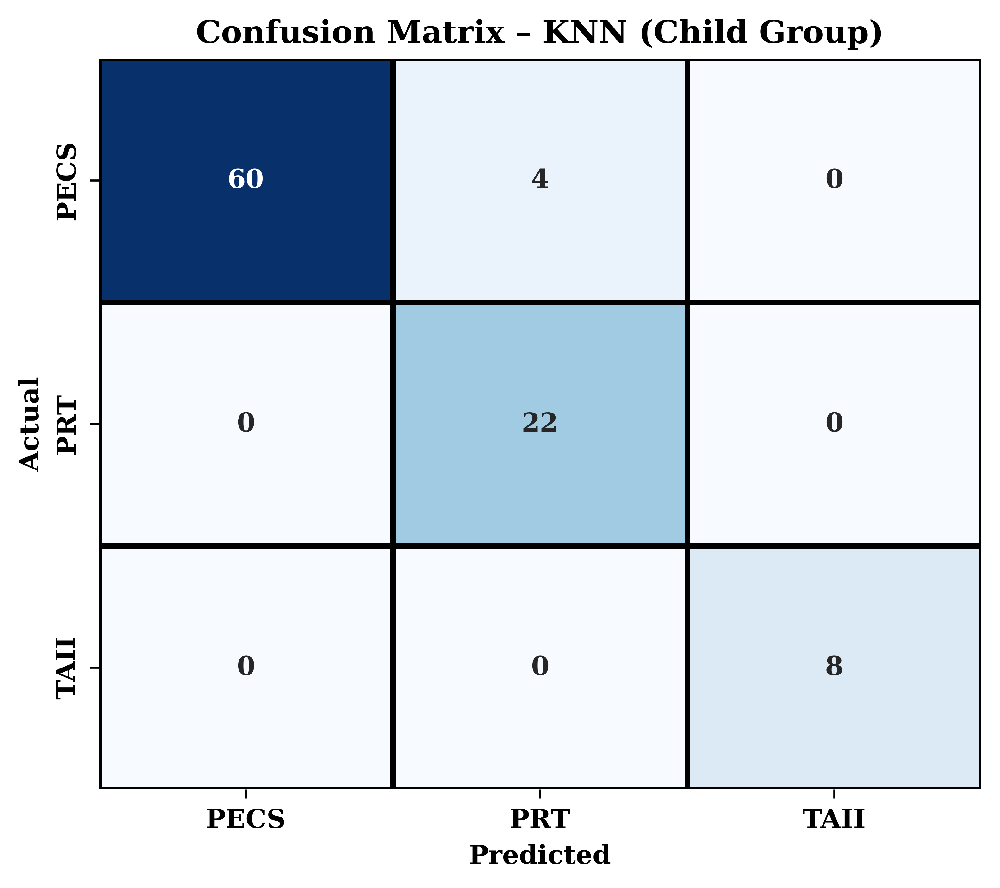

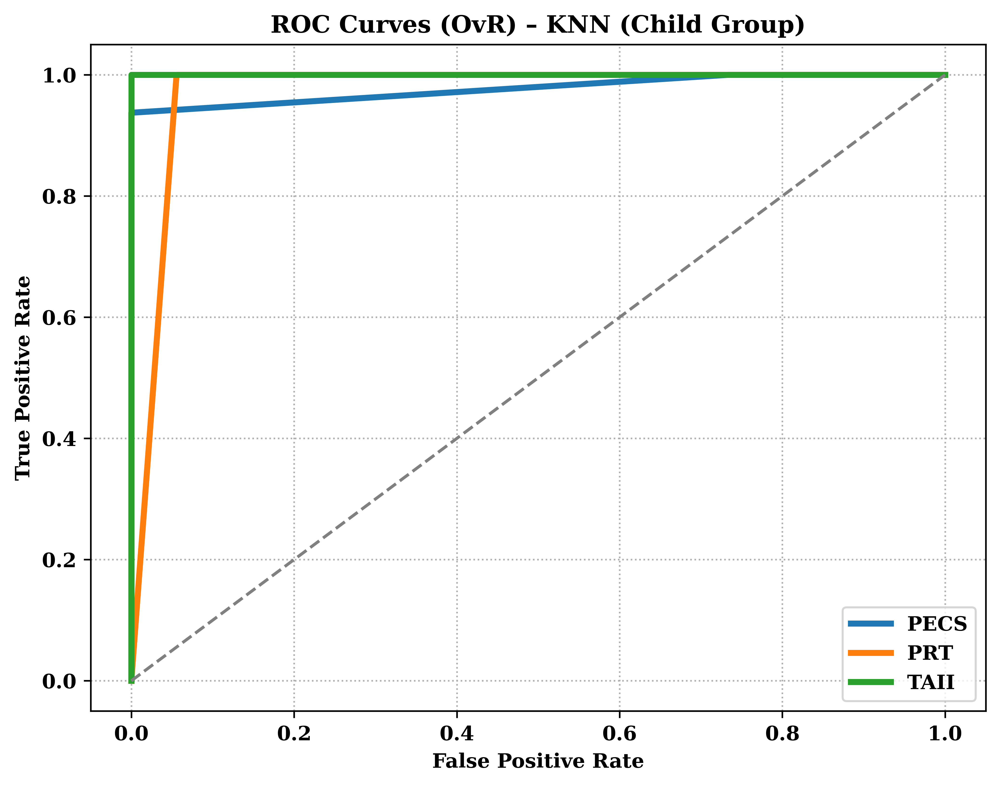


BOOTSTRAP METRICS CI
Accuracy: mean=0.9566, std=0.0204, 95%CI=[0.9149-0.9894]
Weighted F1: mean=0.9580, std=0.0193, 95%CI=[0.9179-0.9895]
Macro F1: mean=0.9600, std=0.0188, 95%CI=[0.9183-0.9909]
ROC-AUC: mean=0.9774, std=0.0111, 95%CI=[0.9526-0.9951]
Log-Loss: mean=0.1214, std=0.0409, 95%CI=[0.0504-0.2095]


In [ ]:
# ========================KNNN Child====================================
# 1. IMPORTS
# ============================================================
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import StratifiedKFold, GridSearchCV, learning_curve
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, StandardScaler, LabelEncoder, label_binarize
from sklearn.impute import SimpleImputer
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import *
from sklearn.base import clone
from sklearn.utils import resample
from collections import Counter
import warnings
warnings.filterwarnings("ignore")

plt.rcParams.update({
    "font.family": "serif",
    "font.weight": "bold",
    "axes.labelweight": "bold",
    "axes.titleweight": "bold"
})

# ============================================================
# 2. LOAD DATA
# ============================================================
train_path = "/content/drive/MyDrive/Colab Notebooks/My Thesis on ASD Education/ASD_Datasets/ChildGroup_MERGED_train.csv"
test_path  = "/content/drive/MyDrive/Colab Notebooks/My Thesis on ASD Education/ASD_Datasets/ChildGroup_MERGED_test.csv"

df_train = pd.read_csv(train_path)
df_test  = pd.read_csv(test_path)

drop_cols = ["Case_No", "Class_ASD", "Score", "Teaching_Strategy"]

X_train = df_train.drop(columns=drop_cols)
y_train = df_train["Teaching_Strategy"]
X_test  = df_test.drop(columns=drop_cols)
y_test  = df_test["Teaching_Strategy"]

# ============================================================
# 3. HANDLE MISSING VALUES
# ============================================================
placeholders = ['?', '.', 'NA', '', '@', 'NONE']
for ph in placeholders:
    X_train.replace(ph, np.nan, inplace=True)
    X_test.replace(ph, np.nan, inplace=True)

numeric_imputer = SimpleImputer(strategy='median')
categorical_imputer = SimpleImputer(strategy='most_frequent')

# ============================================================
# 4. PREPROCESSING
# ============================================================
numeric_cols = [f"A{i}" for i in range(1, 11)] + ["Age"]
categorical_cols = [c for c in X_train.columns if c not in numeric_cols]

ohe = OneHotEncoder(drop="first", handle_unknown="ignore", min_frequency=0.05,sparse_output=False)

le = LabelEncoder()
y_train_enc = le.fit_transform(y_train.astype(str))
y_test_enc  = le.transform(y_test.astype(str))

classes = le.classes_
n_classes = len(classes)

strategy_short = {
    "Pivotal Response Treatment": "PRT",
    "Task Analysis": "TA",
    "Peer Mediated Instruction and Intervention": "PMII",
    "Picture Exchange Communication System": "PECS",
    "Technology Aided Instruction and Intervention": "TAII"
}
short_classes = [strategy_short.get(c.replace("_"," "), c) for c in classes]

preprocessor = ColumnTransformer(transformers=[
    ('num', Pipeline([('imputer', numeric_imputer)]), numeric_cols),
    ('cat', Pipeline([('imputer', categorical_imputer), ('ohe', ohe)]), categorical_cols)
])

# ============================================================
# 5. PIPELINE
# ============================================================
pipe = Pipeline([
    ("preproc", preprocessor),
    ("scaler", StandardScaler()),
    ("feature_select", SelectKBest(score_func=f_classif)),
    ("clf", KNeighborsClassifier())
])

# ============================================================
# 6. PARAM GRID
# ============================================================
param_grid = {
    "feature_select__k": np.arange(1,30),
    "clf__n_neighbors": [15, 21, 25],
    "clf__weights": ["uniform"],
    "clf__p": [1, 2]
}

outer_cv = StratifiedKFold(5, shuffle=True, random_state=42)
inner_cv = StratifiedKFold(5, shuffle=True, random_state=42)

# ============================================================
# 7. NESTED CV
# ============================================================
KNN_child_outer_scores = []
KNN_child_outer_params = []

print("Starting Nested CV (KNN Child)")

for fold, (tr_idx, val_idx) in enumerate(outer_cv.split(X_train, y_train_enc), 1):
    X_tr, X_val = X_train.iloc[tr_idx], X_train.iloc[val_idx]
    y_tr, y_val = y_train_enc[tr_idx], y_train_enc[val_idx]

    grid = GridSearchCV(pipe, param_grid, cv=inner_cv,
                        scoring="accuracy", n_jobs=-1)
    grid.fit(X_tr, y_tr)

    pred = grid.best_estimator_.predict(X_val)
    acc = accuracy_score(y_val, pred)

    #Store fold-wise accuracy
    KNN_child_outer_scores.append(acc)
    KNN_child_outer_params.append(grid.best_params_)

    print(f"Fold {fold} complete: Accuracy = {accuracy_score(y_val, pred):.4f}")

print("\n===== CHILD KNN OUTER FOLD SCORES =====")
for i, score in enumerate(KNN_child_outer_scores, 1):
    print(f"Fold {i}: {score:.4f}")

print("\KNN_outer_scores:")
print(KNN_child_outer_scores)

print("\nOuter CV Accuracy: %.4f ± %.4f" % (np.mean(KNN_child_outer_scores), np.std(KNN_child_outer_scores)))

# ============================================================
# 8. FINAL GRID SEARCH + 1-SE
# ============================================================
final_search = GridSearchCV(pipe, param_grid,
                            cv=inner_cv,
                            scoring="accuracy",
                            n_jobs=-1)

final_search.fit(X_train, y_train_enc)
results = pd.DataFrame(final_search.cv_results_)

best_idx = results["mean_test_score"].idxmax()
max_mean = results.loc[best_idx, "mean_test_score"]
se = results.loc[best_idx, "std_test_score"] / np.sqrt(inner_cv.get_n_splits())
threshold = max_mean - se

candidates = results[results["mean_test_score"] >= threshold].copy()

candidates = candidates.sort_values(
    by=["param_clf__n_neighbors", "param_clf__p"],
    ascending=[True, True]
)

final_params = candidates.iloc[0]["params"]

final_model = clone(pipe)
final_model.set_params(**final_params)
final_model.fit(X_train, y_train_enc)

print("\n===== FINAL 1-SE SELECTED PARAMETERS =====")
for k, v in final_params.items():
    print(f"{k}: {v}")
print("="*50)

# ============================================================
# 9. LEARNING CURVE
# ============================================================
ts, train_acc, val_acc = learning_curve(
    final_model, X_train, y_train_enc,
    cv=outer_cv, scoring="accuracy",
    train_sizes=np.linspace(0.1,1.0,8), n_jobs=-1
)

plt.figure(figsize=(8,6), dpi=600)
plt.plot(ts, train_acc.mean(axis=1), linewidth=3, label="Train Acc")
plt.plot(ts, val_acc.mean(axis=1), linestyle="--", linewidth=3, label="Val Acc")
plt.xlabel("Training Samples")
plt.ylabel("Accuracy")
plt.title("Learning Curve - KNN (Child Group)")
plt.legend()
plt.grid(True, linestyle=":")
plt.show()

# ============================================================
# 10. FINAL TEST EVALUATION
# ============================================================
y_test_pred = final_model.predict(X_test)
y_test_prob = final_model.predict_proba(X_test)
y_test_bin = label_binarize(y_test_enc, classes=range(n_classes))

print("\n===== FINAL TEST METRICS =====")
print("="*40)
print(f"{'Accuracy:':25s} {accuracy_score(y_test_enc, y_test_pred):.4f}")
print(f"{'Precision (Weighted):':25s} {precision_score(y_test_enc, y_test_pred, average='weighted'):.4f}")
print(f"{'Recall (Weighted):':25s} {recall_score(y_test_enc, y_test_pred, average='weighted'):.4f}")
print(f"{'Weighted F1-Score:':25s} {f1_score(y_test_enc, y_test_pred, average='weighted'):.4f}")
print(f"{'Macro F1-Score:':25s} {f1_score(y_test_enc, y_test_pred, average='macro'):.4f}")
print(f"{'ROC-AUC (Weighted):':25s} {roc_auc_score(y_test_bin, y_test_prob, average='weighted', multi_class='ovr'):.4f}")
print(f"{'Log-Loss:':25s} {log_loss(y_test_enc, y_test_prob):.4f}")
print("="*40)

# ============================================================
# 11. CONFUSION MATRIX
# ============================================================
cm = confusion_matrix(y_test_enc, y_test_pred)

plt.figure(figsize=(6,5), dpi=600)
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=short_classes,
            yticklabels=short_classes,
            linewidths=2, linecolor="black", cbar=False)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix – KNN (Child Group)")
plt.show()

# ============================================================
# 12. ROC CURVES (OvR)
# ============================================================
plt.figure(figsize=(8,6), dpi=600)

for i in range(n_classes):
    fpr, tpr, _ = roc_curve(y_test_bin[:, i], y_test_prob[:, i])
    plt.plot(fpr, tpr, linewidth=3, label=short_classes[i])

plt.plot([0,1], [0,1], "--", color="gray")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curves (OvR) – KNN (Child Group)")
plt.legend()
plt.grid(True, linestyle=":")
plt.show()

# ============================================================
# 13. BOOTSTRAP CONFIDENCE INTERVALS
# ============================================================
def bootstrap_metrics(y_true, y_pred, y_prob, n_classes, n_bootstrap=1000):

    rng = np.random.RandomState(42)

    boot_metrics = {
        "Accuracy": [],
        "Weighted F1": [],
        "Macro F1": [],
        "ROC-AUC": [],
        "Log-Loss": []
    }

    y_true_bin = label_binarize(y_true, classes=range(n_classes))

    for _ in range(n_bootstrap):

        idx = resample(np.arange(len(y_true)), replace=True)

        if len(np.unique(y_true[idx])) < n_classes:
            continue

        boot_metrics["Accuracy"].append(
            accuracy_score(y_true[idx], y_pred[idx])
        )

        boot_metrics["Weighted F1"].append(
            f1_score(y_true[idx], y_pred[idx], average='weighted')
        )

        boot_metrics["Macro F1"].append(
            f1_score(y_true[idx], y_pred[idx], average='macro')
        )

        boot_metrics["ROC-AUC"].append(
            roc_auc_score(y_true_bin[idx], y_prob[idx],
                          average='weighted', multi_class='ovr')
        )

        boot_metrics["Log-Loss"].append(
            log_loss(y_true[idx], y_prob[idx])
        )

    summary = {}
    for m, v in boot_metrics.items():
        summary[m] = {
            "mean": np.mean(v),
            "std": np.std(v),
            "low_ci": np.percentile(v, 2.5),
            "high_ci": np.percentile(v, 97.5)
        }

    return summary

final_stats = bootstrap_metrics(
    y_test_enc, y_test_pred, y_test_prob, n_classes
)

print("\nBOOTSTRAP METRICS CI")
for metric, stats in final_stats.items():
    print(f"{metric}: mean={stats['mean']:.4f}, "
          f"std={stats['std']:.4f}, "
          f"95%CI=[{stats['low_ci']:.4f}-{stats['high_ci']:.4f}]")




# **SVM Toddler**

Starting Nested CV (SVM Toddler)
Fold 1 complete: Accuracy = 0.9032
Fold 2 complete: Accuracy = 0.9032
Fold 3 complete: Accuracy = 0.9194
Fold 4 complete: Accuracy = 0.8790
Fold 5 complete: Accuracy = 0.9032

===== SVM Toddler OUTER FOLD SCORES =====
Fold 1: 0.9032
Fold 2: 0.9032
Fold 3: 0.9194
Fold 4: 0.8790
Fold 5: 0.9032
\SVM_outer_scores:
[0.9032258064516129, 0.9032258064516129, 0.9193548387096774, 0.8790322580645161, 0.9032258064516129]

Outer CV Accuracy: 0.9016 ± 0.0129

Applying 1-SE rule...

Selected parameters:
{'clf__C': 0.1, 'clf__gamma': 'scale', 'feature_select__k': np.int64(9)}

Top-k selected features:
remainder__A1
remainder__A2
remainder__A3
remainder__A4
remainder__A5
remainder__A6
remainder__A8
remainder__A9
remainder__A10
Total selected: 9


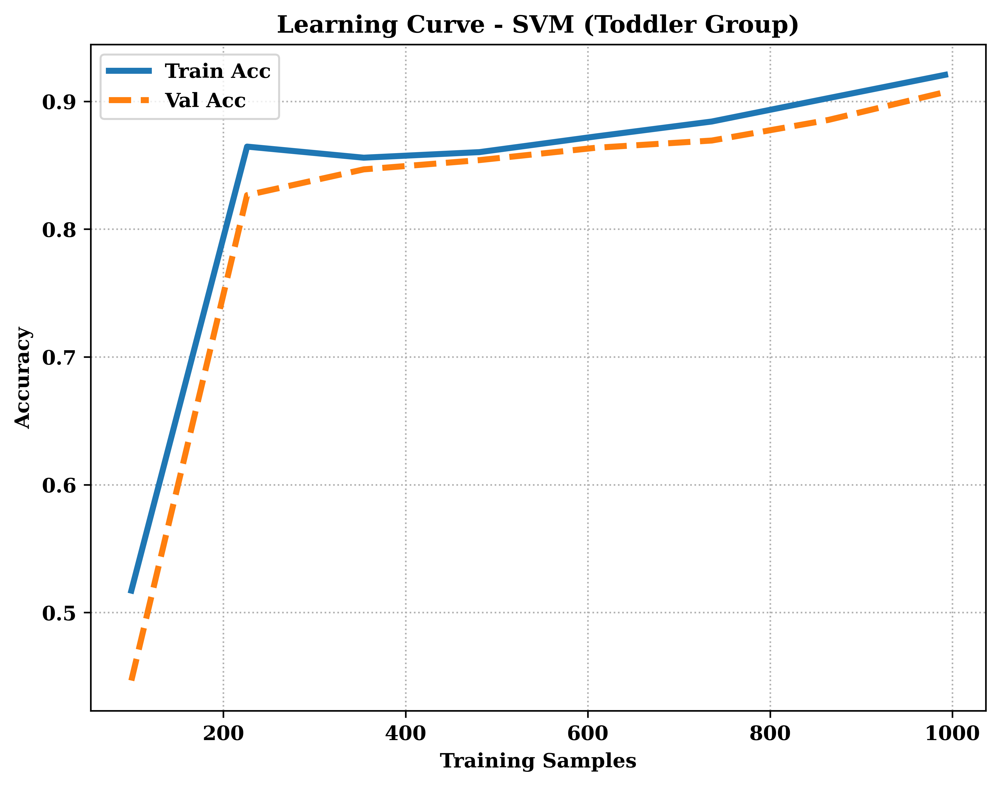


===== FINAL TEST METRICS =====
Accuracy:                 0.9100
Precision (Weighted):     0.9363
Recall (Weighted):        0.9100
Weighted F1-Score:        0.9145
Macro F1-Score:           0.8574
ROC-AUC (Weighted):       0.9992
Log-Loss:                 0.0686
Calculating Bootstrap Statistics (1000 iterations)...


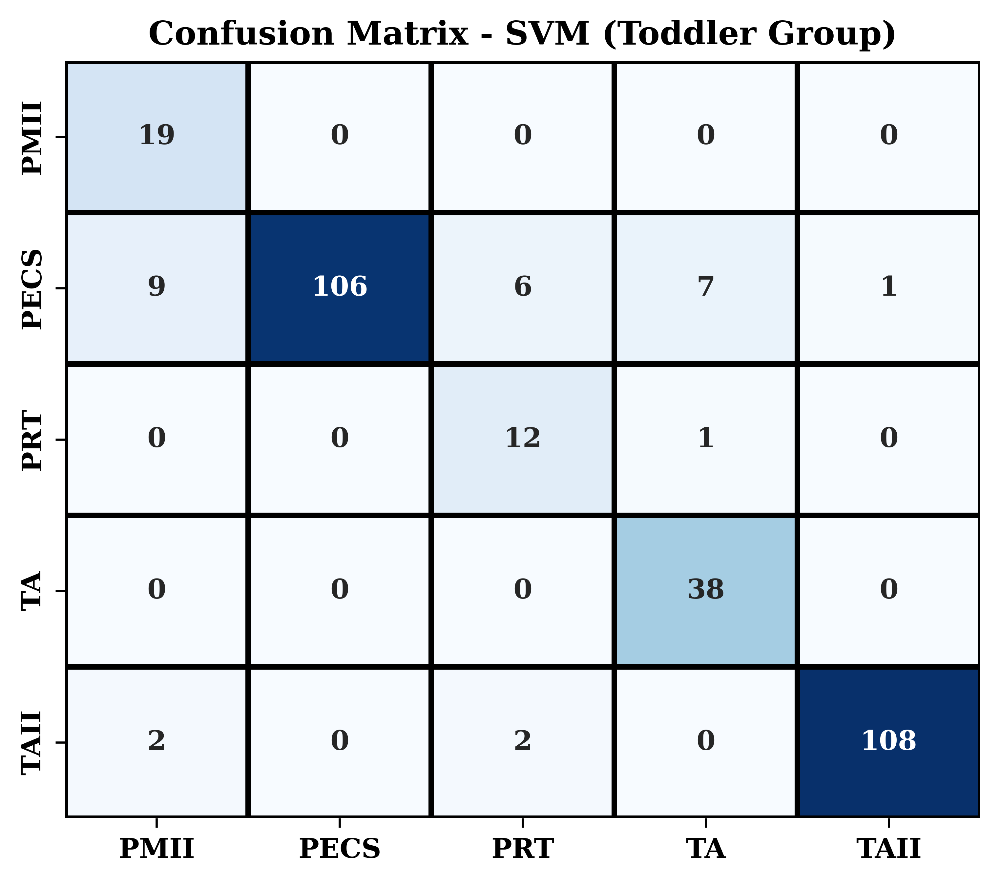

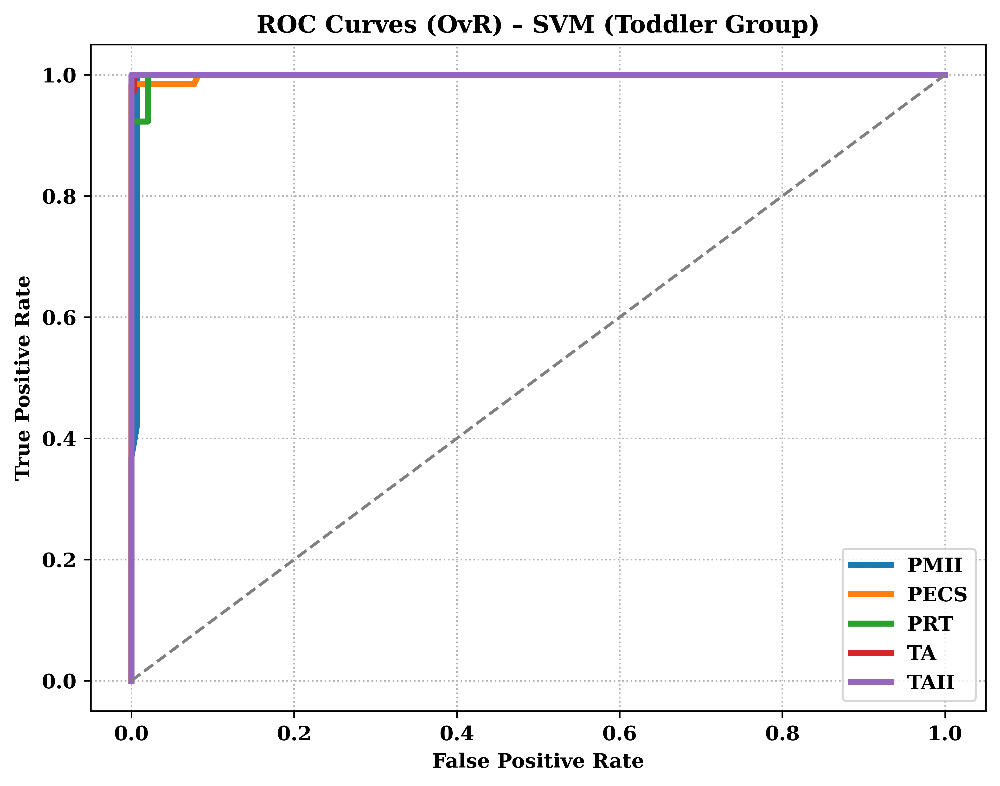


METRIC                    | MEAN     | STD      | 95% CONFIDENCE INTERVAL
-------------------------------------------------------------------------------------
Accuracy                  | 0.9096   | 0.0167   | [0.8746 - 0.9390]
Precision (Weighted)      | 0.9382   | 0.0092   | [0.9208 - 0.9558]
Recall (Weighted)         | 0.9096   | 0.0167   | [0.8746 - 0.9390]
Weighted F1               | 0.9148   | 0.0152   | [0.8844 - 0.9438]
Macro F1                  | 0.8549   | 0.0284   | [0.7959 - 0.9082]
ROC-AUC                   | 0.9991   | 0.0006   | [0.9978 - 1.0000]
Log-Loss                  | 0.0690   | 0.0142   | [0.0433 - 0.0991]


In [ ]:
# ========================SVM Toddler===========================
# 1. IMPORTS
# ==================================================
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

from sklearn.model_selection import StratifiedKFold, GridSearchCV, learning_curve
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, StandardScaler, LabelEncoder
from sklearn.impute import SimpleImputer
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.svm import SVC
from sklearn.metrics import *
from sklearn.base import clone
from sklearn.utils import resample
from sklearn.preprocessing import label_binarize

# ============================================================
# 2. DATA LOADING
# ============================================================
train_path = "/content/drive/MyDrive/Colab Notebooks/My Thesis on ASD Education/ASD_Datasets/ToddlerGroup_MERGED_train.csv"
test_path  = "/content/drive/MyDrive/Colab Notebooks/My Thesis on ASD Education/ASD_Datasets/ToddlerGroup_MERGED_test.csv"

df_train = pd.read_csv(train_path)
df_test  = pd.read_csv(test_path)

drop_cols = ["Class_ASD", "Teaching_Strategy", "Score", "Case_No"]

X_train = df_train.drop(columns=drop_cols)
y_train = df_train["Teaching_Strategy"]

X_test  = df_test.drop(columns=drop_cols)
y_test  = df_test["Teaching_Strategy"]

# ============================================================
# 3. TARGET ENCODING
# ============================================================
target_le = LabelEncoder()
y_train_enc = target_le.fit_transform(y_train.astype(str))
y_test_enc  = target_le.transform(y_test.astype(str))

classes   = target_le.classes_
n_classes = len(classes)

strategy_short = {
    "Pivotal Response Treatment": "PRT",
    "Task Analysis": "TA",
    "Peer Mediated Instruction and Intervention": "PMII",
    "Picture Exchange Communication System": "PECS",
    "Technology Aided Instruction and Intervention": "TAII"
}
short_classes = [strategy_short[c.replace("_"," ")] for c in classes]

# ============================================================
# 4. PREPROCESSING
# ============================================================
numeric_cols = [f"A{i}" for i in range(1, 11)] + ["Age"]
categorical_cols = [c for c in X_train.columns if c not in numeric_cols]

preprocessor = ColumnTransformer(
    transformers=[
        ("cat", Pipeline([
            ("imputer", SimpleImputer(strategy="most_frequent")),
            ("ohe", OneHotEncoder(handle_unknown="ignore", sparse_output=False))
        ]), categorical_cols),
    ],
    remainder="passthrough"
)

# ============================================================
# 5. PIPELINE
# ============================================================
pipe = Pipeline([
    ("preproc", preprocessor),
    ("scaler", StandardScaler()),
    ("feature_select", SelectKBest(f_classif)),
    ("clf", SVC(kernel="rbf", probability=True,
                class_weight="balanced",
                random_state=42))
])


param_grid = {
    "feature_select__k": np.arange(1, 28),
    "clf__C": [0.001, 0.01, 0.1],
    "clf__gamma": ["scale", 0.01, 0.05]
}

outer_cv = StratifiedKFold(5, shuffle=True, random_state=42)
inner_cv = StratifiedKFold(5, shuffle=True, random_state=42)


# ============================================================
# 6. NESTED CV (validation only)
# ============================================================

SVM_toddler_outer_scores = []
SVM_toddler_outer_params = []

print("Starting Nested CV (SVM Toddler)")

for fold, (tr_idx, val_idx) in enumerate(outer_cv.split(X_train, y_train_enc), 1):
    X_tr, X_val = X_train.iloc[tr_idx], X_train.iloc[val_idx]
    y_tr, y_val = y_train_enc[tr_idx], y_train_enc[val_idx]

    grid = GridSearchCV(pipe, param_grid, cv=inner_cv,
                        scoring="accuracy", n_jobs=-1)
    grid.fit(X_tr, y_tr)

    pred = grid.best_estimator_.predict(X_val)
    acc = accuracy_score(y_val, pred)

    #Store fold-wise accuracy
    SVM_toddler_outer_scores.append(acc)
    SVM_toddler_outer_params.append(grid.best_params_)

    print(f"Fold {fold} complete: Accuracy = {accuracy_score(y_val, pred):.4f}")

print("\n===== SVM Toddler OUTER FOLD SCORES =====")
for i, score in enumerate(SVM_toddler_outer_scores, 1):
    print(f"Fold {i}: {score:.4f}")

print("\SVM_outer_scores:")
print(SVM_toddler_outer_scores)

print("\nOuter CV Accuracy: %.4f ± %.4f" % (np.mean(SVM_toddler_outer_scores), np.std(SVM_toddler_outer_scores)))

# ============================================================
# 7. FINAL GLOBAL REFIT (1-SE rule)
# ============================================================
print("\nApplying 1-SE rule...")

search = GridSearchCV(
    pipe,
    param_grid,
    cv=inner_cv,
    scoring="accuracy",
    n_jobs=-1,
    return_train_score=True
)

search.fit(X_train, y_train_enc)
results = pd.DataFrame(search.cv_results_)

best_idx = results["mean_test_score"].idxmax()
mean_best = results.loc[best_idx, "mean_test_score"]
std_best  = results.loc[best_idx, "std_test_score"]

se = std_best / np.sqrt(inner_cv.get_n_splits())
threshold = mean_best - se

candidates = results[results["mean_test_score"] >= threshold].copy()


# ignore k when simplifying
def gamma_rank(g):
    return 99 if g == "scale" else float(g)

candidates["gamma_rank"] = candidates["param_clf__gamma"].apply(gamma_rank)

candidates = candidates.sort_values(
    by=["param_clf__C", "gamma_rank", "mean_test_score"],
    ascending=[True, True, False]
)

final_params = candidates.iloc[0]["params"]

print("\nSelected parameters:")
print(final_params)


final_model = clone(pipe)
final_model.set_params(**final_params)
final_model.fit(X_train, y_train_enc)


# ============================================================
# 8. PRINT SELECTED FEATURES
# ============================================================
selector = final_model.named_steps["feature_select"]
feature_names = final_model.named_steps["preproc"].get_feature_names_out()

selected = feature_names[selector.get_support()]

print("\nTop-k selected features:")
for f in selected:
    print(f)

print("Total selected:", len(selected))


# ============================================================
# 9. LEARNING CURVE
# ============================================================
sizes, tr_acc, val_acc = learning_curve(
    final_model, X_train, y_train_enc,
    cv=outer_cv,
    scoring="accuracy",
    train_sizes=np.linspace(0.1, 1.0, 8),
    n_jobs=-1
)

plt.figure(figsize=(8,6), dpi=600)
plt.plot(sizes, tr_acc.mean(axis=1), linewidth=3, label="Train Acc")
plt.plot(sizes, val_acc.mean(axis=1), linestyle="--", linewidth=3, label="Val Acc")
plt.xlabel("Training Samples")
plt.ylabel("Accuracy")
plt.title("Learning Curve - SVM (Toddler Group)")
plt.legend()
plt.grid(True, linestyle=":")
plt.show()



# ============================================================

# 11. FINAL TEST EVALUATION & CONFUSION MATRIX

# ============================================================

y_test_pred = final_model.predict(X_test)
y_test_prob = final_model.predict_proba(X_test)
y_test_bin  = label_binarize(y_test_enc, classes=range(n_classes))

print("\n===== FINAL TEST METRICS =====")

print("="*40)

print(f"{'Accuracy:':25s} {accuracy_score(y_test_enc, y_test_pred):.4f}")
print(f"{'Precision (Weighted):':25s} {precision_score(y_test_enc, y_test_pred, average='weighted'):.4f}")
print(f"{'Recall (Weighted):':25s} {recall_score(y_test_enc, y_test_pred, average='weighted'):.4f}")
print(f"{'Weighted F1-Score:':25s} {f1_score(y_test_enc, y_test_pred, average='weighted'):.4f}")
print(f"{'Macro F1-Score:':25s} {f1_score(y_test_enc, y_test_pred, average='macro'):.4f}")
print(f"{'ROC-AUC (Weighted):':25s} {roc_auc_score(y_test_bin, y_test_prob, average='weighted', multi_class='ovr'):.4f}")
print(f"{'Log-Loss:':25s} {log_loss(y_test_enc, y_test_prob):.4f}")
print("="*40)

def bootstrap_metrics_report(y_true, y_pred, y_prob, n_classes, n_bootstrap=1000):

    rng = np.random.RandomState(42)

    metrics = {
        "Accuracy": [],
        "Precision (Weighted)": [],
        "Recall (Weighted)": [],
        "Weighted F1": [],
        "Macro F1": [],
        "ROC-AUC": [],
        "Log-Loss": []
    }

    y_true_bin = label_binarize(y_true, classes=range(n_classes))

    print(f"Calculating Bootstrap Statistics ({n_bootstrap} iterations)...")

    for _ in range(n_bootstrap):

        # correct sampling (NOT sklearn.resample)
        idx = rng.choice(len(y_true), len(y_true), replace=True)

        if len(np.unique(y_true[idx])) < n_classes:
            continue

        metrics["Accuracy"].append(accuracy_score(y_true[idx], y_pred[idx]))
        metrics["Precision (Weighted)"].append(precision_score(y_true[idx], y_pred[idx], average='weighted'))
        metrics["Recall (Weighted)"].append(recall_score(y_true[idx], y_pred[idx], average='weighted'))
        metrics["Weighted F1"].append(f1_score(y_true[idx], y_pred[idx], average='weighted'))
        metrics["Macro F1"].append(f1_score(y_true[idx], y_pred[idx], average='macro'))
        metrics["ROC-AUC"].append(roc_auc_score(y_true_bin[idx], y_prob[idx], average='weighted', multi_class='ovr'))
        metrics["Log-Loss"].append(log_loss(y_true[idx], y_prob[idx]))

    summary = {}

    for metric, values in metrics.items():

        if len(values) == 0:
            raise ValueError("Bootstrap failed: no valid samples collected.")

        summary[metric] = {
            "mean": np.mean(values),
            "std": np.std(values),
            "low_ci": np.percentile(values, 2.5),
            "high_ci": np.percentile(values, 97.5)
        }

    return summary

final_stats = bootstrap_metrics_report(y_test_enc, y_test_pred, y_test_prob, n_classes)



# ============================================================
# 12. CONFUSION MATRIX
# ============================================================
cm = confusion_matrix(y_test_enc, y_test_pred)
plt.figure(figsize=(6,5), dpi=600)
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=short_classes, yticklabels=short_classes,
            linewidths=2, linecolor="black", cbar=False)
plt.title("Confusion Matrix - SVM (Toddler Group)")
plt.show()

# ============================================================
# 13. ROC CURVES
# ============================================================
plt.figure(figsize=(8,6), dpi=600)
for i in range(n_classes):
    fpr, tpr, _ = roc_curve(y_test_bin[:, i], y_test_prob[:, i])
    plt.plot(fpr, tpr, linewidth=3, label=short_classes[i])
plt.plot([0,1], [0,1], "--", color="gray")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curves (OvR) – SVM (Toddler Group)")
plt.legend()
plt.grid(True, linestyle=":")
plt.show()

print("\n" + "="*85)
print(f"{'METRIC':25s} | {'MEAN':8s} | {'STD':8s} | {'95% CONFIDENCE INTERVAL'}")
print("-" * 85)
for metric, stats in final_stats.items():
    print(f"{metric:25s} | {stats['mean']:.4f}   | {stats['std']:.4f}   | [{stats['low_ci']:.4f} - {stats['high_ci']:.4f}]")
print("="*85)


# **SVM CHild**

Starting Nested CV (SVM child)
Fold 1 complete: Accuracy = 0.9865
Fold 2 complete: Accuracy = 0.8784
Fold 3 complete: Accuracy = 0.9178
Fold 4 complete: Accuracy = 0.9726
Fold 5 complete: Accuracy = 0.9863

===== SVM Child OUTER FOLD SCORES =====
Fold 1: 0.9865
Fold 2: 0.8784
Fold 3: 0.9178
Fold 4: 0.9726
Fold 5: 0.9863
\SVM_outer_scores :
[0.9864864864864865, 0.8783783783783784, 0.9178082191780822, 0.9726027397260274, 0.9863013698630136]

Outer CV Accuracy: 0.9483 ± 0.0432

Applying 1-SE rule...

Selected parameters:
{'clf__C': 0.1, 'clf__gamma': 'scale', 'feature_select__k': np.int64(3)}

Selected features:
['num__A2' 'num__A5' 'num__A8']
Total selected: 3


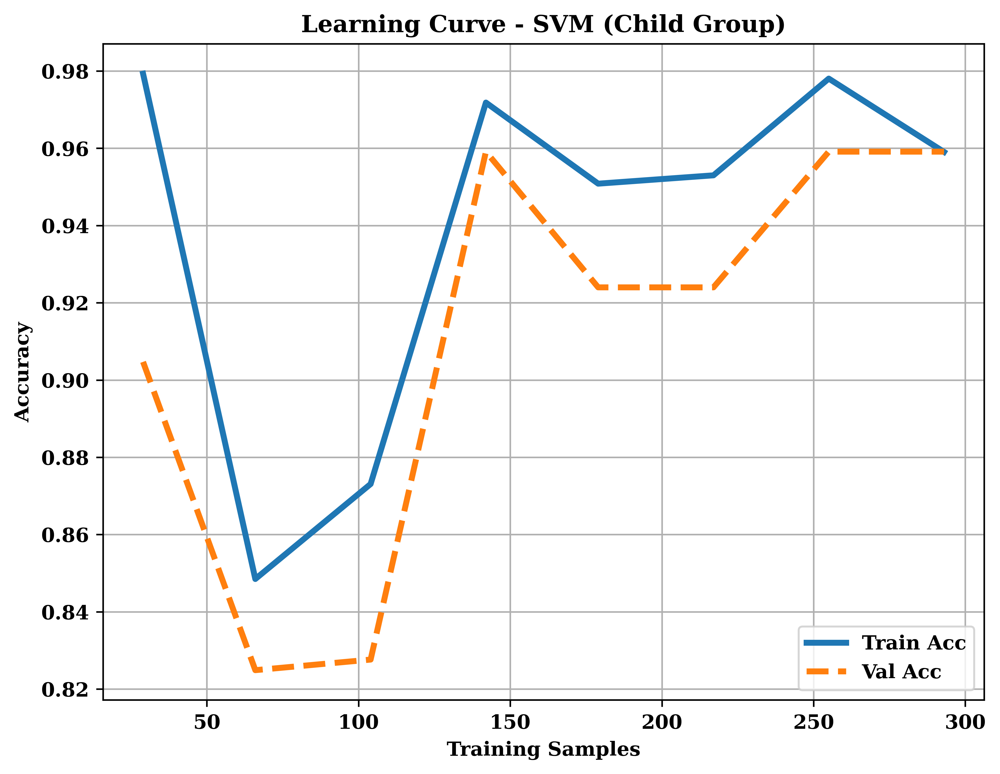


===== FINAL TEST RESULTS =====
Accuracy : 0.9574468085106383
Precision: 0.9639934533551554
F1       : 0.9585335163578128
Recall: 0.9574468085106383
Macro_ F1: 0.9614695340501792
ROC-AUC  : 0.9778959810874704
LogLoss  : 0.13111999392688406


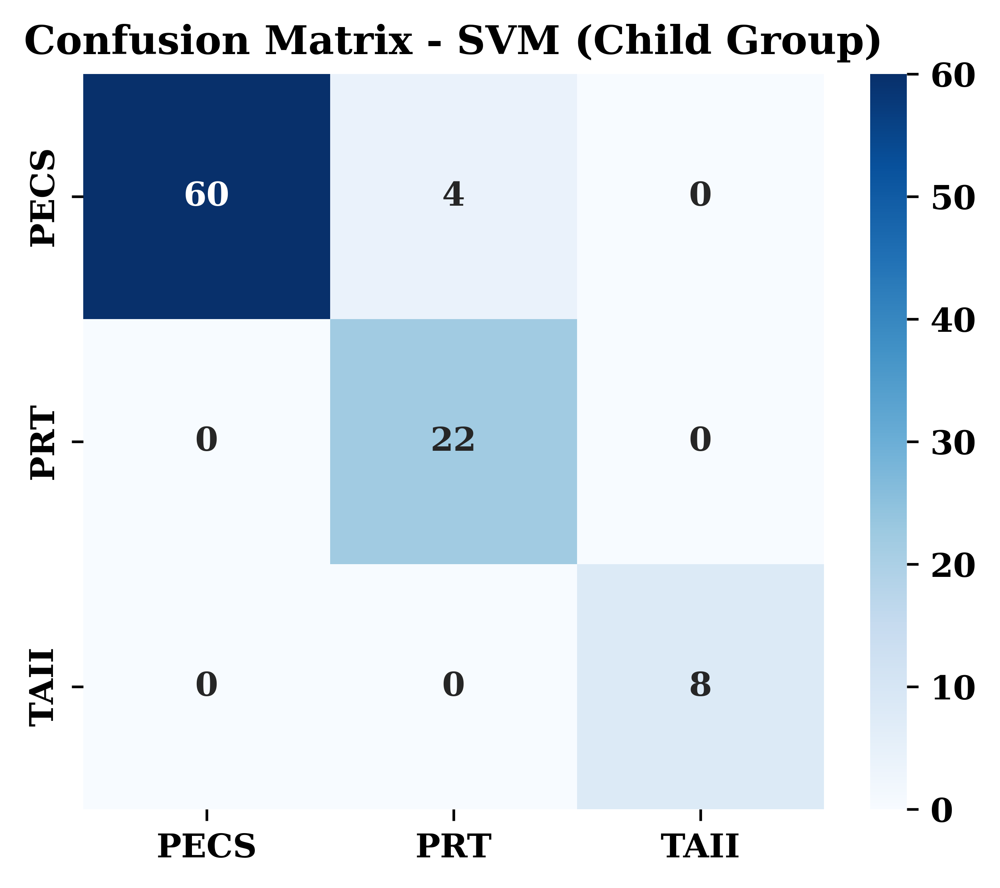

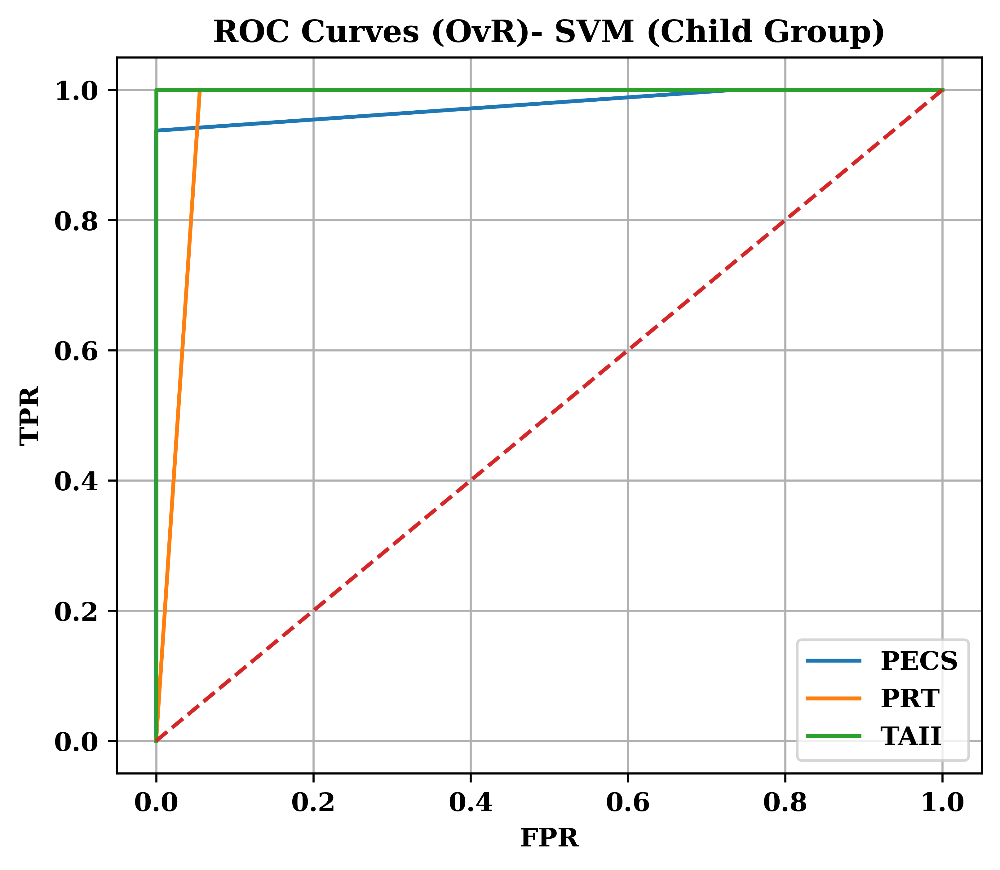


Running bootstrap (1000 resamples)...

METRIC                       | MEAN     | STD      | 95% CI
-------------------------------------------------------------------------------------
Accuracy                     | 0.9577 | 0.0216 | [0.9149 – 0.9894]
Precision (weighted)         | 0.9657 | 0.0151 | [0.9361 – 0.9900]
Recall (weighted)            | 0.9577 | 0.0216 | [0.9149 – 0.9894]
F1 (weighted)                | 0.9591 | 0.0205 | [0.9179 – 0.9895]
F1 (macro)                   | 0.9610 | 0.0198 | [0.9194 – 0.9914]
ROC-AUC (weighted)           | 0.9780 | 0.0116 | [0.9523 – 0.9955]
Log-Loss                     | 0.1305 | 0.0413 | [0.0591 – 0.2183]


In [ ]:
# ============================================================
# 1. IMPORTS
# ============================================================
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

from sklearn.model_selection import StratifiedKFold, GridSearchCV, learning_curve
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, StandardScaler, LabelEncoder
from sklearn.impute import SimpleImputer
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.svm import SVC
from sklearn.metrics import *
from sklearn.base import clone
from sklearn.utils import resample
from sklearn.preprocessing import label_binarize

plt.rcParams.update({
    "font.family": "serif",
    "font.weight": "bold",
    "axes.labelweight": "bold",
    "axes.titleweight": "bold"
})
# ============================================================
# 2. DATA LOADING
# ============================================================
train_path = "/content/drive/MyDrive/Colab Notebooks/My Thesis on ASD Education/ASD_Datasets/ChildGroup_MERGED_train.csv"
test_path  = "/content/drive/MyDrive/Colab Notebooks/My Thesis on ASD Education/ASD_Datasets/ChildGroup_MERGED_test.csv"

df_train = pd.read_csv(train_path)
df_test  = pd.read_csv(test_path)

drop_cols = ["Class_ASD", "Teaching_Strategy", "Score", "Case_No"]

X_train = df_train.drop(columns=drop_cols)
y_train = df_train["Teaching_Strategy"]

X_test  = df_test.drop(columns=drop_cols)
y_test  = df_test["Teaching_Strategy"]


# ============================================================
# 3. HANDLE MISSING VALUES
# ============================================================
placeholders = ['?', '.', 'NA', '', '@', 'NONE']
for ph in placeholders:
    X_train.replace(ph, np.nan, inplace=True)
    X_test.replace(ph, np.nan, inplace=True)

numeric_imputer = SimpleImputer(strategy='median')
categorical_imputer = SimpleImputer(strategy='most_frequent')

numeric_cols = [f"A{i}" for i in range(1, 11)] + ["Age"]
categorical_cols = [c for c in X_train.columns if c not in numeric_cols]

ohe = OneHotEncoder(drop="first", handle_unknown="ignore",min_frequency=0.05 ,sparse_output=False)

le = LabelEncoder()
y_train_enc = le.fit_transform(y_train.astype(str))
y_test_enc  = le.transform(y_test.astype(str))
classes = le.classes_
n_classes = len(classes)

strategy_short = {
    "Pivotal Response Treatment": "PRT",
    "Task Analysis": "TA",
    "Peer Mediated Instruction and Intervention": "PMII",
    "Picture Exchange Communication System": "PECS",
    "Technology Aided Instruction and Intervention": "TAII"
}
short_classes = [strategy_short.get(c.replace("_"," "), c) for c in classes]

# ============================================================
# 3. COLUMN TRANSFORMER & PIPELINE
# ============================================================
preprocessor = ColumnTransformer(transformers=[
    ('num', Pipeline([('imputer', numeric_imputer)]), numeric_cols),
    ('cat', Pipeline([('imputer', categorical_imputer), ('ohe', ohe)]), categorical_cols)
])


# ============================================================
# 5. PIPELINE
# ============================================================
pipe = Pipeline([
    ("preproc", preprocessor),
    ("scaler", StandardScaler()),
    ("feature_select", SelectKBest(f_classif)),
    ("clf", SVC(kernel="rbf", probability=True,
                class_weight="balanced",
                random_state=42))
])


param_grid = {
    "feature_select__k": np.arange(1, 30),
    "clf__C": [0.001, 0.01, 0.1],
    "clf__gamma": ["scale", 0.01, 0.05]
}

outer_cv = StratifiedKFold(5, shuffle=True, random_state=42)
inner_cv = StratifiedKFold(5, shuffle=True, random_state=42)


# ============================================================
# 6. NESTED CV (validation only)
# ============================================================
SVM_child_outer_scores = []
SVM_child_outer_params = []

print("Starting Nested CV (SVM child)")

for fold, (tr_idx, val_idx) in enumerate(outer_cv.split(X_train, y_train_enc), 1):
    X_tr, X_val = X_train.iloc[tr_idx], X_train.iloc[val_idx]
    y_tr, y_val = y_train_enc[tr_idx], y_train_enc[val_idx]

    grid = GridSearchCV(pipe, param_grid, cv=inner_cv,
                        scoring="accuracy", n_jobs=-1)
    grid.fit(X_tr, y_tr)

    pred = grid.best_estimator_.predict(X_val)
    acc = accuracy_score(y_val, pred)

    #Store fold-wise accuracy
    SVM_child_outer_scores.append(acc)
    SVM_child_outer_params.append(grid.best_params_)

    print(f"Fold {fold} complete: Accuracy = {accuracy_score(y_val, pred):.4f}")

print("\n===== SVM Child OUTER FOLD SCORES =====")
for i, score in enumerate(SVM_child_outer_scores, 1):
    print(f"Fold {i}: {score:.4f}")

print("\SVM_outer_scores :")
print(SVM_child_outer_scores)

print("\nOuter CV Accuracy: %.4f ± %.4f" % (np.mean(SVM_child_outer_scores), np.std(SVM_child_outer_scores)))


# ============================================================
# 7. FINAL GLOBAL REFIT (1-SE rule)
# ============================================================
print("\nApplying 1-SE rule...")

search = GridSearchCV(
    pipe,
    param_grid,
    cv=inner_cv,
    scoring="accuracy",
    n_jobs=-1,
    return_train_score=True
)

search.fit(X_train, y_train_enc)
results = pd.DataFrame(search.cv_results_)

best_idx = results["mean_test_score"].idxmax()
best_mean = results.loc[best_idx, "mean_test_score"]
best_std  = results.loc[best_idx, "std_test_score"]

# ----- TRUE 1-SE -----
se = best_std / np.sqrt(inner_cv.get_n_splits())
threshold = best_mean - se

candidates = results[results["mean_test_score"] >= threshold].copy()


# simplify ONLY classifier params (ignore k)
def gamma_rank(g):
    return 99 if g == "scale" else float(g)

candidates["gamma_rank"] = candidates["param_clf__gamma"].apply(gamma_rank)

candidates = candidates.sort_values(
    by=["param_clf__C", "gamma_rank", "mean_test_score"],
    ascending=[True, True, False]
)

final_params = candidates.iloc[0]["params"]

print("\nSelected parameters:")
print(final_params)


final_model = clone(pipe)
final_model.set_params(**final_params)
final_model.fit(X_train, y_train_enc)

# ============================================================
# 10. PRINT SELECTED FEATURES
# ============================================================
selector = final_model.named_steps["feature_select"]
feature_names = final_model.named_steps["preproc"].get_feature_names_out()

selected = feature_names[selector.get_support()]

print("\nSelected features:")
print(selected)
print("Total selected:", len(selected))


# ============================================================
# 11. LEARNING CURVE
# ============================================================
sizes, tr_acc, val_acc = learning_curve(
    final_model, X_train, y_train_enc,
    cv=outer_cv,
    scoring="accuracy",
    train_sizes=np.linspace(0.1, 1.0, 8),
    n_jobs=-1
)
plt.figure(figsize=(8,6), dpi=600)
plt.plot(sizes, tr_acc.mean(axis=1), linewidth=3, label="Train Acc")
plt.plot(sizes, val_acc.mean(axis=1), linestyle="--", linewidth=3, label="Val Acc")
plt.xlabel("Training Samples")
plt.ylabel("Accuracy")
plt.title("Learning Curve - SVM (Child Group)")
plt.legend()
plt.grid(True)
plt.show()


# ============================================================
# 12. FINAL TEST METRICS
# ============================================================
y_pred = final_model.predict(X_test)
y_prob = final_model.predict_proba(X_test)
y_bin  = label_binarize(y_test_enc, classes=range(n_classes))

print("\n===== FINAL TEST RESULTS =====")
print("Accuracy :", accuracy_score(y_test_enc, y_pred))
print("Precision:", precision_score(y_test_enc, y_pred,average="weighted"))
print("F1       :", f1_score(y_test_enc, y_pred, average="weighted"))
print("Recall:", recall_score(y_test_enc, y_pred, average="weighted"))
print("Macro_ F1:", f1_score(y_test_enc, y_pred, average="macro"))
print("ROC-AUC  :", roc_auc_score(y_bin, y_prob, average="weighted", multi_class="ovr"))
print("LogLoss  :", log_loss(y_test_enc, y_prob))


# ============================================================
# 13. CONFUSION MATRIX
# ============================================================
cm = confusion_matrix(y_test_enc, y_pred)

plt.figure(figsize=(5,4), dpi=600)
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=short_classes,
            yticklabels=short_classes)
plt.title("Confusion Matrix - SVM (Child Group)")
plt.show()


# ============================================================
# 14. ROC CURVES
# ============================================================
plt.figure(figsize=(6,5), dpi=600)

for i in range(n_classes):
    fpr, tpr, _ = roc_curve(y_bin[:, i], y_prob[:, i])
    plt.plot(fpr, tpr, label=short_classes[i])

plt.plot([0,1], [0,1], "--")
plt.xlabel("FPR")
plt.ylabel("TPR")
plt.title("ROC Curves (OvR)- SVM (Child Group)")
plt.legend()
plt.grid(True)
plt.show()

# ============================================================
# 15. BOOTSTRAP CONFIDENCE INTERVALS (Q1 requirement)
# ============================================================

def bootstrap_ci_report(y_true, y_pred, y_prob, n_classes, n_bootstrap=1000):
    """
    Non-parametric bootstrap with replacement.
    Produces mean, std, and 95% CI for all metrics.
    """

    rng = np.random.RandomState(42)

    metrics = {
        "Accuracy": [],
        "Precision (weighted)": [],
        "Recall (weighted)": [],
        "F1 (weighted)": [],
        "F1 (macro)": [],
        "ROC-AUC (weighted)": [],
        "Log-Loss": []
    }

    y_true_bin = label_binarize(y_true, classes=range(n_classes))

    print(f"\nRunning bootstrap ({n_bootstrap} resamples)...")

    for _ in range(n_bootstrap):

        # manual bootstrap sampling
        idx = rng.choice(len(y_true), len(y_true), replace=True)

        # skip invalid resamples (missing classes)
        if len(np.unique(y_true[idx])) < n_classes:
            continue

        yt = y_true[idx]
        yp = y_pred[idx]
        ypr = y_prob[idx]
        ytb = y_true_bin[idx]

        metrics["Accuracy"].append(accuracy_score(yt, yp))
        metrics["Precision (weighted)"].append(precision_score(yt, yp, average="weighted"))
        metrics["Recall (weighted)"].append(recall_score(yt, yp, average="weighted"))
        metrics["F1 (weighted)"].append(f1_score(yt, yp, average="weighted"))
        metrics["F1 (macro)"].append(f1_score(yt, yp, average="macro"))
        metrics["ROC-AUC (weighted)"].append(
            roc_auc_score(ytb, ypr, average="weighted", multi_class="ovr")
        )
        metrics["Log-Loss"].append(log_loss(yt, ypr))

    summary = {}

    for name, values in metrics.items():
        values = np.array(values)

        summary[name] = {
            "mean": values.mean(),
            "std": values.std(),
            "low": np.percentile(values, 2.5),
            "high": np.percentile(values, 97.5)
        }

    return summary


# ---------- run bootstrap ----------
boot_stats = bootstrap_ci_report(y_test_enc, y_pred, y_prob, n_classes)


print("\n" + "="*85)
print(f"{'METRIC':28s} | {'MEAN':8s} | {'STD':8s} | {'95% CI'}")
print("-"*85)

for m, s in boot_stats.items():
    print(f"{m:28s} | {s['mean']:.4f} | {s['std']:.4f} | [{s['low']:.4f} – {s['high']:.4f}]")

print("="*85)


# **FFNN Toddler**


```
32, 64, (32,64)
```



Starting Nested CV...

Fold 1
Validation Accuracy: 0.9758
Best Parameters:
{'clf__alpha': 0.01, 'clf__hidden_layer_sizes': (32, 64), 'clf__learning_rate_init': 0.001, 'feature_select__k': np.int64(21)}
--------------------------------------------------
Fold 2
Validation Accuracy: 0.9798
Best Parameters:
{'clf__alpha': 0.01, 'clf__hidden_layer_sizes': (32, 64), 'clf__learning_rate_init': 0.001, 'feature_select__k': np.int64(13)}
--------------------------------------------------
Fold 3
Validation Accuracy: 0.9798
Best Parameters:
{'clf__alpha': 0.01, 'clf__hidden_layer_sizes': (32, 64), 'clf__learning_rate_init': 0.001, 'feature_select__k': np.int64(11)}
--------------------------------------------------
Fold 4
Validation Accuracy: 0.9677
Best Parameters:
{'clf__alpha': 0.1, 'clf__hidden_layer_sizes': (32, 64), 'clf__learning_rate_init': 0.001, 'feature_select__k': np.int64(16)}
--------------------------------------------------
Fold 5
Validation Accuracy: 0.9879
Best Parameters:
{'clf_

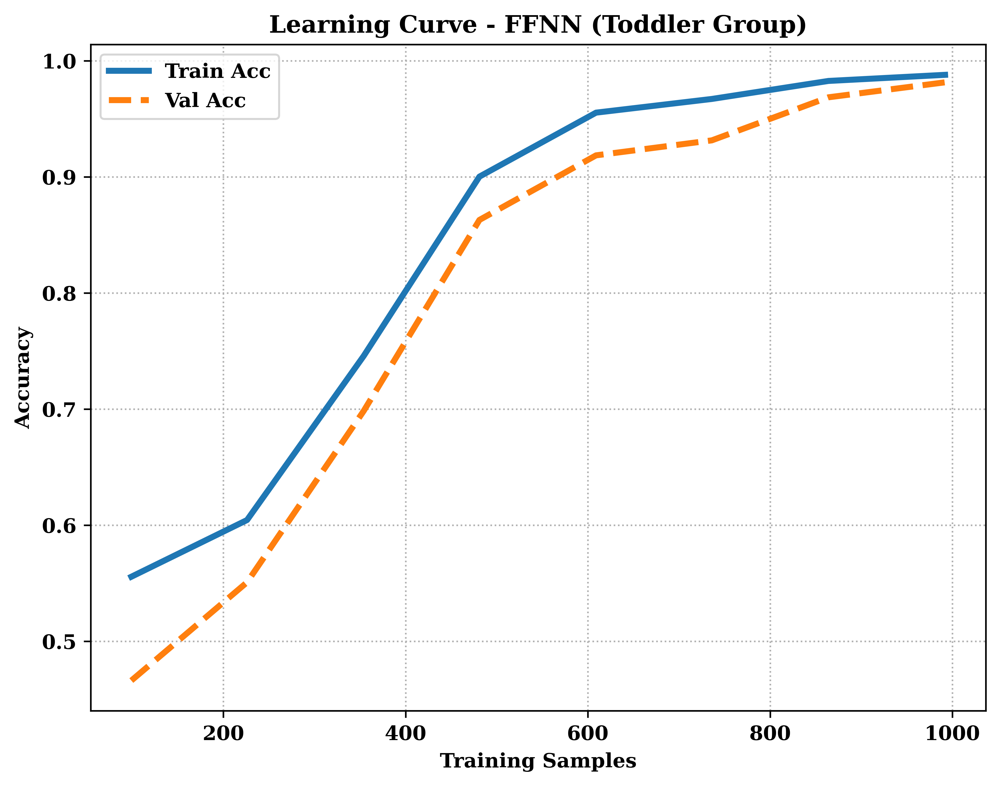


===== FINAL TEST METRICS =====
Accuracy:                 0.9807
Precision (Weighted):     0.9822
Recall (Weighted):        0.9807
Weighted F1-Score:        0.9810
Macro F1-Score:           0.9690
ROC-AUC (Weighted):       0.9897
Log-Loss:                 0.1772


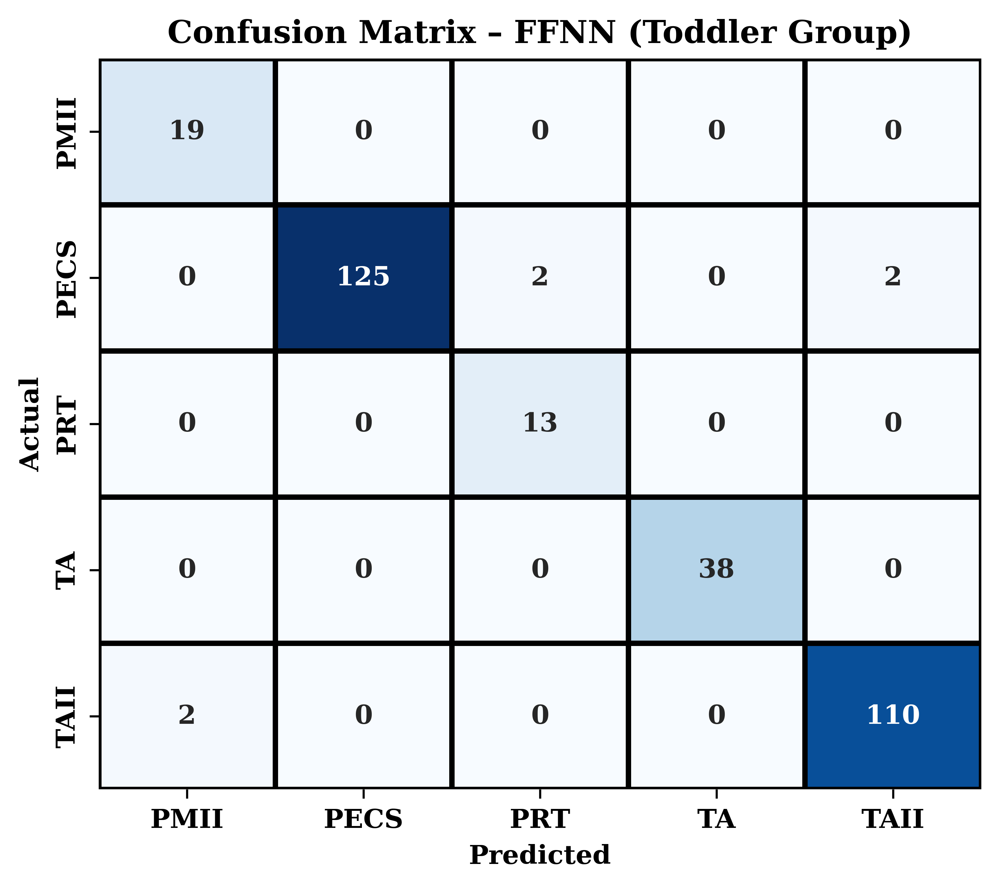

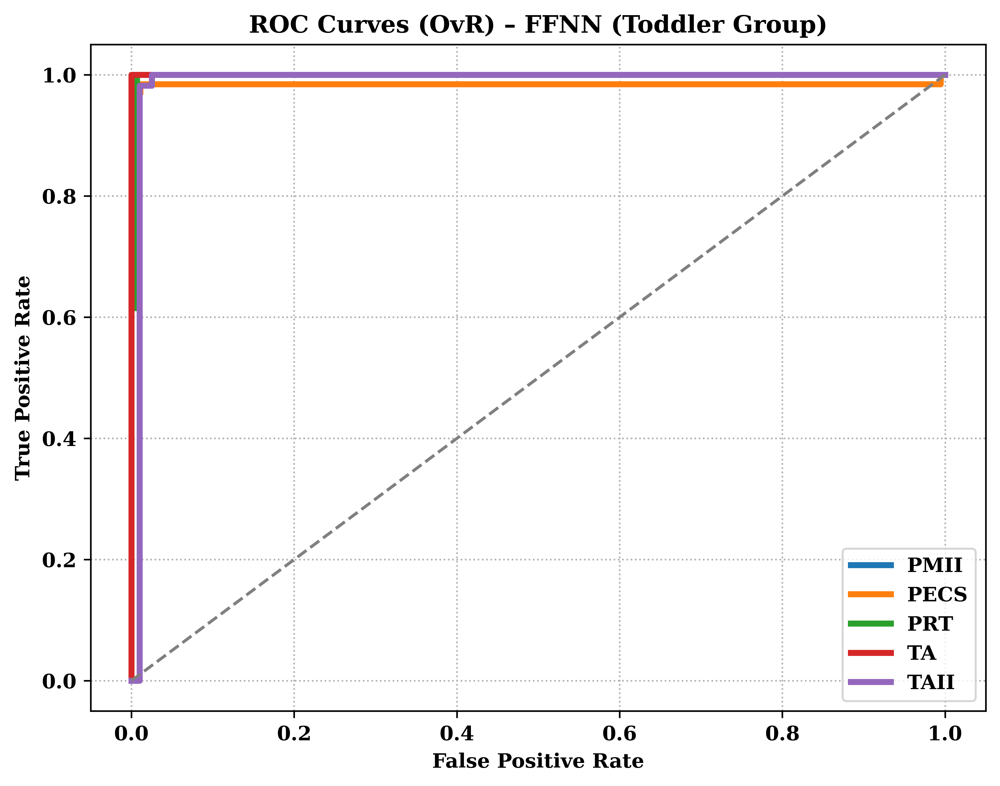


BOOTSTRAP METRICS CI
Accuracy: mean=0.9807, std=0.0076, 95%CI=[0.9646-0.9936]
Weighted F1: mean=0.9811, std=0.0073, 95%CI=[0.9655-0.9937]
Macro F1: mean=0.9679, std=0.0149, 95%CI=[0.9338-0.9919]
ROC-AUC: mean=0.9898, std=0.0070, 95%CI=[0.9740-0.9998]
Log-Loss: mean=0.1760, std=0.0880, 95%CI=[0.0423-0.3716]


In [ ]:
# ==========================FFNN TODDLER===============================
# 1. IMPORTS
# ==========================================================
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import StratifiedKFold, GridSearchCV, learning_curve
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, StandardScaler, LabelEncoder, label_binarize
from sklearn.impute import SimpleImputer
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, log_loss, confusion_matrix, roc_curve
from sklearn.base import clone
from sklearn.utils import resample
from collections import Counter
import warnings
warnings.filterwarnings("ignore")

plt.rcParams.update({
    "font.family": "serif",
    "font.weight": "bold",
    "axes.labelweight": "bold",
    "axes.titleweight": "bold"
})

# ============================================================
# 2. LOAD DATA
# ============================================================
train_path = "/content/drive/MyDrive/Colab Notebooks/My Thesis on ASD Education/ASD_Datasets/ToddlerGroup_MERGED_train.csv"
test_path  = "/content/drive/MyDrive/Colab Notebooks/My Thesis on ASD Education/ASD_Datasets/ToddlerGroup_MERGED_test.csv"

df_train = pd.read_csv(train_path)
df_test  = pd.read_csv(test_path)

drop_cols = ["Case_No", "Class_ASD", "Score", "Teaching_Strategy"]
X_train = df_train.drop(columns=drop_cols)
y_train = df_train["Teaching_Strategy"]
X_test  = df_test.drop(columns=drop_cols)
y_test  = df_test["Teaching_Strategy"]

# ============================================================
# 3. HANDLE MISSING VALUES
# ============================================================
placeholders = ['?', '.', 'NA', '', '@', 'NONE']
for ph in placeholders:
    X_train.replace(ph, np.nan, inplace=True)
    X_test.replace(ph, np.nan, inplace=True)

numeric_imputer = SimpleImputer(strategy='median')
categorical_imputer = SimpleImputer(strategy='most_frequent')

# ============================================================
# 4. PREPROCESSING
# ============================================================
numeric_cols = [f"A{i}" for i in range(1, 11)] + ["Age"]
categorical_cols = [c for c in X_train.columns if c not in numeric_cols]

ohe = OneHotEncoder(drop="first", handle_unknown="ignore", sparse_output=False)

le = LabelEncoder()
y_train_enc = le.fit_transform(y_train.astype(str))
y_test_enc  = le.transform(y_test.astype(str))
classes = le.classes_
n_classes = len(classes)

strategy_short = {
    "Pivotal Response Treatment": "PRT",
    "Task Analysis": "TA",
    "Peer Mediated Instruction and Intervention": "PMII",
    "Picture Exchange Communication System": "PECS",
    "Technology Aided Instruction and Intervention": "TAII"
}
short_classes = [strategy_short.get(c.replace("_"," "), c) for c in classes]

# ============================================================
# 5. COLUMN TRANSFORMER & PIPELINE
# ============================================================
preprocessor = ColumnTransformer(transformers=[
    ('num', Pipeline([('imputer', numeric_imputer)]), numeric_cols),
    ('cat', Pipeline([('imputer', categorical_imputer), ('ohe', ohe)]), categorical_cols)
])

# ============================================================
# 5. PIPELINE
# ============================================================
pipe = Pipeline([
    ("preproc", preprocessor),
    ("scaler", StandardScaler()),
    ("feature_select", SelectKBest(score_func=f_classif)),
    ("clf", MLPClassifier(max_iter=2000, early_stopping=True, random_state=42))
])

# ============================================================
# 6. PARAM GRID (feature k included for nested CV only)
# ============================================================
param_grid = {
    "feature_select__k": np.arange(1, 29),

    "clf__hidden_layer_sizes": [(32,), (64,),(32,64)],

    # stronger regularization only
    "clf__alpha": [1e-2, 5e-2, 1e-1],

    # slower learning for stability
    "clf__learning_rate_init": [1e-4, 5e-4, 1e-3]
}

outer_cv = StratifiedKFold(5, shuffle=True, random_state=42)
inner_cv = StratifiedKFold(5, shuffle=True, random_state=42)

# ============================================================
# 7. NESTED CV
# ============================================================
outer_fold_results = []
outer_fold_accuracies = []
selected_features_all = []
all_fold_curve_scores = []

print("Starting Nested CV...\n")

for fold, (tr_idx, val_idx) in enumerate(outer_cv.split(X_train, y_train_enc), 1):

    X_tr, X_val = X_train.iloc[tr_idx], X_train.iloc[val_idx]
    y_tr, y_val = y_train_enc[tr_idx], y_train_enc[val_idx]

    grid = GridSearchCV(pipe, param_grid, cv=inner_cv,
                        scoring="accuracy", n_jobs=-1)

    grid.fit(X_tr, y_tr)

    best_params = grid.best_params_

    # VALIDATION PERFORMANCE
    val_pred = grid.best_estimator_.predict(X_val)
    val_acc = accuracy_score(y_val, val_pred)

    outer_fold_results.append(best_params)
    outer_fold_accuracies.append(val_acc)

    print(f"Fold {fold}")
    print(f"Validation Accuracy: {val_acc:.4f}")
    print("Best Parameters:")
    print(best_params)
    print("-"*50)

    # Capture features
    mask = grid.best_estimator_.named_steps['feature_select'].get_support()
    feat_names = grid.best_estimator_.named_steps['preproc'].get_feature_names_out()
    selected_features_all.append(feat_names[mask])

    # Stability curve
    fold_scores = []
    for k in np.arange(1, 29):
        temp_pipe = clone(pipe)
        temp_pipe.set_params(
            feature_select__k=k,
            clf__hidden_layer_sizes=best_params["clf__hidden_layer_sizes"],
            clf__alpha=best_params["clf__alpha"],
            clf__learning_rate_init=best_params["clf__learning_rate_init"]
        )
        temp_pipe.fit(X_tr, y_tr)
        fold_scores.append(accuracy_score(y_val, temp_pipe.predict(X_val)))
    all_fold_curve_scores.append(fold_scores)

# Summary of outer CV
print("\n===== OUTER CV SUMMARY =====")
print(f"Mean Accuracy: {np.mean(outer_fold_accuracies):.4f}")
print(f"Std Accuracy : {np.std(outer_fold_accuracies):.4f}")
print("="*50)

# ============================================================
# 8. FINAL GRID SEARCH + 1-SE (ONLY HYPERPARAMS)
# ============================================================
final_search = GridSearchCV(pipe, param_grid, cv=inner_cv, scoring="accuracy", n_jobs=-1)
final_search.fit(X_train, y_train_enc)
results = pd.DataFrame(final_search.cv_results_)

best_idx = results["mean_test_score"].idxmax()
max_mean = results.loc[best_idx, "mean_test_score"]
se = results.loc[best_idx, "std_test_score"] / np.sqrt(inner_cv.get_n_splits())
threshold = max_mean - se

# Candidates within 1-SE threshold
candidates = results[results["mean_test_score"] >= threshold].copy()
# Ignore feature_select__k in 1-SE decision
candidates = candidates.sort_values(
    by=["param_clf__hidden_layer_sizes", "param_clf__alpha", "param_clf__learning_rate_init"],
    ascending=[True, True, True]
)
final_params = candidates.iloc[0]["params"]

# Refit final model
final_model = clone(pipe)
final_model.set_params(**final_params)
final_model.fit(X_train, y_train_enc)


print("\n===== FINAL 1-SE SELECTED PARAMETERS =====")
for key, value in final_params.items():
    print(f"{key}: {value}")
print("="*50)

# ============================================================
# 9. FEATURE STABILITY
# ============================================================
counter = Counter()
for f in selected_features_all:
    counter.update(f)
stability_df = pd.DataFrame.from_dict(counter, orient="index", columns=["Count"])
stability_df["Frequency"] = stability_df["Count"]/5
stability_df = stability_df.sort_values("Frequency", ascending=False)
print("\nFEATURE STABILITY:")
print(stability_df.head(15))

# ============================================================
# 10. LEARNING CURVE
# ============================================================
ts, train_acc, val_acc = learning_curve(final_model, X_train, y_train_enc,
                                        cv=outer_cv, scoring="accuracy",
                                        train_sizes=np.linspace(0.1,1.0,8), n_jobs=-1)
plt.figure(figsize=(8,6), dpi=600)
plt.plot(ts, train_acc.mean(axis=1), linewidth=3, label="Train Acc")
plt.plot(ts, val_acc.mean(axis=1), linestyle="--", linewidth=3, label="Val Acc")
plt.xlabel("Training Samples")
plt.ylabel("Accuracy")
plt.title("Learning Curve - FFNN (Toddler Group)")
plt.legend()
plt.grid(True, linestyle=":")
plt.show()

# ============================================================
# 11. FINAL TEST EVALUATION
# ============================================================
y_test_pred = final_model.predict(X_test)
y_test_prob = final_model.predict_proba(X_test)
y_test_bin = label_binarize(y_test_enc, classes=range(n_classes))
print("\n===== FINAL TEST METRICS =====")
print("="*40)
print(f"{'Accuracy:':25s} {accuracy_score(y_test_enc, y_test_pred):.4f}")
print(f"{'Precision (Weighted):':25s} {precision_score(y_test_enc, y_test_pred, average='weighted'):.4f}")
print(f"{'Recall (Weighted):':25s} {recall_score(y_test_enc, y_test_pred, average='weighted'):.4f}")
print(f"{'Weighted F1-Score:':25s} {f1_score(y_test_enc, y_test_pred, average='weighted'):.4f}")
print(f"{'Macro F1-Score:':25s} {f1_score(y_test_enc, y_test_pred, average='macro'):.4f}")
print(f"{'ROC-AUC (Weighted):':25s} {roc_auc_score(y_test_bin, y_test_prob, average='weighted', multi_class='ovr'):.4f}")
print(f"{'Log-Loss:':25s} {log_loss(y_test_enc, y_test_prob):.4f}")
print("="*40)

# ============================================================
# 12. CONFUSION MATRIX
# ============================================================
cm = confusion_matrix(y_test_enc, y_test_pred)
plt.figure(figsize=(6,5), dpi=600)
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=short_classes, yticklabels=short_classes,
            linewidths=2, linecolor="black", cbar=False)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix – FFNN (Toddler Group)")
plt.show()

# ============================================================
# 13. ROC CURVES
# ============================================================
plt.figure(figsize=(8,6), dpi=600)
for i in range(n_classes):
    fpr, tpr, _ = roc_curve(y_test_bin[:, i], y_test_prob[:, i])
    plt.plot(fpr, tpr, linewidth=3, label=short_classes[i])
plt.plot([0,1], [0,1], "--", color="gray")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curves (OvR) – FFNN (Toddler Group)")
plt.legend()
plt.grid(True, linestyle=":")
plt.show()


# ============================================================
# 12. BOOTSTRAP CI
# ============================================================
def bootstrap_metrics(y_true, y_pred, y_prob, n_classes, n_bootstrap=1000):
    rng = np.random.RandomState(42)
    boot_metrics = {"Accuracy":[],"Weighted F1":[],"Macro F1":[],"ROC-AUC":[],"Log-Loss":[]}
    y_true_bin = label_binarize(y_true, classes=range(n_classes))
    for _ in range(n_bootstrap):
        idx = resample(np.arange(len(y_true)), replace=True, random_state=rng)
        if len(np.unique(y_true[idx]))<n_classes: continue
        boot_metrics["Accuracy"].append(accuracy_score(y_true[idx], y_pred[idx]))
        boot_metrics["Weighted F1"].append(f1_score(y_true[idx], y_pred[idx], average='weighted'))
        boot_metrics["Macro F1"].append(f1_score(y_true[idx], y_pred[idx], average='macro'))
        boot_metrics["ROC-AUC"].append(roc_auc_score(y_true_bin[idx], y_prob[idx], average='weighted', multi_class='ovr'))
        boot_metrics["Log-Loss"].append(log_loss(y_true[idx], y_prob[idx]))
    summary = {}
    for m, v in boot_metrics.items():
        summary[m] = {"mean":np.mean(v),"std":np.std(v),"low_ci":np.percentile(v,2.5),"high_ci":np.percentile(v,97.5)}
    return summary

final_stats = bootstrap_metrics(y_test_enc, y_test_pred, y_test_prob, n_classes)
print("\nBOOTSTRAP METRICS CI")
for metric, stats in final_stats.items():
    print(f"{metric}: mean={stats['mean']:.4f}, std={stats['std']:.4f}, 95%CI=[{stats['low_ci']:.4f}-{stats['high_ci']:.4f}]")


# FFNN Child


```
32, 64, 32,64
```



Starting Nested CV...

Fold 1
Validation Accuracy: 0.9730
Best Parameters:
{'clf__alpha': 0.01, 'clf__hidden_layer_sizes': (32, 64), 'clf__learning_rate_init': 0.001, 'feature_select__k': np.int64(3)}
--------------------------------------------------
Fold 2
Validation Accuracy: 0.8784
Best Parameters:
{'clf__alpha': 0.01, 'clf__hidden_layer_sizes': (32, 64), 'clf__learning_rate_init': 0.0005, 'feature_select__k': np.int64(2)}
--------------------------------------------------
Fold 3
Validation Accuracy: 0.8493
Best Parameters:
{'clf__alpha': 0.01, 'clf__hidden_layer_sizes': (32, 64), 'clf__learning_rate_init': 0.0005, 'feature_select__k': np.int64(2)}
--------------------------------------------------
Fold 4
Validation Accuracy: 0.9726
Best Parameters:
{'clf__alpha': 0.01, 'clf__hidden_layer_sizes': (32, 64), 'clf__learning_rate_init': 0.001, 'feature_select__k': np.int64(3)}
--------------------------------------------------
Fold 5
Validation Accuracy: 0.9589
Best Parameters:
{'clf__

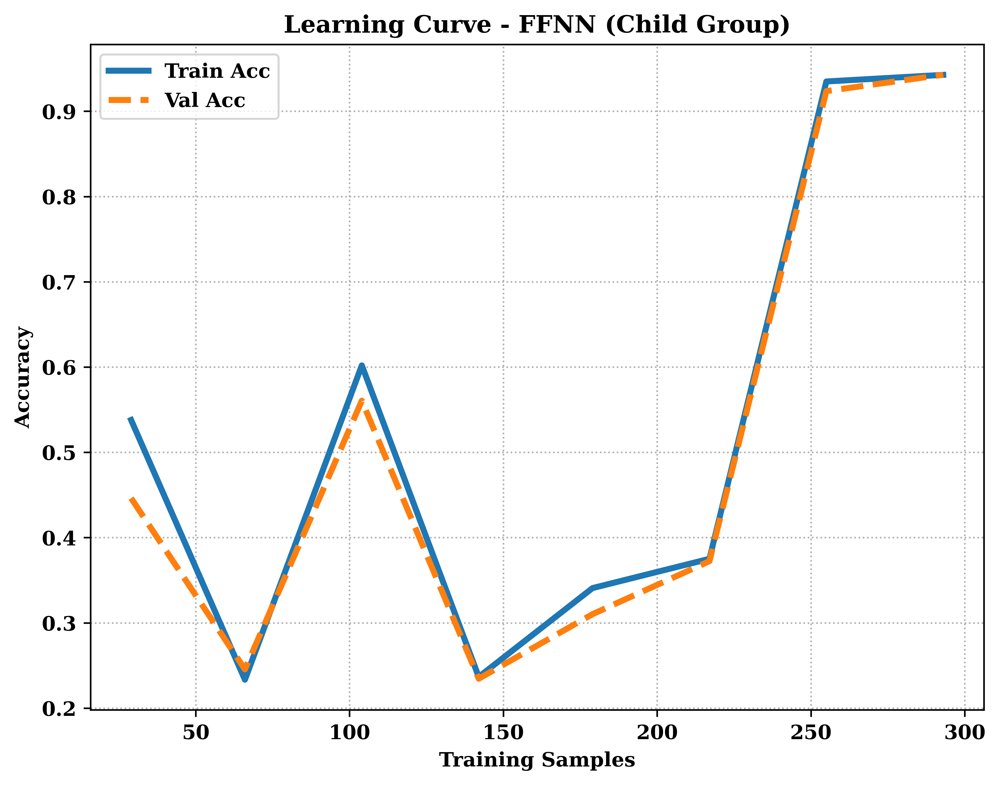


===== FINAL TEST METRICS =====
Accuracy:                 0.9255
Precision (Weighted):     0.9316
Recall (Weighted):        0.9255
Weighted F1-Score:        0.9233
Macro F1-Score:           0.8769
ROC-AUC (Weighted):       0.9187
Log-Loss:                 0.8148


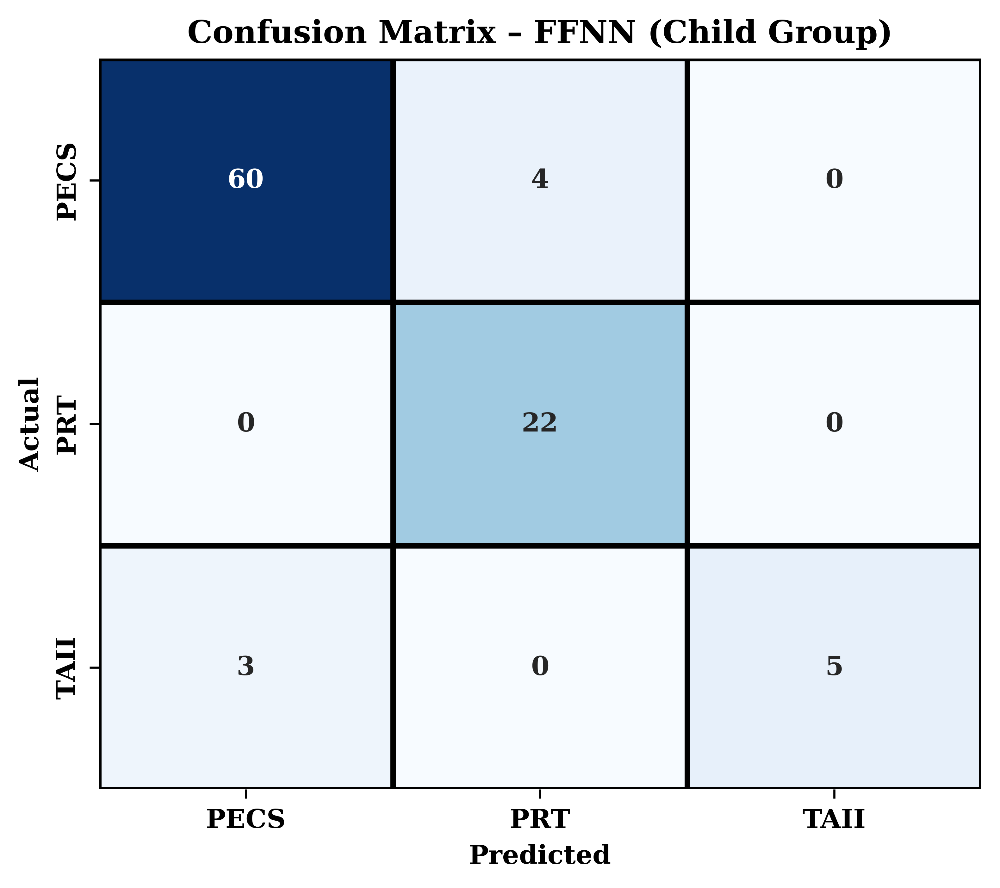

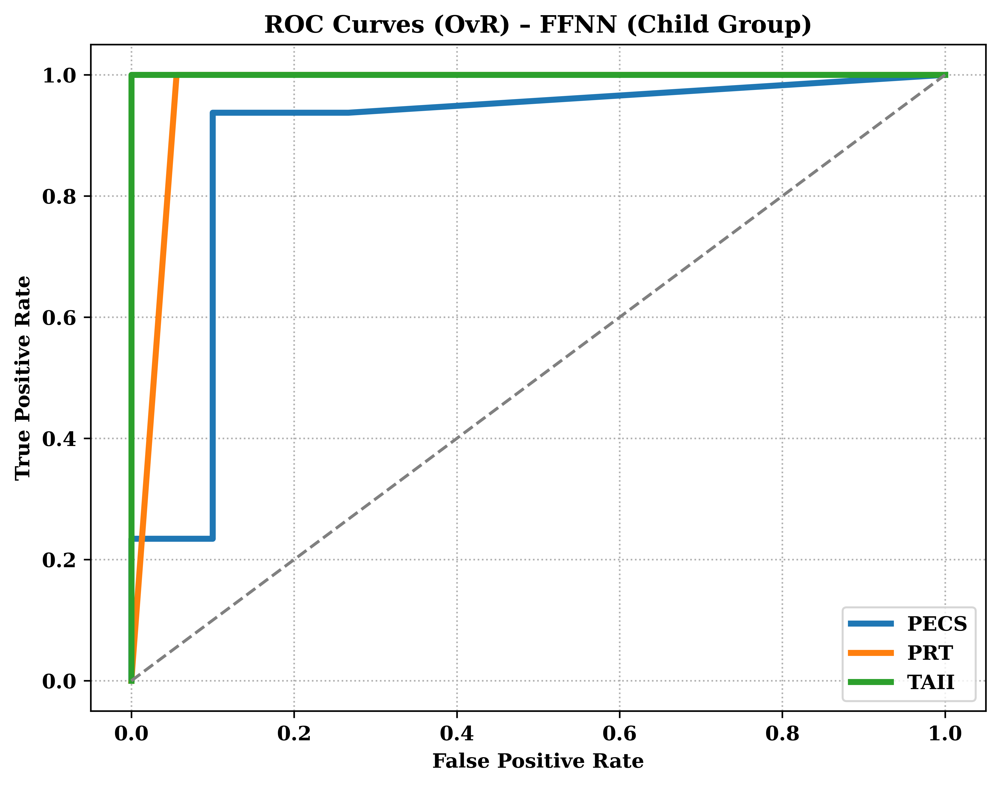


BOOTSTRAP METRICS CI
Accuracy: mean=0.9264, std=0.0268, 95%CI=[0.8723-0.9787]
Weighted F1: mean=0.9236, std=0.0282, 95%CI=[0.8679-0.9774]
Macro F1: mean=0.8715, std=0.0544, 95%CI=[0.7527-0.9658]
ROC-AUC: mean=0.9190, std=0.0316, 95%CI=[0.8515-0.9747]
Log-Loss: mean=0.8146, std=0.0127, 95%CI=[0.7924-0.8405]


In [ ]:
# =============================32, 64, 32,64===============================
# 1. IMPORTS
# ============================================================
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import StratifiedKFold, GridSearchCV, learning_curve
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, StandardScaler, LabelEncoder, label_binarize
from sklearn.impute import SimpleImputer
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, log_loss, confusion_matrix, roc_curve
from sklearn.base import clone
from sklearn.utils import resample
from collections import Counter
import warnings
warnings.filterwarnings("ignore")

plt.rcParams.update({
    "font.family": "serif",
    "font.weight": "bold",
    "axes.labelweight": "bold",
    "axes.titleweight": "bold"
})

# ============================================================
# 2. LOAD DATA
# ============================================================
train_path = "/content/drive/MyDrive/Colab Notebooks/My Thesis on ASD Education/ASD_Datasets/ChildGroup_MERGED_train.csv"
test_path  = "/content/drive/MyDrive/Colab Notebooks/My Thesis on ASD Education/ASD_Datasets/ChildGroup_MERGED_test.csv"

df_train = pd.read_csv(train_path)
df_test  = pd.read_csv(test_path)

drop_cols = ["Case_No", "Class_ASD", "Score", "Teaching_Strategy"]
X_train = df_train.drop(columns=drop_cols)
y_train = df_train["Teaching_Strategy"]
X_test  = df_test.drop(columns=drop_cols)
y_test  = df_test["Teaching_Strategy"]

# ============================================================
# 3. HANDLE MISSING VALUES
# ============================================================
placeholders = ['?', '.', 'NA', '', '@', 'NONE']
for ph in placeholders:
    X_train.replace(ph, np.nan, inplace=True)
    X_test.replace(ph, np.nan, inplace=True)

numeric_imputer = SimpleImputer(strategy='median')
categorical_imputer = SimpleImputer(strategy='most_frequent')

# ============================================================
# 4. PREPROCESSING
# ============================================================
numeric_cols = [f"A{i}" for i in range(1, 11)] + ["Age"]
categorical_cols = [c for c in X_train.columns if c not in numeric_cols]

ohe = OneHotEncoder(drop="first", handle_unknown="ignore", min_frequency=0.05, sparse_output=False)

le = LabelEncoder()
y_train_enc = le.fit_transform(y_train.astype(str))
y_test_enc  = le.transform(y_test.astype(str))
classes = le.classes_
n_classes = len(classes)

strategy_short = {
    "Pivotal Response Treatment": "PRT",
    "Task Analysis": "TA",
    "Peer Mediated Instruction and Intervention": "PMII",
    "Picture Exchange Communication System": "PECS",
    "Technology Aided Instruction and Intervention": "TAII"
}
short_classes = [strategy_short.get(c.replace("_"," "), c) for c in classes]

# ============================================================
# 5. COLUMN TRANSFORMER & PIPELINE
# ============================================================
preprocessor = ColumnTransformer(transformers=[
    ('num', Pipeline([('imputer', numeric_imputer)]), numeric_cols),
    ('cat', Pipeline([('imputer', categorical_imputer), ('ohe', ohe)]), categorical_cols)
])

# ============================================================
# 5. PIPELINE
# ============================================================
pipe = Pipeline([
    ("preproc", preprocessor),
    ("scaler", StandardScaler()),
    ("feature_select", SelectKBest(score_func=f_classif)),
    ("clf", MLPClassifier(max_iter=2000, early_stopping=True, random_state=42))
])

# ============================================================
# 6. PARAM GRID (feature k included for nested CV only)
# ============================================================
param_grid = {
    "feature_select__k": np.arange(1, 30),

    "clf__hidden_layer_sizes": [(32,), (64,),(32,64)],

    # stronger regularization only
    "clf__alpha": [1e-2, 5e-2, 1e-1],

    # slower learning for stability
    "clf__learning_rate_init": [1e-4, 5e-4, 1e-3]
}

outer_cv = StratifiedKFold(5, shuffle=True, random_state=42)
inner_cv = StratifiedKFold(5, shuffle=True, random_state=42)

# ============================================================
# 7. NESTED CV
# ============================================================
outer_fold_results = []
outer_fold_accuracies = []
selected_features_all = []
all_fold_curve_scores = []

print("Starting Nested CV...\n")

for fold, (tr_idx, val_idx) in enumerate(outer_cv.split(X_train, y_train_enc), 1):

    X_tr, X_val = X_train.iloc[tr_idx], X_train.iloc[val_idx]
    y_tr, y_val = y_train_enc[tr_idx], y_train_enc[val_idx]

    grid = GridSearchCV(pipe, param_grid, cv=inner_cv,
                        scoring="accuracy", n_jobs=-1)

    grid.fit(X_tr, y_tr)

    best_params = grid.best_params_

    # VALIDATION PERFORMANCE
    val_pred = grid.best_estimator_.predict(X_val)
    val_acc = accuracy_score(y_val, val_pred)

    outer_fold_results.append(best_params)
    outer_fold_accuracies.append(val_acc)

    print(f"Fold {fold}")
    print(f"Validation Accuracy: {val_acc:.4f}")
    print("Best Parameters:")
    print(best_params)
    print("-"*50)

    # Capture features
    mask = grid.best_estimator_.named_steps['feature_select'].get_support()
    feat_names = grid.best_estimator_.named_steps['preproc'].get_feature_names_out()
    selected_features_all.append(feat_names[mask])

    # Stability curve
    fold_scores = []
    for k in np.arange(1, 30):
        temp_pipe = clone(pipe)
        temp_pipe.set_params(
            feature_select__k=k,
            clf__hidden_layer_sizes=best_params["clf__hidden_layer_sizes"],
            clf__alpha=best_params["clf__alpha"],
            clf__learning_rate_init=best_params["clf__learning_rate_init"]
        )
        temp_pipe.fit(X_tr, y_tr)
        fold_scores.append(accuracy_score(y_val, temp_pipe.predict(X_val)))
    all_fold_curve_scores.append(fold_scores)

# Summary of outer CV
print("\n===== OUTER CV SUMMARY =====")
print(f"Mean Accuracy: {np.mean(outer_fold_accuracies):.4f}")
print(f"Std Accuracy : {np.std(outer_fold_accuracies):.4f}")
print("="*50)

# ============================================================
# 8. FINAL GRID SEARCH + 1-SE (ONLY HYPERPARAMS)
# ============================================================
final_search = GridSearchCV(pipe, param_grid, cv=inner_cv, scoring="accuracy", n_jobs=-1)
final_search.fit(X_train, y_train_enc)
results = pd.DataFrame(final_search.cv_results_)

best_idx = results["mean_test_score"].idxmax()
max_mean = results.loc[best_idx, "mean_test_score"]
se = results.loc[best_idx, "std_test_score"] / np.sqrt(inner_cv.get_n_splits())
threshold = max_mean - se

# Candidates within 1-SE threshold
candidates = results[results["mean_test_score"] >= threshold].copy()
# Ignore feature_select__k in 1-SE decision
candidates = candidates.sort_values(
    by=["param_clf__hidden_layer_sizes", "param_clf__alpha", "param_clf__learning_rate_init"],
    ascending=[True, True, True]
)
final_params = candidates.iloc[0]["params"]

# Refit final model
final_model = clone(pipe)
final_model.set_params(**final_params)
final_model.fit(X_train, y_train_enc)


print("\n===== FINAL 1-SE SELECTED PARAMETERS =====")
for key, value in final_params.items():
    print(f"{key}: {value}")
print("="*50)

# ============================================================
# 9. FEATURE STABILITY
# ============================================================
counter = Counter()
for f in selected_features_all:
    counter.update(f)
stability_df = pd.DataFrame.from_dict(counter, orient="index", columns=["Count"])
stability_df["Frequency"] = stability_df["Count"]/5
stability_df = stability_df.sort_values("Frequency", ascending=False)
print("\nFEATURE STABILITY:")
print(stability_df.head(15))

# ============================================================
# 10. LEARNING CURVE
# ============================================================
ts, train_acc, val_acc = learning_curve(final_model, X_train, y_train_enc,
                                        cv=outer_cv, scoring="accuracy",
                                        train_sizes=np.linspace(0.1,1.0,8), n_jobs=-1)
plt.figure(figsize=(8,6), dpi=600)
plt.plot(ts, train_acc.mean(axis=1), linewidth=3, label="Train Acc")
plt.plot(ts, val_acc.mean(axis=1), linestyle="--", linewidth=3, label="Val Acc")
plt.xlabel("Training Samples")
plt.ylabel("Accuracy")
plt.title("Learning Curve - FFNN (Child Group)")
plt.legend()
plt.grid(True, linestyle=":")
plt.show()

# ============================================================
# 11. FINAL TEST EVALUATION
# ============================================================
y_test_pred = final_model.predict(X_test)
y_test_prob = final_model.predict_proba(X_test)
y_test_bin = label_binarize(y_test_enc, classes=range(n_classes))
print("\n===== FINAL TEST METRICS =====")
print("="*40)
print(f"{'Accuracy:':25s} {accuracy_score(y_test_enc, y_test_pred):.4f}")
print(f"{'Precision (Weighted):':25s} {precision_score(y_test_enc, y_test_pred, average='weighted'):.4f}")
print(f"{'Recall (Weighted):':25s} {recall_score(y_test_enc, y_test_pred, average='weighted'):.4f}")
print(f"{'Weighted F1-Score:':25s} {f1_score(y_test_enc, y_test_pred, average='weighted'):.4f}")
print(f"{'Macro F1-Score:':25s} {f1_score(y_test_enc, y_test_pred, average='macro'):.4f}")
print(f"{'ROC-AUC (Weighted):':25s} {roc_auc_score(y_test_bin, y_test_prob, average='weighted', multi_class='ovr'):.4f}")
print(f"{'Log-Loss:':25s} {log_loss(y_test_enc, y_test_prob):.4f}")
print("="*40)

# ============================================================
# 12. CONFUSION MATRIX
# ============================================================
cm = confusion_matrix(y_test_enc, y_test_pred)
plt.figure(figsize=(6,5), dpi=600)
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=short_classes, yticklabels=short_classes,
            linewidths=2, linecolor="black", cbar=False)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix – FFNN (Child Group)")
plt.show()

# ============================================================
# 13. ROC CURVES
# ============================================================
plt.figure(figsize=(8,6), dpi=600)
for i in range(n_classes):
    fpr, tpr, _ = roc_curve(y_test_bin[:, i], y_test_prob[:, i])
    plt.plot(fpr, tpr, linewidth=3, label=short_classes[i])
plt.plot([0,1], [0,1], "--", color="gray")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curves (OvR) – FFNN (Child Group)")
plt.legend()
plt.grid(True, linestyle=":")
plt.show()


# ============================================================
# 12. BOOTSTRAP CI
# ============================================================
def bootstrap_metrics(y_true, y_pred, y_prob, n_classes, n_bootstrap=1000):
    rng = np.random.RandomState(42)
    boot_metrics = {"Accuracy":[],"Weighted F1":[],"Macro F1":[],"ROC-AUC":[],"Log-Loss":[]}
    y_true_bin = label_binarize(y_true, classes=range(n_classes))
    for _ in range(n_bootstrap):
        idx = resample(np.arange(len(y_true)), replace=True, random_state=rng)
        if len(np.unique(y_true[idx]))<n_classes: continue
        boot_metrics["Accuracy"].append(accuracy_score(y_true[idx], y_pred[idx]))
        boot_metrics["Weighted F1"].append(f1_score(y_true[idx], y_pred[idx], average='weighted'))
        boot_metrics["Macro F1"].append(f1_score(y_true[idx], y_pred[idx], average='macro'))
        boot_metrics["ROC-AUC"].append(roc_auc_score(y_true_bin[idx], y_prob[idx], average='weighted', multi_class='ovr'))
        boot_metrics["Log-Loss"].append(log_loss(y_true[idx], y_prob[idx]))
    summary = {}
    for m, v in boot_metrics.items():
        summary[m] = {"mean":np.mean(v),"std":np.std(v),"low_ci":np.percentile(v,2.5),"high_ci":np.percentile(v,97.5)}
    return summary

final_stats = bootstrap_metrics(y_test_enc, y_test_pred, y_test_prob, n_classes)
print("\nBOOTSTRAP METRICS CI")
for metric, stats in final_stats.items():
    print(f"{metric}: mean={stats['mean']:.4f}, std={stats['std']:.4f}, 95%CI=[{stats['low_ci']:.4f}-{stats['high_ci']:.4f}]")


# **DT Toddler**

Starting Nested CV (DT Toddler)
Fold 1 complete: Accuracy = 0.8871
Fold 2 complete: Accuracy = 0.9032
Fold 3 complete: Accuracy = 0.9073
Fold 4 complete: Accuracy = 0.9073
Fold 5 complete: Accuracy = 0.9153

===== Toddler DT OUTER FOLD SCORES =====
Fold 1: 0.8871
Fold 2: 0.9032
Fold 3: 0.9073
Fold 4: 0.9073
Fold 5: 0.9153

DT_outer_scores:
[0.8870967741935484, 0.9032258064516129, 0.907258064516129, 0.907258064516129, 0.9153225806451613]

Outer CV Accuracy: 0.9040 ± 0.0093

Selected parameters (1-SE parsimonious):
{'clf__criterion': 'gini', 'clf__max_depth': 7, 'clf__min_samples_leaf': 10}

===== FEATURE INFORMATION =====
Total input features after preprocessing: 28

Top 15 Most Important Features (DT, interpretation only):
                         Feature  Importance
7                        num__A8    0.274374
5                        num__A6    0.247969
1                        num__A2    0.221810
8                        num__A9    0.106302
4                        num__A5    0.0597

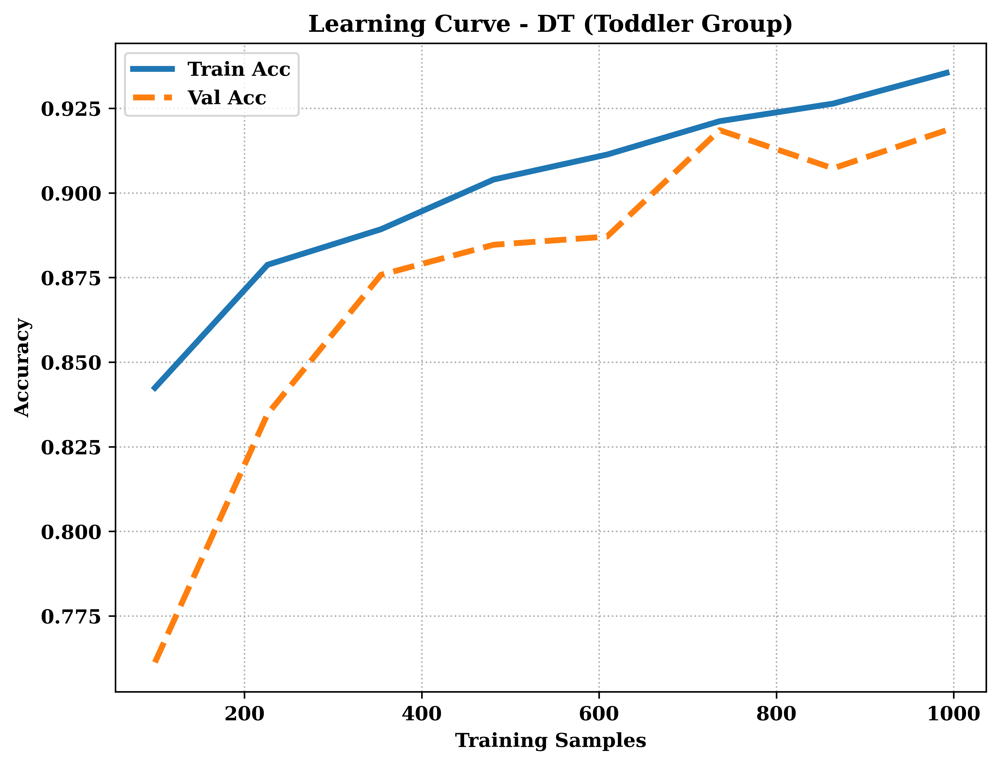


===== FINAL TEST METRICS =====
Accuracy:                 0.9357
Precision (Weighted):     0.9325
Recall (Weighted):        0.9357
Weighted F1-Score:        0.9325
Macro F1-Score:           0.8219
ROC-AUC (Weighted):       0.9943
Log-Loss:                 0.3357


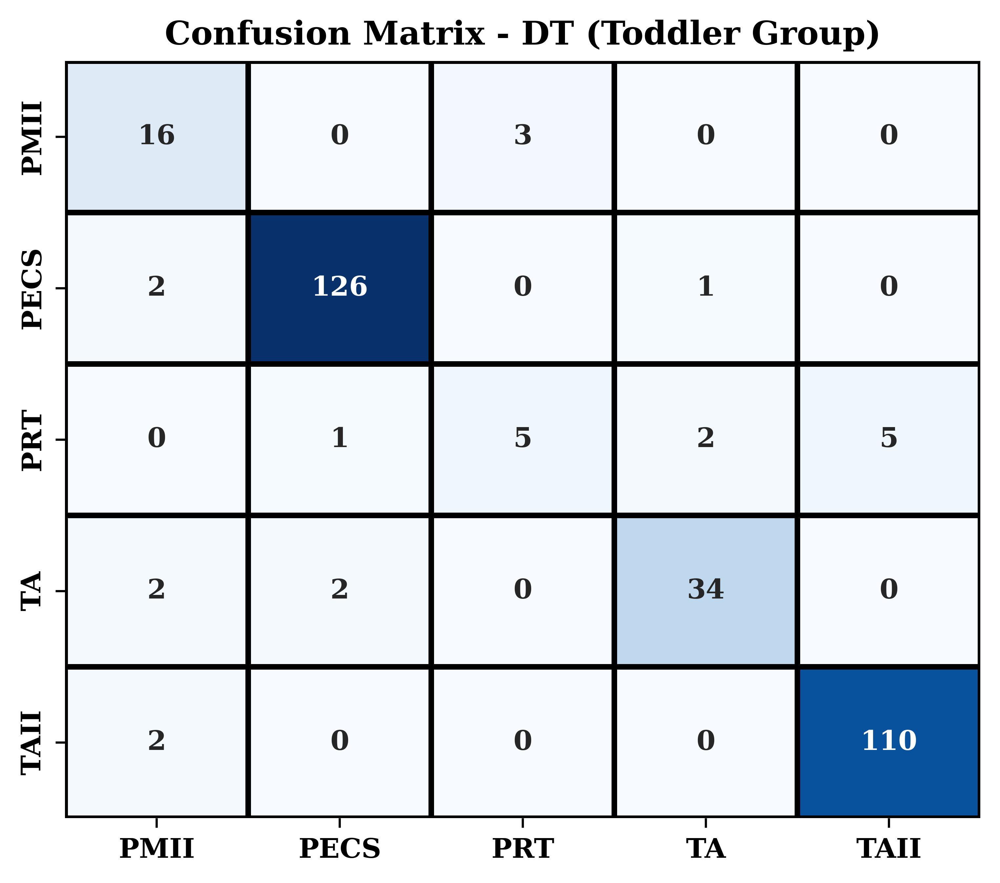

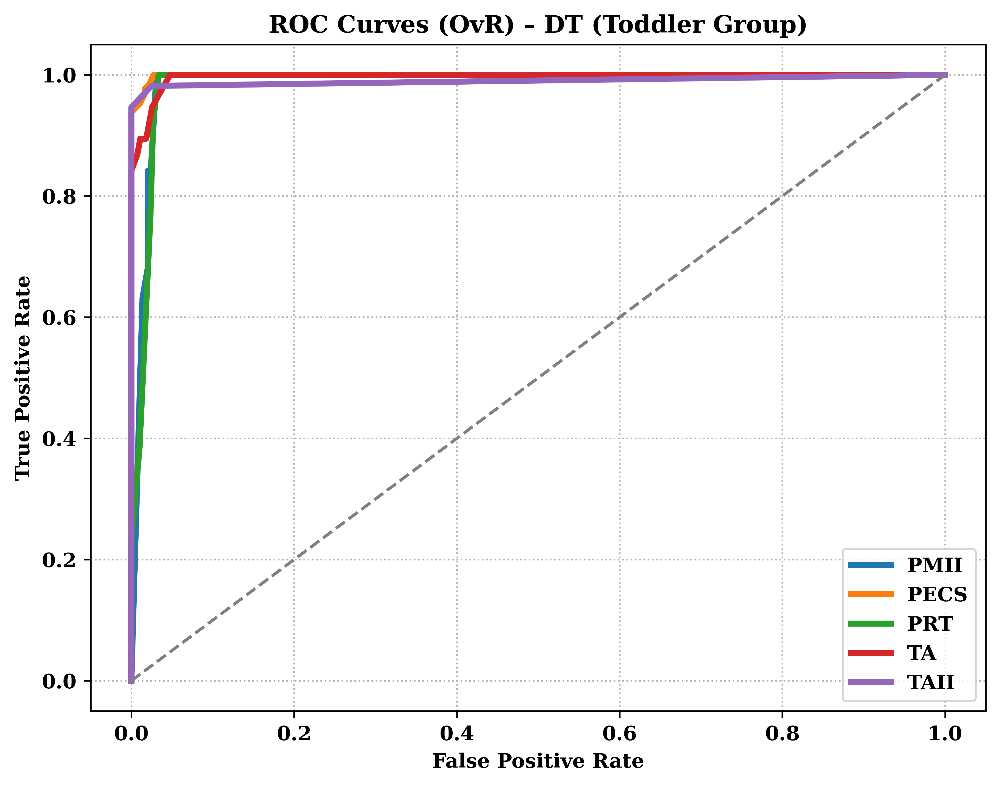


METRIC                    | MEAN     | STD      | 95% CONFIDENCE INTERVAL
-------------------------------------------------------------------------------------
Accuracy                  | 0.9356   | 0.0144   | [0.9035 - 0.9614]
Precision                 | 0.9343   | 0.0166   | [0.8969 - 0.9614]
Recall                    | 0.9356   | 0.0144   | [0.9035 - 0.9614]
Weighted F1               | 0.9323   | 0.0159   | [0.8980 - 0.9596]
Macro F1                  | 0.8184   | 0.0374   | [0.7429 - 0.8862]
ROC-AUC                   | 0.9942   | 0.0027   | [0.9882 - 0.9986]
Log-Loss                  | 0.3417   | 0.1636   | [0.0924 - 0.7004]


In [ ]:
# ============================================================
# Import
# ============================================================
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter
import warnings
warnings.filterwarnings("ignore")

from sklearn.model_selection import StratifiedKFold, GridSearchCV, learning_curve
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder, LabelEncoder, label_binarize
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import (
    accuracy_score, f1_score, precision_score, recall_score,
    roc_auc_score, log_loss, confusion_matrix, roc_curve
)
from sklearn.base import clone
from sklearn.utils import resample

plt.rcParams.update({
    "font.family": "serif",
    "font.weight": "bold",
    "axes.labelweight": "bold",
    "axes.titleweight": "bold"
})

# ============================================================
# 1. LOAD DATA
# ============================================================
train_path = "/content/drive/MyDrive/Colab Notebooks/My Thesis on ASD Education/ASD_Datasets/ToddlerGroup_MERGED_train.csv"
test_path  = "/content/drive/MyDrive/Colab Notebooks/My Thesis on ASD Education/ASD_Datasets/ToddlerGroup_MERGED_test.csv"

df_train = pd.read_csv(train_path)
df_test  = pd.read_csv(test_path)

drop_cols = ["Case_No", "Class_ASD", "Score", "Teaching_Strategy"]
X_train = df_train.drop(columns=drop_cols)
y_train = df_train["Teaching_Strategy"]
X_test  = df_test.drop(columns=drop_cols)
y_test  = df_test["Teaching_Strategy"]

# ============================================================
# 2. HANDLE MISSING VALUES
# ============================================================
placeholders = ['?', '.', 'NA', '', '@', 'NONE']
for ph in placeholders:
    X_train.replace(ph, np.nan, inplace=True)
    X_test.replace(ph, np.nan, inplace=True)

numeric_imputer = SimpleImputer(strategy='median')
categorical_imputer = SimpleImputer(strategy='most_frequent')

numeric_cols = [f"A{i}" for i in range(1, 11)] + ["Age"]
categorical_cols = [c for c in X_train.columns if c not in numeric_cols]

ohe = OneHotEncoder(drop="first", handle_unknown="ignore", sparse_output=False)

le = LabelEncoder()
y_train_enc = le.fit_transform(y_train.astype(str))
y_test_enc  = le.transform(y_test.astype(str))
classes = le.classes_
n_classes = len(classes)

strategy_short = {
    "Pivotal Response Treatment": "PRT",
    "Task Analysis": "TA",
    "Peer Mediated Instruction and Intervention": "PMII",
    "Picture Exchange Communication System": "PECS",
    "Technology Aided Instruction and Intervention": "TAII"
}
short_classes = [strategy_short.get(c.replace("_"," "), c) for c in classes]

# ============================================================
# 3. COLUMN TRANSFORMER & PIPELINE
# ============================================================
preprocessor = ColumnTransformer(transformers=[
    ('num', Pipeline([('imputer', numeric_imputer)]), numeric_cols),
    ('cat', Pipeline([('imputer', categorical_imputer), ('ohe', ohe)]), categorical_cols)
])

pipe = Pipeline([
    ("preproc", preprocessor),
    ("clf", DecisionTreeClassifier(random_state=42))
])

# ============================================================
# 4. HYPERPARAM GRID (TREE COMPLEXITY)
# ============================================================
param_grid = {
    "clf__criterion": ["gini", "entropy"],
    "clf__max_depth": [5, 7, 10],
    "clf__min_samples_leaf": [10, 15, 20]
}

outer_cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
inner_cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# ============================================================
# 5. NESTED CV
# ============================================================
DT_toddler_outer_scores = []
DT_toddler_outer_params = []

print("Starting Nested CV (DT Toddler)")

for fold, (tr_idx, val_idx) in enumerate(outer_cv.split(X_train, y_train_enc), 1):
    X_tr, X_val = X_train.iloc[tr_idx], X_train.iloc[val_idx]
    y_tr, y_val = y_train_enc[tr_idx], y_train_enc[val_idx]

    grid = GridSearchCV(pipe, param_grid, cv=inner_cv,
                        scoring="accuracy", n_jobs=-1)
    grid.fit(X_tr, y_tr)

    pred = grid.best_estimator_.predict(X_val)
    acc = accuracy_score(y_val, pred)

    #Store fold-wise accuracy
    DT_toddler_outer_scores.append(acc)
    DT_toddler_outer_params.append(grid.best_params_)

    print(f"Fold {fold} complete: Accuracy = {accuracy_score(y_val, pred):.4f}")

print("\n===== Toddler DT OUTER FOLD SCORES =====")
for i, score in enumerate(DT_toddler_outer_scores, 1):
    print(f"Fold {i}: {score:.4f}")

print("\nDT_outer_scores:")
print(DT_toddler_outer_scores)

print("\nOuter CV Accuracy: %.4f ± %.4f" % (np.mean(DT_toddler_outer_scores), np.std(DT_toddler_outer_scores)))


# ============================================================
# 6. FINAL GRID SEARCH + 1-SE PARSIMONIOUS RULE
# ============================================================
final_search = GridSearchCV(pipe, param_grid, cv=inner_cv, scoring="accuracy", n_jobs=-1)
final_search.fit(X_train, y_train_enc)
results = pd.DataFrame(final_search.cv_results_)

best_idx = results["mean_test_score"].idxmax()
max_mean = results.loc[best_idx, "mean_test_score"]
se = results.loc[best_idx, "std_test_score"] / np.sqrt(inner_cv.get_n_splits())
threshold = max_mean - se

candidates = results[results["mean_test_score"] >= threshold].copy()
candidates.sort_values(by=["param_clf__max_depth", "param_clf__min_samples_leaf"],
                       ascending=[True, True], inplace=True)
final_params = candidates.iloc[0]["params"]

print("\nSelected parameters (1-SE parsimonious):")
print(final_params)

# ============================================================
# 7. FINAL MODEL FIT
# ============================================================
final_model = clone(pipe)
final_model.set_params(**final_params)
final_model.fit(X_train, y_train_enc)

# ============================================================
# 8. FEATURE IMPORTANCE
# ============================================================
feature_names = final_model.named_steps["preproc"].get_feature_names_out()
n_features = len(feature_names)

importances = final_model.named_steps["clf"].feature_importances_
feat_imp = pd.DataFrame({"Feature": feature_names, "Importance": importances}).sort_values("Importance", ascending=False)

print("\n===== FEATURE INFORMATION =====")
print(f"Total input features after preprocessing: {n_features}")
print("\nTop 15 Most Important Features (DT, interpretation only):")
print(feat_imp.head(15))

# ============================================================
# 9. LEARNING CURVE
# ============================================================
ts, train_acc, val_acc = learning_curve(final_model, X_train, y_train_enc,
                                       cv=outer_cv, scoring="accuracy",
                                       train_sizes=np.linspace(0.1, 1.0, 8), n_jobs=-1)

plt.figure(figsize=(8,6), dpi=600)
plt.plot(ts, train_acc.mean(axis=1), linewidth=3, label="Train Acc")
plt.plot(ts, val_acc.mean(axis=1), linestyle="--", linewidth=3, label="Val Acc")
plt.xlabel("Training Samples")
plt.ylabel("Accuracy")
plt.title("Learning Curve - DT (Toddler Group)")
plt.legend()
plt.grid(True, linestyle=":")
plt.show()

# ============================================================
# 10. FINAL TEST EVALUATION
# ============================================================
y_test_pred = final_model.predict(X_test)
y_test_prob = final_model.predict_proba(X_test)
y_test_bin  = label_binarize(y_test_enc, classes=range(n_classes))

print("\n===== FINAL TEST METRICS =====")
print("="*40)
print(f"{'Accuracy:':25s} {accuracy_score(y_test_enc, y_test_pred):.4f}")
print(f"{'Precision (Weighted):':25s} {precision_score(y_test_enc, y_test_pred, average='weighted'):.4f}")
print(f"{'Recall (Weighted):':25s} {recall_score(y_test_enc, y_test_pred, average='weighted'):.4f}")
print(f"{'Weighted F1-Score:':25s} {f1_score(y_test_enc, y_test_pred, average='weighted'):.4f}")
print(f"{'Macro F1-Score:':25s} {f1_score(y_test_enc, y_test_pred, average='macro'):.4f}")
print(f"{'ROC-AUC (Weighted):':25s} {roc_auc_score(y_test_bin, y_test_prob, average='weighted', multi_class='ovr'):.4f}")
print(f"{'Log-Loss:':25s} {log_loss(y_test_enc, y_test_prob):.4f}")
print("="*40)

# ============================================================
# 11. CONFUSION MATRIX
# ============================================================
cm = confusion_matrix(y_test_enc, y_test_pred)
plt.figure(figsize=(6,5), dpi=600)
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=short_classes, yticklabels=short_classes,
            linewidths=2, linecolor="black", cbar=False)
plt.title("Confusion Matrix - DT (Toddler Group)")
plt.show()

# ============================================================
# 12. ROC CURVES
# ============================================================
plt.figure(figsize=(8,6), dpi=600)
for i in range(n_classes):
    fpr, tpr, _ = roc_curve(y_test_bin[:, i], y_test_prob[:, i])
    plt.plot(fpr, tpr, linewidth=3, label=short_classes[i])
plt.plot([0,1], [0,1], "--", color="gray")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curves (OvR) – DT (Toddler Group)")
plt.legend()
plt.grid(True, linestyle=":")
plt.show()

# ============================================================
# 13. BOOTSTRAP CI & STD
# ============================================================
def bootstrap_metrics_report(y_true, y_pred, y_prob, n_classes, n_bootstrap=1000):
    rng = np.random.RandomState(42)
    boot_metrics = {
        "Accuracy": [], "Precision": [], "Recall": [],
        "Weighted F1": [], "Macro F1": [], "ROC-AUC": [], "Log-Loss": []
    }
    y_true_bin = label_binarize(y_true, classes=range(n_classes))

    for _ in range(n_bootstrap):
        idx = resample(np.arange(len(y_true)), replace=True, random_state=rng)
        if len(np.unique(y_true[idx])) < n_classes: continue
        boot_metrics["Accuracy"].append(accuracy_score(y_true[idx], y_pred[idx]))
        boot_metrics["Precision"].append(precision_score(y_true[idx], y_pred[idx], average='weighted'))
        boot_metrics["Recall"].append(recall_score(y_true[idx], y_pred[idx], average='weighted'))
        boot_metrics["Weighted F1"].append(f1_score(y_true[idx], y_pred[idx], average='weighted'))
        boot_metrics["Macro F1"].append(f1_score(y_true[idx], y_pred[idx], average='macro'))
        boot_metrics["ROC-AUC"].append(roc_auc_score(y_true_bin[idx], y_prob[idx], average='weighted', multi_class='ovr'))
        boot_metrics["Log-Loss"].append(log_loss(y_true[idx], y_prob[idx]))

    results_summary = {}
    for metric, values in boot_metrics.items():
        results_summary[metric] = {
            "mean": np.mean(values),
            "std": np.std(values),
            "low_ci": np.percentile(values, 2.5),
            "high_ci": np.percentile(values, 97.5)
        }
    return results_summary

final_stats = bootstrap_metrics_report(y_test_enc, y_test_pred, y_test_prob, n_classes)

print("\n" + "="*85)
print(f"{'METRIC':25s} | {'MEAN':8s} | {'STD':8s} | {'95% CONFIDENCE INTERVAL'}")
print("-" * 85)
for metric, stats in final_stats.items():
    print(f"{metric:25s} | {stats['mean']:.4f}   | {stats['std']:.4f}   | [{stats['low_ci']:.4f} - {stats['high_ci']:.4f}]")
print("="*85)


# **DT CHild**


Starting Nested CV (DT Child)...
Fold 1 complete: Accuracy = 0.9730
Fold 2 complete: Accuracy = 0.9054
Fold 3 complete: Accuracy = 0.8904
Fold 4 complete: Accuracy = 0.9452
Fold 5 complete: Accuracy = 0.9726

===== Child DT OUTER FOLD SCORES =====
Fold 1: 0.9730
Fold 2: 0.9054
Fold 3: 0.8904
Fold 4: 0.9452
Fold 5: 0.9726

DT_outer_scores:
[0.972972972972973, 0.9054054054054054, 0.8904109589041096, 0.9452054794520548, 0.9726027397260274]

Outer CV Accuracy: 0.9373 ± 0.0341

Selected parameters (1-SE parsimonious):
{'clf__criterion': 'gini', 'clf__max_depth': 5, 'clf__min_samples_leaf': 10}

===== FEATURE INFORMATION =====
Total input features after preprocessing: 29

Top 15 Most Important Features (DT, interpretation only):
                          Feature  Importance
1                         num__A2    0.502868
4                         num__A5    0.307401
7                         num__A8    0.136484
10                       num__Age    0.028196
0                         num__A1    

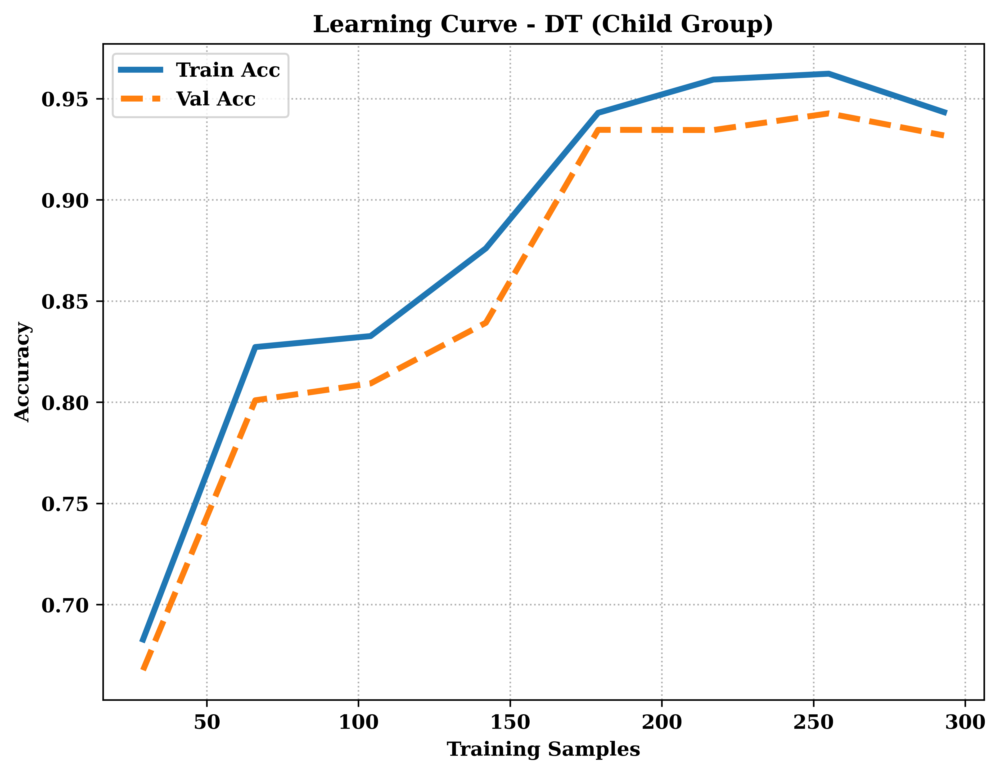


===== FINAL TEST METRICS =====
Accuracy:                 0.9468
Precision (Weighted):     0.9567
Recall (Weighted):        0.9468
Weighted F1-Score:        0.9485
Macro F1-Score:           0.9330
ROC-AUC (Weighted):       0.9962
Log-Loss:                 0.0941


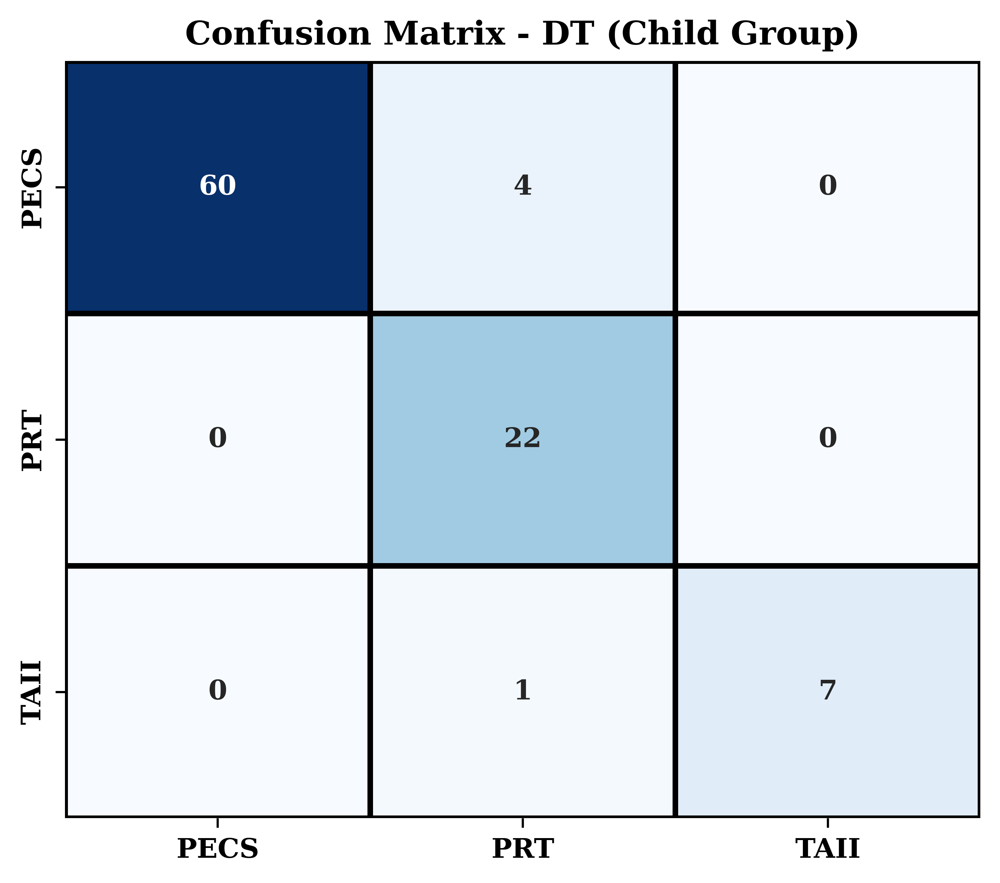

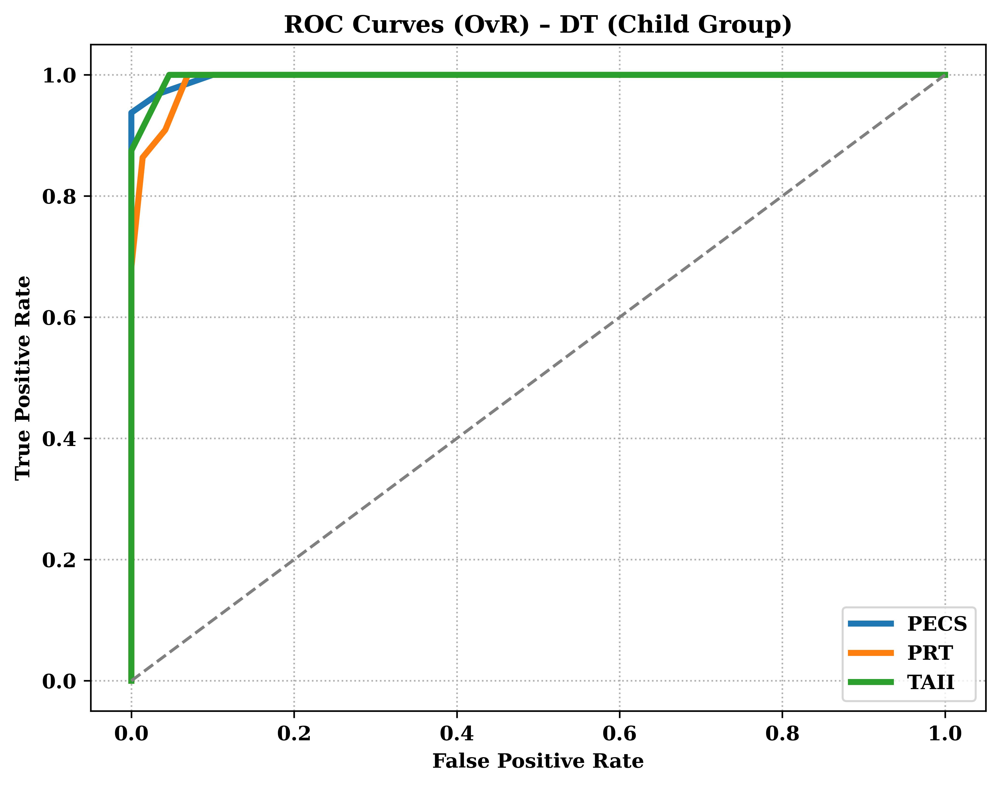


METRIC                    | MEAN     | STD      | 95% CONFIDENCE INTERVAL
-------------------------------------------------------------------------------------
Accuracy                  | 0.9471   | 0.0237   | [0.8936 - 0.9894]
Precision                 | 0.9585   | 0.0153   | [0.9296 - 0.9898]
Recall                    | 0.9471   | 0.0237   | [0.8936 - 0.9894]
Weighted F1               | 0.9487   | 0.0223   | [0.9001 - 0.9894]
Macro F1                  | 0.9307   | 0.0365   | [0.8514 - 0.9896]
ROC-AUC                   | 0.9962   | 0.0026   | [0.9898 - 1.0000]
Log-Loss                  | 0.0939   | 0.0282   | [0.0455 - 0.1548]


In [ ]:
# ============================================================
# Import
# ============================================================
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter
import warnings
warnings.filterwarnings("ignore")

from sklearn.model_selection import StratifiedKFold, GridSearchCV, learning_curve
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder, LabelEncoder, label_binarize
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import (
    accuracy_score, f1_score, precision_score, recall_score,
    roc_auc_score, log_loss, confusion_matrix, roc_curve
)
from sklearn.base import clone
from sklearn.utils import resample

plt.rcParams.update({
    "font.family": "serif",
    "font.weight": "bold",
    "axes.labelweight": "bold",
    "axes.titleweight": "bold"
})

# ============================================================
# 1. LOAD DATA
# ============================================================
train_path = "/content/drive/MyDrive/Colab Notebooks/My Thesis on ASD Education/ASD_Datasets/ChildGroup_MERGED_train.csv"
test_path  = "/content/drive/MyDrive/Colab Notebooks/My Thesis on ASD Education/ASD_Datasets/ChildGroup_MERGED_test.csv"

df_train = pd.read_csv(train_path)
df_test  = pd.read_csv(test_path)

drop_cols = ["Case_No", "Class_ASD", "Score", "Teaching_Strategy"]
X_train = df_train.drop(columns=drop_cols)
y_train = df_train["Teaching_Strategy"]
X_test  = df_test.drop(columns=drop_cols)
y_test  = df_test["Teaching_Strategy"]

# ============================================================
# 2. HANDLE MISSING VALUES
# ============================================================
placeholders = ['?', '.', 'NA', '', '@', 'NONE']
for ph in placeholders:
    X_train.replace(ph, np.nan, inplace=True)
    X_test.replace(ph, np.nan, inplace=True)

numeric_imputer = SimpleImputer(strategy='median')
categorical_imputer = SimpleImputer(strategy='most_frequent')

numeric_cols = [f"A{i}" for i in range(1, 11)] + ["Age"]
categorical_cols = [c for c in X_train.columns if c not in numeric_cols]

ohe = OneHotEncoder(drop="first", handle_unknown="ignore", min_frequency=0.05, sparse_output=False)

le = LabelEncoder()
y_train_enc = le.fit_transform(y_train.astype(str))
y_test_enc  = le.transform(y_test.astype(str))
classes = le.classes_
n_classes = len(classes)

strategy_short = {
    "Pivotal Response Treatment": "PRT",
    "Task Analysis": "TA",
    "Peer Mediated Instruction and Intervention": "PMII",
    "Picture Exchange Communication System": "PECS",
    "Technology Aided Instruction and Intervention": "TAII"
}
short_classes = [strategy_short.get(c.replace("_"," "), c) for c in classes]

# ============================================================
# 3. COLUMN TRANSFORMER & PIPELINE
# ============================================================
preprocessor = ColumnTransformer(transformers=[
    ('num', Pipeline([('imputer', numeric_imputer)]), numeric_cols),
    ('cat', Pipeline([('imputer', categorical_imputer), ('ohe', ohe)]), categorical_cols)
])

pipe = Pipeline([
    ("preproc", preprocessor),
    ("clf", DecisionTreeClassifier(random_state=42))
])

# ============================================================
# 4. HYPERPARAM GRID (TREE COMPLEXITY)
# ============================================================
param_grid = {
    "clf__criterion": ["gini", "entropy"],
    "clf__max_depth": [5, 7, 10],
    "clf__min_samples_leaf": [10, 15, 20]
}

outer_cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
inner_cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# ============================================================
# 5. NESTED CV
# ============================================================
DT_child_outer_scores = []
DT_child_outer_params = []

print("Starting Nested CV (DT Child)...")

for fold, (tr_idx, val_idx) in enumerate(outer_cv.split(X_train, y_train_enc), 1):
    X_tr, X_val = X_train.iloc[tr_idx], X_train.iloc[val_idx]
    y_tr, y_val = y_train_enc[tr_idx], y_train_enc[val_idx]

    grid = GridSearchCV(pipe, param_grid, cv=inner_cv,
                        scoring="accuracy", n_jobs=-1)
    grid.fit(X_tr, y_tr)

    pred = grid.best_estimator_.predict(X_val)
    acc = accuracy_score(y_val, pred)

    #Store fold-wise accuracy
    DT_child_outer_scores.append(acc)
    DT_child_outer_params.append(grid.best_params_)

    print(f"Fold {fold} complete: Accuracy = {accuracy_score(y_val, pred):.4f}")

print("\n===== Child DT OUTER FOLD SCORES =====")
for i, score in enumerate(DT_child_outer_scores, 1):
    print(f"Fold {i}: {score:.4f}")

print("\nDT_outer_scores:")
print(DT_child_outer_scores)

print("\nOuter CV Accuracy: %.4f ± %.4f" % (np.mean(DT_child_outer_scores), np.std(DT_child_outer_scores)))


# ============================================================
# 6. FINAL GRID SEARCH + 1-SE PARSIMONIOUS RULE
# ============================================================
final_search = GridSearchCV(pipe, param_grid, cv=inner_cv, scoring="accuracy", n_jobs=-1)
final_search.fit(X_train, y_train_enc)
results = pd.DataFrame(final_search.cv_results_)

best_idx = results["mean_test_score"].idxmax()
max_mean = results.loc[best_idx, "mean_test_score"]
se = results.loc[best_idx, "std_test_score"] / np.sqrt(inner_cv.get_n_splits())
threshold = max_mean - se

candidates = results[results["mean_test_score"] >= threshold].copy()
candidates.sort_values(by=["param_clf__max_depth", "param_clf__min_samples_leaf"],
                       ascending=[True, True], inplace=True)
final_params = candidates.iloc[0]["params"]

print("\nSelected parameters (1-SE parsimonious):")
print(final_params)

# ============================================================
# 7. FINAL MODEL FIT
# ============================================================
final_model = clone(pipe)
final_model.set_params(**final_params)
final_model.fit(X_train, y_train_enc)

# ============================================================
# 8. FEATURE IMPORTANCE
# ============================================================
feature_names = final_model.named_steps["preproc"].get_feature_names_out()
n_features = len(feature_names)

importances = final_model.named_steps["clf"].feature_importances_
feat_imp = pd.DataFrame({"Feature": feature_names, "Importance": importances}).sort_values("Importance", ascending=False)

print("\n===== FEATURE INFORMATION =====")
print(f"Total input features after preprocessing: {n_features}")
print("\nTop 15 Most Important Features (DT, interpretation only):")
print(feat_imp.head(15))

# ============================================================
# 9. LEARNING CURVE
# ============================================================
ts, train_acc, val_acc = learning_curve(final_model, X_train, y_train_enc,
                                       cv=outer_cv, scoring="accuracy",
                                       train_sizes=np.linspace(0.1, 1.0, 8), n_jobs=-1)

plt.figure(figsize=(8,6), dpi=600)
plt.plot(ts, train_acc.mean(axis=1), linewidth=3, label="Train Acc")
plt.plot(ts, val_acc.mean(axis=1), linestyle="--", linewidth=3, label="Val Acc")
plt.xlabel("Training Samples")
plt.ylabel("Accuracy")
plt.title("Learning Curve - DT (Child Group)")
plt.legend()
plt.grid(True, linestyle=":")
plt.show()

# ============================================================
# 10. FINAL TEST EVALUATION
# ============================================================
y_test_pred = final_model.predict(X_test)
y_test_prob = final_model.predict_proba(X_test)
y_test_bin  = label_binarize(y_test_enc, classes=range(n_classes))

print("\n===== FINAL TEST METRICS =====")
print("="*40)
print(f"{'Accuracy:':25s} {accuracy_score(y_test_enc, y_test_pred):.4f}")
print(f"{'Precision (Weighted):':25s} {precision_score(y_test_enc, y_test_pred, average='weighted'):.4f}")
print(f"{'Recall (Weighted):':25s} {recall_score(y_test_enc, y_test_pred, average='weighted'):.4f}")
print(f"{'Weighted F1-Score:':25s} {f1_score(y_test_enc, y_test_pred, average='weighted'):.4f}")
print(f"{'Macro F1-Score:':25s} {f1_score(y_test_enc, y_test_pred, average='macro'):.4f}")
print(f"{'ROC-AUC (Weighted):':25s} {roc_auc_score(y_test_bin, y_test_prob, average='weighted', multi_class='ovr'):.4f}")
print(f"{'Log-Loss:':25s} {log_loss(y_test_enc, y_test_prob):.4f}")
print("="*40)

# ============================================================
# 11. CONFUSION MATRIX
# ============================================================
cm = confusion_matrix(y_test_enc, y_test_pred)
plt.figure(figsize=(6,5), dpi=600)
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=short_classes, yticklabels=short_classes,
            linewidths=2, linecolor="black", cbar=False)
plt.title("Confusion Matrix - DT (Child Group)")
plt.show()

# ============================================================
# 12. ROC CURVES
# ============================================================
plt.figure(figsize=(8,6), dpi=600)
for i in range(n_classes):
    fpr, tpr, _ = roc_curve(y_test_bin[:, i], y_test_prob[:, i])
    plt.plot(fpr, tpr, linewidth=3, label=short_classes[i])
plt.plot([0,1], [0,1], "--", color="gray")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curves (OvR) – DT (Child Group)")
plt.legend()
plt.grid(True, linestyle=":")
plt.show()

# ============================================================
# 13. BOOTSTRAP CI & STD
# ============================================================
def bootstrap_metrics_report(y_true, y_pred, y_prob, n_classes, n_bootstrap=1000):
    rng = np.random.RandomState(42)
    boot_metrics = {
        "Accuracy": [], "Precision": [], "Recall": [],
        "Weighted F1": [], "Macro F1": [], "ROC-AUC": [], "Log-Loss": []
    }
    y_true_bin = label_binarize(y_true, classes=range(n_classes))

    for _ in range(n_bootstrap):
        idx = resample(np.arange(len(y_true)), replace=True, random_state=rng)
        if len(np.unique(y_true[idx])) < n_classes: continue
        boot_metrics["Accuracy"].append(accuracy_score(y_true[idx], y_pred[idx]))
        boot_metrics["Precision"].append(precision_score(y_true[idx], y_pred[idx], average='weighted'))
        boot_metrics["Recall"].append(recall_score(y_true[idx], y_pred[idx], average='weighted'))
        boot_metrics["Weighted F1"].append(f1_score(y_true[idx], y_pred[idx], average='weighted'))
        boot_metrics["Macro F1"].append(f1_score(y_true[idx], y_pred[idx], average='macro'))
        boot_metrics["ROC-AUC"].append(roc_auc_score(y_true_bin[idx], y_prob[idx], average='weighted', multi_class='ovr'))
        boot_metrics["Log-Loss"].append(log_loss(y_true[idx], y_prob[idx]))

    results_summary = {}
    for metric, values in boot_metrics.items():
        results_summary[metric] = {
            "mean": np.mean(values),
            "std": np.std(values),
            "low_ci": np.percentile(values, 2.5),
            "high_ci": np.percentile(values, 97.5)
        }
    return results_summary

final_stats = bootstrap_metrics_report(y_test_enc, y_test_pred, y_test_prob, n_classes)

print("\n" + "="*85)
print(f"{'METRIC':25s} | {'MEAN':8s} | {'STD':8s} | {'95% CONFIDENCE INTERVAL'}")
print("-" * 85)
for metric, stats in final_stats.items():
    print(f"{metric:25s} | {stats['mean']:.4f}   | {stats['std']:.4f}   | [{stats['low_ci']:.4f} - {stats['high_ci']:.4f}]")
print("="*85)


# **RFC Toddler**

Starting Nested CV (RFC Toddler)...
Fold 1 complete: Accuracy = 0.9718
Fold 2 complete: Accuracy = 0.9879
Fold 3 complete: Accuracy = 0.9718
Fold 4 complete: Accuracy = 0.9677
Fold 5 complete: Accuracy = 0.9637

===== Toddler RFC OUTER FOLD SCORES =====
Fold 1: 0.9718
Fold 2: 0.9879
Fold 3: 0.9718
Fold 4: 0.9677
Fold 5: 0.9637

RFC_outer_scores :
[0.9717741935483871, 0.9879032258064516, 0.9717741935483871, 0.967741935483871, 0.9637096774193549]

Outer CV Accuracy: 0.9726 ± 0.0082

Selected parameters (1-SE parsimonious):
{'clf__max_depth': 20, 'clf__max_features': 'sqrt', 'clf__min_samples_leaf': 3, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}

===== FEATURE INFORMATION =====
Total input features after preprocessing (OHE expanded): 28

Top 15 Most Important Features (RFC, interpretation only):
                          Feature  Importance
7                         num__A8    0.237173
1                         num__A2    0.222466
5                         num__A6    0.177282
8

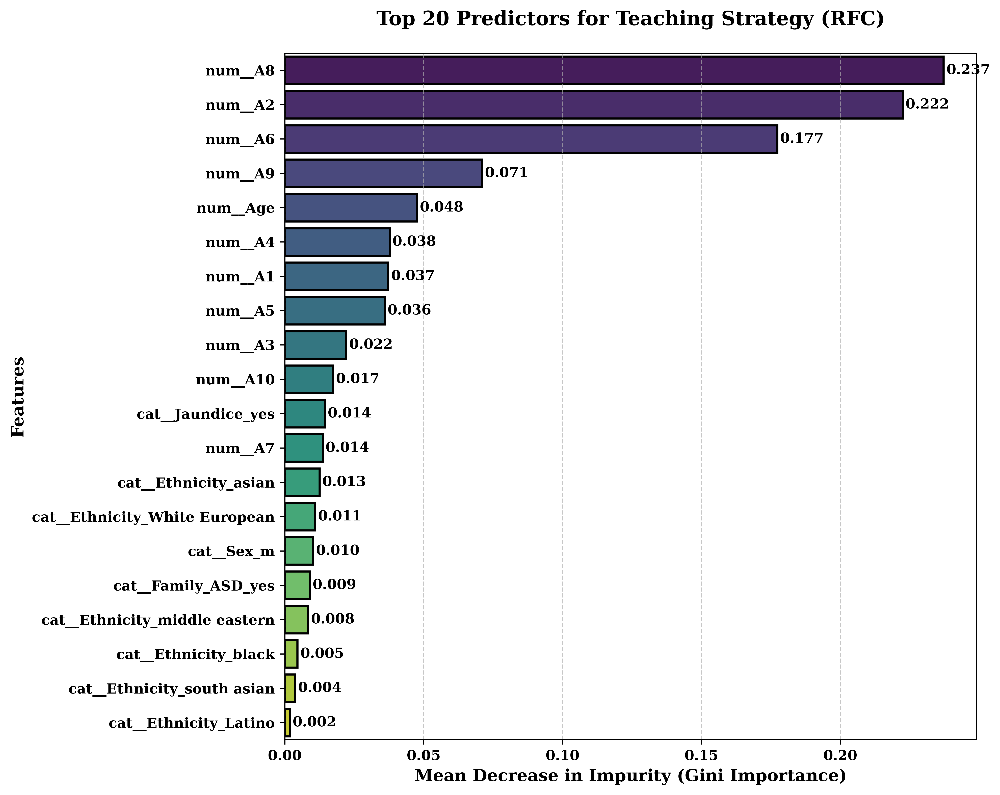

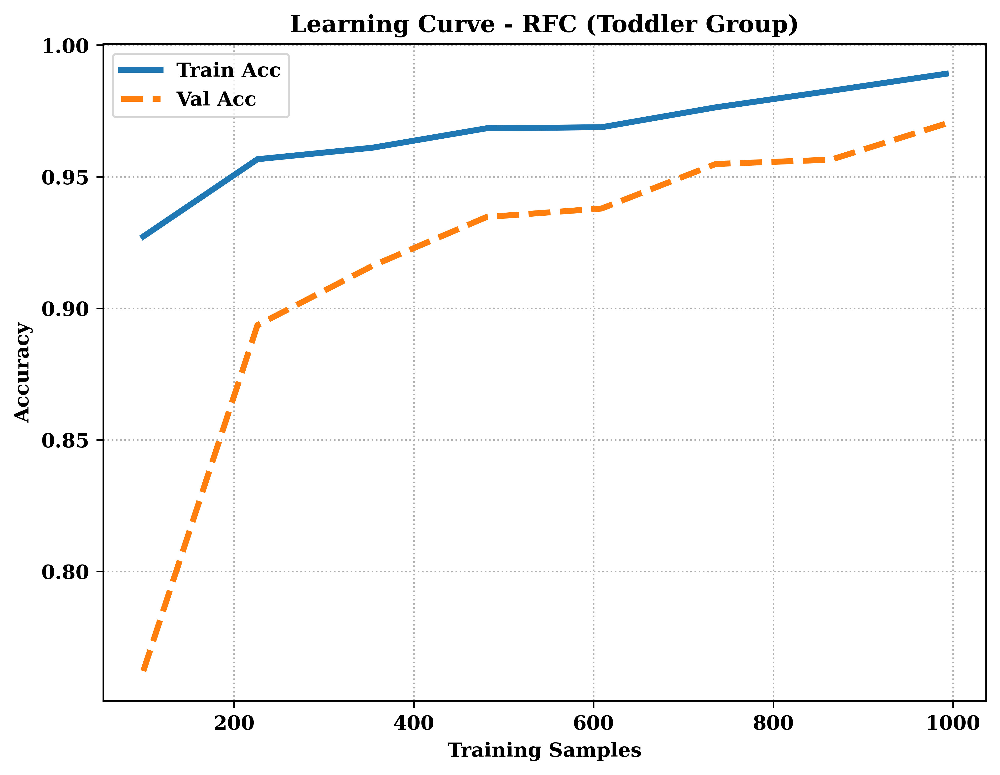


===== FINAL TEST METRICS =====
Accuracy:                 0.9871
Precision (Weighted):     0.9876
Recall (Weighted):        0.9871
Weighted F1-Score:        0.9870
Macro F1-Score:           0.9838
ROC-AUC (Weighted):       0.9998
Log-Loss:                 0.2795


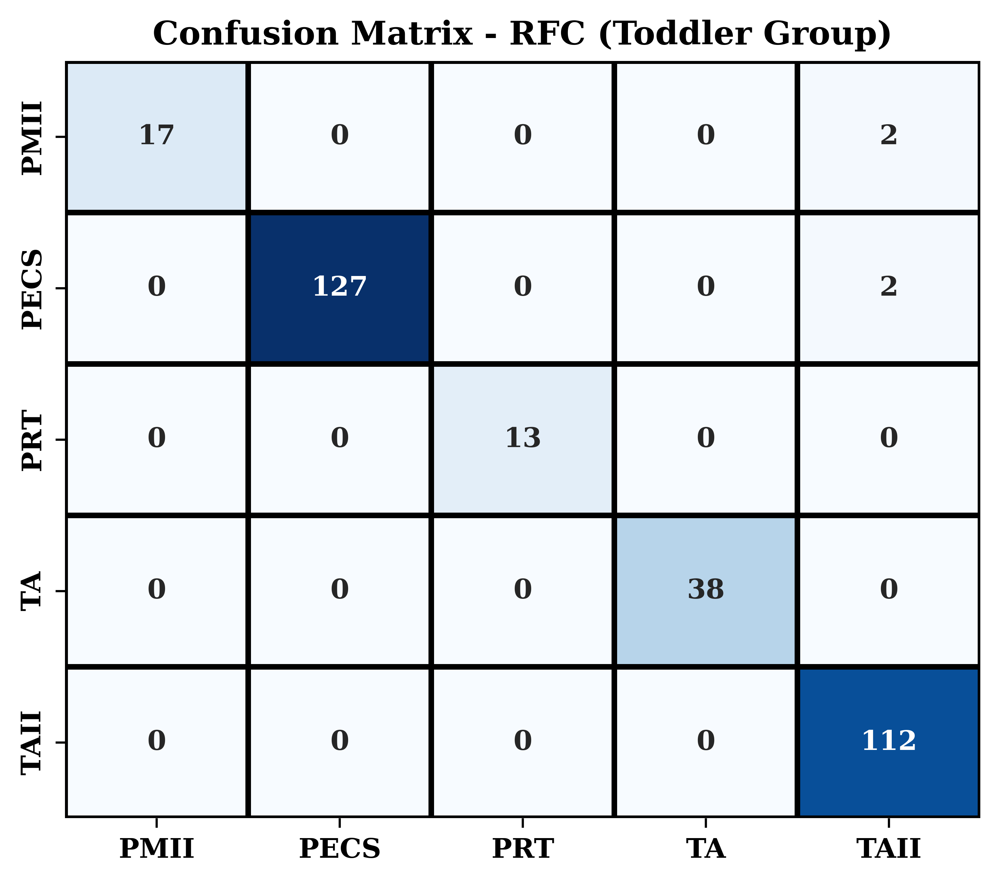

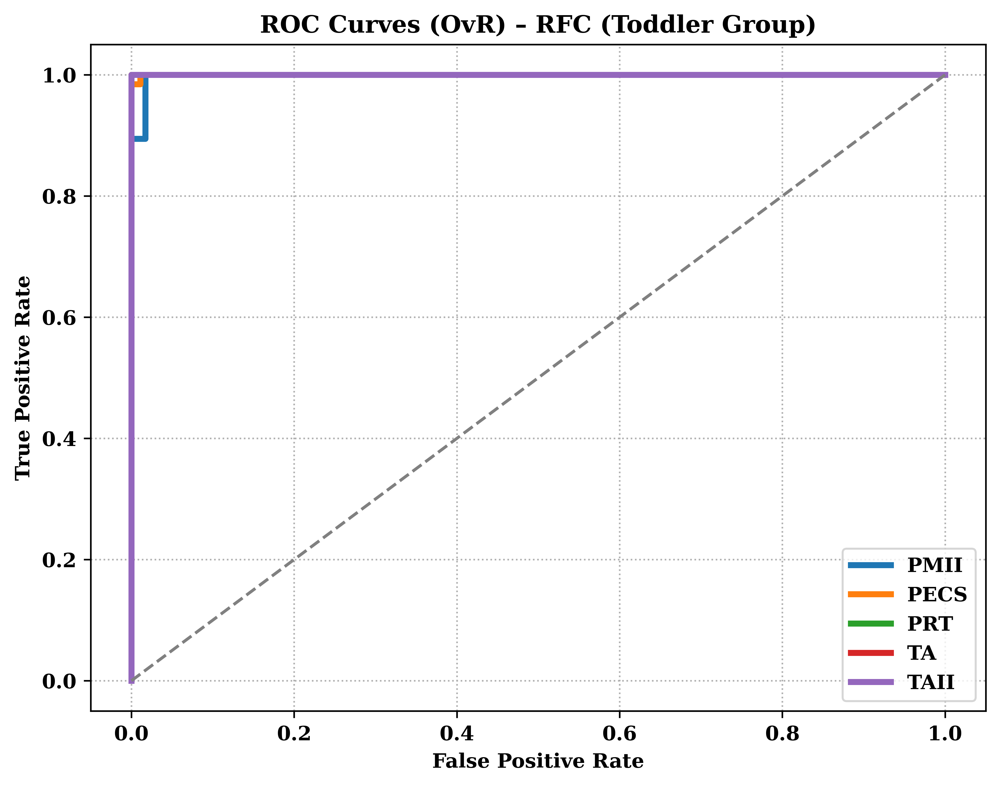

Calculating Bootstrap Statistics (1000 iterations)...

METRIC                    | MEAN     | STD      | 95% CONFIDENCE INTERVAL
-------------------------------------------------------------------------------------
Accuracy                  | 0.9872   | 0.0063   | [0.9743 - 0.9968]
Precision                 | 0.9878   | 0.0058   | [0.9759 - 0.9968]
Recall                    | 0.9872   | 0.0063   | [0.9743 - 0.9968]
Weighted F1               | 0.9870   | 0.0064   | [0.9732 - 0.9968]
Macro F1                  | 0.9836   | 0.0097   | [0.9623 - 0.9984]
ROC-AUC                   | 0.9998   | 0.0001   | [0.9995 - 1.0000]
Log-Loss                  | 0.2799   | 0.0144   | [0.2523 - 0.3083]


In [ ]:
# ===========================RFC Toddler 5 fold==================================
# 1. IMPORTS
# ===========================Checking like Child================================
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

from sklearn.model_selection import StratifiedKFold, GridSearchCV, learning_curve
from sklearn.pipeline import Pipeline
from collections import Counter
from sklearn.preprocessing import OneHotEncoder, LabelEncoder, StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import label_binarize
from sklearn.metrics import (
    accuracy_score, f1_score, precision_score, recall_score,
    roc_auc_score, log_loss, confusion_matrix, roc_curve
)
from sklearn.base import clone
from sklearn.utils import resample

plt.rcParams.update({
    "font.family": "serif",
    "font.weight": "bold",
    "axes.labelweight": "bold",
    "axes.titleweight": "bold"
})

# ============================================================
# 2. LOAD DATA
# ============================================================
train_path = "/content/drive/MyDrive/Colab Notebooks/My Thesis on ASD Education/ASD_Datasets/ToddlerGroup_MERGED_train.csv"
test_path  = "/content/drive/MyDrive/Colab Notebooks/My Thesis on ASD Education/ASD_Datasets/ToddlerGroup_MERGED_test.csv"

df_train = pd.read_csv(train_path)
df_test  = pd.read_csv(test_path)

drop_cols = ["Case_No", "Class_ASD", "Score", "Teaching_Strategy"]
X_train = df_train.drop(columns=drop_cols)
y_train = df_train["Teaching_Strategy"]
X_test  = df_test.drop(columns=drop_cols)
y_test  = df_test["Teaching_Strategy"]

# ============================================================
# 3. HANDLE MISSING VALUES
# ============================================================
placeholders = ['?', '.', 'NA', '', '@', 'NONE']
for ph in placeholders:
    X_train.replace(ph, np.nan, inplace=True)
    X_test.replace(ph, np.nan, inplace=True)

numeric_imputer = SimpleImputer(strategy='median')
categorical_imputer = SimpleImputer(strategy='most_frequent')

# ============================================================
# 4. PREPROCESSING
# ============================================================
numeric_cols = [f"A{i}" for i in range(1, 11)] + ["Age"]
categorical_cols = [c for c in X_train.columns if c not in numeric_cols]

ohe = OneHotEncoder(drop="first", handle_unknown="ignore", sparse_output=False)

le = LabelEncoder()
y_train_enc = le.fit_transform(y_train.astype(str))
y_test_enc  = le.transform(y_test.astype(str))
classes = le.classes_
n_classes = len(classes)

strategy_short = {
    "Pivotal Response Treatment": "PRT",
    "Task Analysis": "TA",
    "Peer Mediated Instruction and Intervention": "PMII",
    "Picture Exchange Communication System": "PECS",
    "Technology Aided Instruction and Intervention": "TAII"
}
short_classes = [strategy_short.get(c.replace("_"," "), c) for c in classes]

# ============================================================
# 5. COLUMN TRANSFORMER & PIPELINE
# ============================================================
preprocessor = ColumnTransformer(transformers=[
    ('num', Pipeline([('imputer', numeric_imputer)]), numeric_cols),
    ('cat', Pipeline([('imputer', categorical_imputer), ('ohe', ohe)]), categorical_cols)
])

pipe = Pipeline([
    ("preproc", preprocessor),
    ("clf", RandomForestClassifier(random_state=42, n_jobs=-1))
])

# ============================================================
# 6. HYPERPARAM GRID (TREE COMPLEXITY ONLY)
# ============================================================
param_grid = {
    "clf__n_estimators": [200, 300, 400],
    "clf__max_depth": [20, 25, 30, None],
    "clf__min_samples_leaf": [3, 4, 6],
    "clf__min_samples_split": [5, 10, 15],      # Added to ensure each split is meaningful
    "clf__max_features": ["sqrt"]
}

outer_cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
inner_cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# ============================================================
# 7. NESTED CV
# ============================================================
RFC_toddler_outer_scores = []
RFC_toddler_outer_params = []

print("Starting Nested CV (RFC Toddler)...")

for fold, (tr_idx, val_idx) in enumerate(outer_cv.split(X_train, y_train_enc), 1):
    X_tr, X_val = X_train.iloc[tr_idx], X_train.iloc[val_idx]
    y_tr, y_val = y_train_enc[tr_idx], y_train_enc[val_idx]

    grid = GridSearchCV(pipe, param_grid, cv=inner_cv,
                        scoring="accuracy", n_jobs=-1)
    grid.fit(X_tr, y_tr)

    pred = grid.best_estimator_.predict(X_val)
    acc = accuracy_score(y_val, pred)

    #Store fold-wise accuracy
    RFC_toddler_outer_scores.append(acc)
    RFC_toddler_outer_params.append(grid.best_params_)

    print(f"Fold {fold} complete: Accuracy = {accuracy_score(y_val, pred):.4f}")

print("\n===== Toddler RFC OUTER FOLD SCORES =====")
for i, score in enumerate(RFC_toddler_outer_scores, 1):
    print(f"Fold {i}: {score:.4f}")

print("\nRFC_outer_scores :")
print(RFC_toddler_outer_scores)

print("\nOuter CV Accuracy: %.4f ± %.4f" % (np.mean(RFC_toddler_outer_scores), np.std(RFC_toddler_outer_scores)))

# ============================================================
# 8. FINAL GRID SEARCH + 1-SE PARSIMONIOUS RULE
# ============================================================
final_search = GridSearchCV(
    pipe,
    param_grid,
    cv=inner_cv,
    scoring="accuracy",
    n_jobs=-1
)
final_search.fit(X_train, y_train_enc)
results = pd.DataFrame(final_search.cv_results_)

best_idx = results["mean_test_score"].idxmax()
max_mean = results.loc[best_idx, "mean_test_score"]
se = results.loc[best_idx, "std_test_score"] / np.sqrt(inner_cv.get_n_splits())
threshold = max_mean - se

candidates = results[results["mean_test_score"] >= threshold].copy()
candidates.sort_values(
    by=["param_clf__max_depth", "param_clf__min_samples_leaf", "param_clf__n_estimators"],
    ascending=[True, False, True],
    inplace=True
)
final_params = candidates.iloc[0]["params"]

print("\nSelected parameters (1-SE parsimonious):")
print(final_params)

# ============================================================
# 9. FINAL MODEL FIT
# ============================================================
final_model = clone(pipe)
final_model.set_params(**final_params)
final_model.fit(X_train, y_train_enc)

# ============================================================
# 10. FEATURE COUNT & IMPORTANCE
# ============================================================
feature_names = final_model.named_steps["preproc"].get_feature_names_out()
n_features = len(feature_names)

print("\n===== FEATURE INFORMATION =====")
print(f"Total input features after preprocessing (OHE expanded): {n_features}")

importances = final_model.named_steps["clf"].feature_importances_
feat_imp = pd.DataFrame({"Feature": feature_names, "Importance": importances}).sort_values("Importance", ascending=False)
print("\nTop 15 Most Important Features (RFC, interpretation only):")
print(feat_imp.head(15))

# ============================================================
# 10b. VISUALIZE FEATURE IMPORTANCE
# ============================================================
# Selecting top 20 for a clean visualization
top_n = 20
feat_imp_plot = feat_imp.head(top_n).copy()

plt.figure(figsize=(10, 8), dpi=600)
sns.barplot(
    x="Importance",
    y="Feature",
    data=feat_imp_plot,
    palette="viridis",
    edgecolor="black",
    linewidth=1.5
)

plt.title(f"Top {top_n} Predictors for Teaching Strategy (RFC)", fontsize=14, pad=20)
plt.xlabel("Mean Decrease in Impurity (Gini Importance)", fontsize=12)
plt.ylabel("Features", fontsize=12)
plt.grid(axis='x', linestyle='--', alpha=0.7)

# Adding values at the end of bars for precision
for index, value in enumerate(feat_imp_plot["Importance"]):
    plt.text(value + 0.001, index, f'{value:.3f}', va='center', fontweight='bold')

plt.tight_layout()
plt.savefig("Feature_Importance_Toddler.pdf", format='pdf', bbox_inches='tight', dpi=600)
plt.show()

# ============================================================
# 11. LEARNING CURVE
# ============================================================
ts, train_acc, val_acc = learning_curve(
    final_model, X_train, y_train_enc,
    cv=outer_cv, scoring="accuracy",
    train_sizes=np.linspace(0.1, 1.0, 8), n_jobs=-1
)

plt.figure(figsize=(8,6), dpi=600)
plt.plot(ts, train_acc.mean(axis=1), linewidth=3, label="Train Acc")
plt.plot(ts, val_acc.mean(axis=1), linestyle="--", linewidth=3, label="Val Acc")
plt.xlabel("Training Samples")
plt.ylabel("Accuracy")
plt.title("Learning Curve - RFC (Toddler Group)")
plt.legend()
plt.grid(True, linestyle=":")
plt.show()

# ============================================================
# 12. FINAL TEST EVALUATION
# ============================================================
y_test_pred = final_model.predict(X_test)
y_test_prob = final_model.predict_proba(X_test)
y_test_bin  = label_binarize(y_test_enc, classes=range(n_classes))

print("\n===== FINAL TEST METRICS =====")
print("="*40)
print(f"{'Accuracy:':25s} {accuracy_score(y_test_enc, y_test_pred):.4f}")
print(f"{'Precision (Weighted):':25s} {precision_score(y_test_enc, y_test_pred, average='weighted'):.4f}")
print(f"{'Recall (Weighted):':25s} {recall_score(y_test_enc, y_test_pred, average='weighted'):.4f}")
print(f"{'Weighted F1-Score:':25s} {f1_score(y_test_enc, y_test_pred, average='weighted'):.4f}")
print(f"{'Macro F1-Score:':25s} {f1_score(y_test_enc, y_test_pred, average='macro'):.4f}")
print(f"{'ROC-AUC (Weighted):':25s} {roc_auc_score(y_test_bin, y_test_prob, average='weighted', multi_class='ovr'):.4f}")
print(f"{'Log-Loss:':25s} {log_loss(y_test_enc, y_test_prob):.4f}")
print("="*40)

cm = confusion_matrix(y_test_enc, y_test_pred)
plt.figure(figsize=(6,5), dpi=600)
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=short_classes, yticklabels=short_classes,
            linewidths=2, linecolor="black", cbar=False)
plt.title("Confusion Matrix - RFC (Toddler Group)")
plt.show()

# ============================================================
# 13. ROC CURVES
# ============================================================
plt.figure(figsize=(8,6), dpi=600)
for i in range(n_classes):
    fpr, tpr, _ = roc_curve(y_test_bin[:, i], y_test_prob[:, i])
    plt.plot(fpr, tpr, linewidth=3, label=short_classes[i])
plt.plot([0,1], [0,1], "--", color="gray")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curves (OvR) – RFC (Toddler Group)")
plt.legend()
plt.grid(True, linestyle=":")
plt.show()

# ============================================================
# 14. BOOTSTRAP CI & STD
# ============================================================
def bootstrap_metrics_report(y_true, y_pred, y_prob, n_classes, n_bootstrap=1000):
    rng = np.random.RandomState(42)
    boot_metrics = {
        "Accuracy": [], "Precision": [], "Recall": [],
        "Weighted F1": [], "Macro F1": [], "ROC-AUC": [], "Log-Loss": []
    }
    y_true_bin = label_binarize(y_true, classes=range(n_classes))

    print(f"Calculating Bootstrap Statistics ({n_bootstrap} iterations)...")
    for _ in range(n_bootstrap):
        idx = resample(np.arange(len(y_true)), replace=True, random_state=rng)
        if len(np.unique(y_true[idx])) < n_classes: continue
        boot_metrics["Accuracy"].append(accuracy_score(y_true[idx], y_pred[idx]))
        boot_metrics["Precision"].append(precision_score(y_true[idx], y_pred[idx], average='weighted'))
        boot_metrics["Recall"].append(recall_score(y_true[idx], y_pred[idx], average='weighted'))
        boot_metrics["Weighted F1"].append(f1_score(y_true[idx], y_pred[idx], average='weighted'))
        boot_metrics["Macro F1"].append(f1_score(y_true[idx], y_pred[idx], average='macro'))
        boot_metrics["ROC-AUC"].append(roc_auc_score(y_true_bin[idx], y_prob[idx], average='weighted', multi_class='ovr'))
        boot_metrics["Log-Loss"].append(log_loss(y_true[idx], y_prob[idx]))

    results_summary = {}
    for metric, values in boot_metrics.items():
        results_summary[metric] = {
            "mean": np.mean(values),
            "std": np.std(values),
            "low_ci": np.percentile(values, 2.5),
            "high_ci": np.percentile(values, 97.5)
        }
    return results_summary

final_stats = bootstrap_metrics_report(y_test_enc, y_test_pred, y_test_prob, n_classes)

print("\n" + "="*85)
print(f"{'METRIC':25s} | {'MEAN':8s} | {'STD':8s} | {'95% CONFIDENCE INTERVAL'}")
print("-" * 85)
for metric, stats in final_stats.items():
    print(f"{metric:25s} | {stats['mean']:.4f}   | {stats['std']:.4f}   | [{stats['low_ci']:.4f} - {stats['high_ci']:.4f}]")
print("="*85)



# **RFC Child**

Starting Nested CV (RFC child)
Fold 1 complete: Accuracy = 0.9730
Fold 2 complete: Accuracy = 0.9054
Fold 3 complete: Accuracy = 0.9315
Fold 4 complete: Accuracy = 0.9589
Fold 5 complete: Accuracy = 0.9863

===== RFC OUTER FOLD SCORES =====
Fold 1: 0.9730
Fold 2: 0.9054
Fold 3: 0.9315
Fold 4: 0.9589
Fold 5: 0.9863

RFC_outer_scores :
[0.972972972972973, 0.9054054054054054, 0.9315068493150684, 0.958904109589041, 0.9863013698630136]

Outer CV Accuracy: 0.9510 ± 0.0292

Selected parameters (1-SE parsimonious):
{'clf__max_depth': 20, 'clf__max_features': 'sqrt', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 5, 'clf__n_estimators': 300}

===== FEATURE INFORMATION =====
Total input features after preprocessing (OHE expanded): 29

Top 15 Most Important Features (RFC, interpretation only):
                                   Feature  Importance
1                                  num__A2    0.453547
4                                  num__A5    0.208033
7                                 

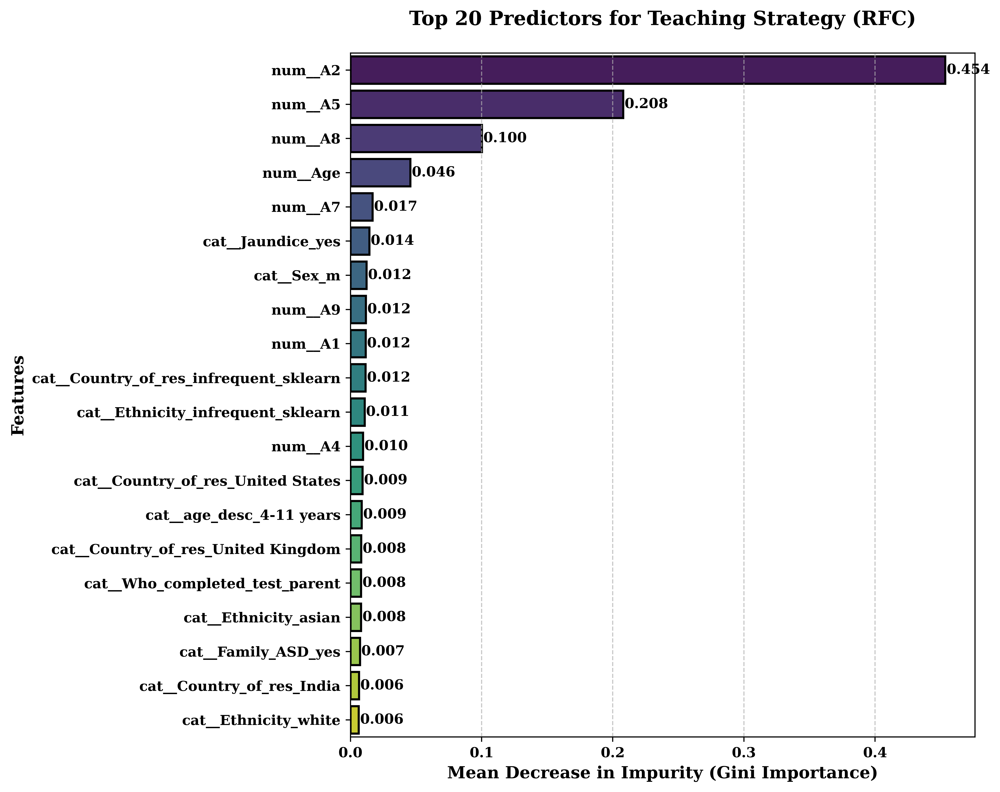

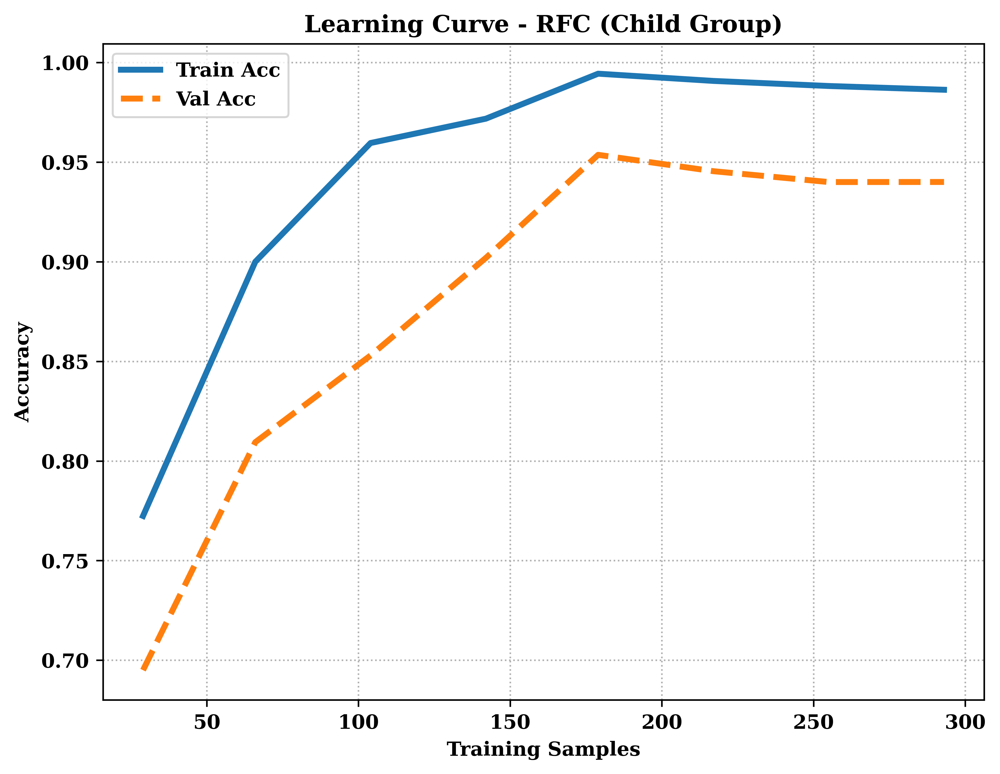


===== FINAL TEST METRICS =====
Accuracy:                 0.9787
Precision (Weighted):     0.9794
Recall (Weighted):        0.9787
Weighted F1-Score:        0.9774
Macro F1-Score:           0.9473
ROC-AUC (Weighted):       0.9982
Log-Loss:                 0.2782


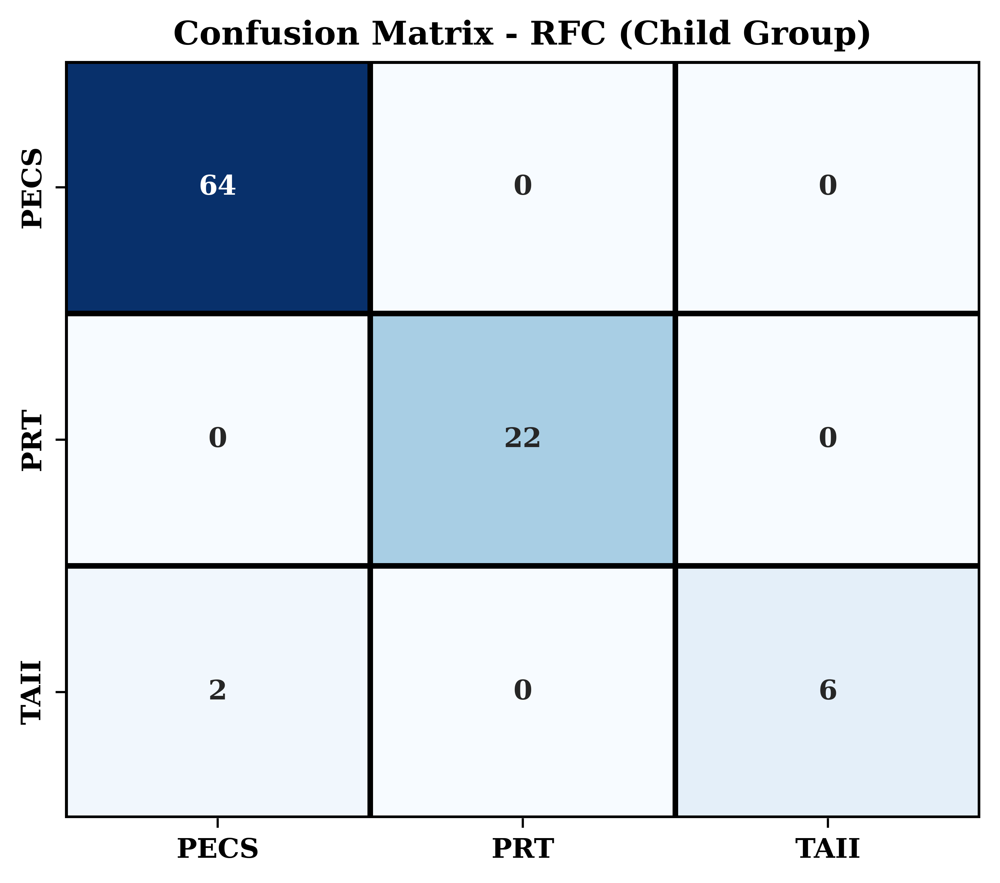

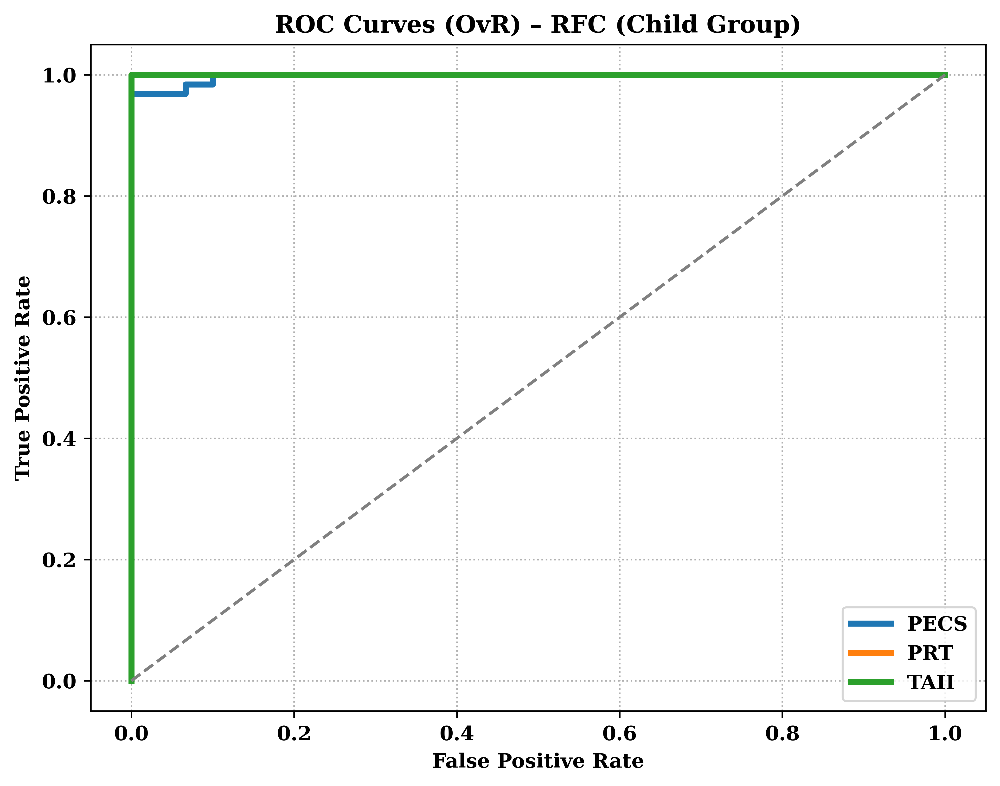

Calculating Bootstrap Statistics (1000 iterations)...

METRIC                    | MEAN     | STD      | 95% CONFIDENCE INTERVAL
-------------------------------------------------------------------------------------
Accuracy                  | 0.9787   | 0.0146   | [0.9468 - 1.0000]
Precision                 | 0.9796   | 0.0136   | [0.9507 - 1.0000]
Recall                    | 0.9787   | 0.0146   | [0.9468 - 1.0000]
Weighted F1               | 0.9766   | 0.0167   | [0.9390 - 1.0000]
Macro F1                  | 0.9429   | 0.0419   | [0.8499 - 1.0000]
ROC-AUC                   | 0.9983   | 0.0017   | [0.9939 - 1.0000]
Log-Loss                  | 0.2774   | 0.0224   | [0.2338 - 0.3241]


In [ ]:
# =========================RFC Child 5 fold===================================
# 1. IMPORTS
# ============================================================
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

from sklearn.model_selection import StratifiedKFold, GridSearchCV, learning_curve
from sklearn.pipeline import Pipeline
from collections import Counter
from sklearn.preprocessing import OneHotEncoder, LabelEncoder, StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import label_binarize
from sklearn.metrics import (
    accuracy_score, f1_score, precision_score, recall_score,
    roc_auc_score, log_loss, confusion_matrix, roc_curve
)
from sklearn.base import clone
from sklearn.utils import resample

plt.rcParams.update({
    "font.family": "serif",
    "font.weight": "bold",
    "axes.labelweight": "bold",
    "axes.titleweight": "bold"
})

# ============================================================
# 2. LOAD DATA
# ============================================================
train_path = "/content/drive/MyDrive/Colab Notebooks/My Thesis on ASD Education/ASD_Datasets/ChildGroup_MERGED_train.csv"
test_path  = "/content/drive/MyDrive/Colab Notebooks/My Thesis on ASD Education/ASD_Datasets/ChildGroup_MERGED_test.csv"

df_train = pd.read_csv(train_path)
df_test  = pd.read_csv(test_path)

drop_cols = ["Case_No", "Class_ASD", "Score", "Teaching_Strategy"]
X_train = df_train.drop(columns=drop_cols)
y_train = df_train["Teaching_Strategy"]
X_test  = df_test.drop(columns=drop_cols)
y_test  = df_test["Teaching_Strategy"]

# ============================================================
# 3. HANDLE MISSING VALUES
# ============================================================
placeholders = ['?', '.', 'NA', '', '@', 'NONE']
for ph in placeholders:
    X_train.replace(ph, np.nan, inplace=True)
    X_test.replace(ph, np.nan, inplace=True)

numeric_imputer = SimpleImputer(strategy='median')
categorical_imputer = SimpleImputer(strategy='most_frequent')

# ============================================================
# 4. PREPROCESSING
# ============================================================
numeric_cols = [f"A{i}" for i in range(1, 11)] + ["Age"]
categorical_cols = [c for c in X_train.columns if c not in numeric_cols]

ohe = OneHotEncoder(drop="first", handle_unknown="ignore", min_frequency=0.05, sparse_output=False)

le = LabelEncoder()
y_train_enc = le.fit_transform(y_train.astype(str))
y_test_enc  = le.transform(y_test.astype(str))
classes = le.classes_
n_classes = len(classes)

strategy_short = {
    "Pivotal Response Treatment": "PRT",
    "Task Analysis": "TA",
    "Peer Mediated Instruction and Intervention": "PMII",
    "Picture Exchange Communication System": "PECS",
    "Technology Aided Instruction and Intervention": "TAII"
}
short_classes = [strategy_short.get(c.replace("_"," "), c) for c in classes]

# ============================================================
# 5. COLUMN TRANSFORMER & PIPELINE
# ============================================================
preprocessor = ColumnTransformer(transformers=[
    ('num', Pipeline([('imputer', numeric_imputer)]), numeric_cols),
    ('cat', Pipeline([('imputer', categorical_imputer), ('ohe', ohe)]), categorical_cols)
])

pipe = Pipeline([
    ("preproc", preprocessor),
    ("clf", RandomForestClassifier(random_state=42, n_jobs=-1))
])

# ============================================================
# 6. HYPERPARAM GRID (TREE COMPLEXITY ONLY)
# ============================================================
param_grid = {
    "clf__n_estimators": [300, 400, 500],       # More trees = smoother orange line
    "clf__max_depth": [20, 25, 30, None],      # Allow more growth for higher accuracy
    "clf__min_samples_leaf": [3, 4, 6],    # Tighten from 10-20 to regain precision
    "clf__min_samples_split": [5, 10, 15],      # Added to ensure each split is meaningful
    "clf__max_features": ["sqrt"]          # Keep this; it's vital for Q1 journals
}

outer_cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
inner_cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# ============================================================
# 7. NESTED CV
# ============================================================
RFC_outer_scores = []
RFC_outer_params = []

print("Starting Nested CV (RFC child)")

for fold, (tr_idx, val_idx) in enumerate(outer_cv.split(X_train, y_train_enc), 1):
    X_tr, X_val = X_train.iloc[tr_idx], X_train.iloc[val_idx]
    y_tr, y_val = y_train_enc[tr_idx], y_train_enc[val_idx]

    grid = GridSearchCV(pipe, param_grid, cv=inner_cv,
                        scoring="accuracy", n_jobs=-1)
    grid.fit(X_tr, y_tr)

    pred = grid.best_estimator_.predict(X_val)
    acc = accuracy_score(y_val, pred)

    #Store fold-wise accuracy
    RFC_outer_scores.append(acc)
    RFC_outer_params.append(grid.best_params_)

    print(f"Fold {fold} complete: Accuracy = {accuracy_score(y_val, pred):.4f}")

print("\n===== RFC OUTER FOLD SCORES =====")
for i, score in enumerate(RFC_outer_scores, 1):
    print(f"Fold {i}: {score:.4f}")

print("\nRFC_outer_scores :")
print(RFC_outer_scores)

print("\nOuter CV Accuracy: %.4f ± %.4f" % (np.mean(RFC_outer_scores), np.std(RFC_outer_scores)))

# ============================================================
# 8. FINAL GRID SEARCH + 1-SE PARSIMONIOUS RULE
# ============================================================
final_search = GridSearchCV(
    pipe,
    param_grid,
    cv=inner_cv,
    scoring="accuracy",
    n_jobs=-1
)
final_search.fit(X_train, y_train_enc)
results = pd.DataFrame(final_search.cv_results_)

best_idx = results["mean_test_score"].idxmax()
max_mean = results.loc[best_idx, "mean_test_score"]
se = results.loc[best_idx, "std_test_score"] / np.sqrt(inner_cv.get_n_splits())
threshold = max_mean - se

candidates = results[results["mean_test_score"] >= threshold].copy()
candidates.sort_values(
    by=["param_clf__max_depth", "param_clf__min_samples_leaf", "param_clf__n_estimators"],
    ascending=[True, False, True],
    inplace=True
)
final_params = candidates.iloc[0]["params"]

print("\nSelected parameters (1-SE parsimonious):")
print(final_params)

# ============================================================
# 9. FINAL MODEL FIT
# ============================================================
final_model = clone(pipe)
final_model.set_params(**final_params)
final_model.fit(X_train, y_train_enc)

# ============================================================
# 10. FEATURE COUNT & IMPORTANCE
# ============================================================
feature_names = final_model.named_steps["preproc"].get_feature_names_out()
n_features = len(feature_names)

print("\n===== FEATURE INFORMATION =====")
print(f"Total input features after preprocessing (OHE expanded): {n_features}")

importances = final_model.named_steps["clf"].feature_importances_
feat_imp = pd.DataFrame({"Feature": feature_names, "Importance": importances}).sort_values("Importance", ascending=False)
print("\nTop 15 Most Important Features (RFC, interpretation only):")
print(feat_imp.head(15))

# ============================================================
# 10b. VISUALIZE FEATURE IMPORTANCE
# ============================================================
# Selecting top 20 for a clean visualization
top_n = 20
feat_imp_plot = feat_imp.head(top_n).copy()

plt.figure(figsize=(10, 8), dpi=600)
sns.barplot(
    x="Importance",
    y="Feature",
    data=feat_imp_plot,
    palette="viridis",
    edgecolor="black",
    linewidth=1.5
)

# Q1 Journal Styling
plt.title(f"Top {top_n} Predictors for Teaching Strategy (RFC)", fontsize=14, pad=20)
plt.xlabel("Mean Decrease in Impurity (Gini Importance)", fontsize=12)
plt.ylabel("Features", fontsize=12)
plt.grid(axis='x', linestyle='--', alpha=0.7)

# Adding values at the end of bars for precision
for index, value in enumerate(feat_imp_plot["Importance"]):
    plt.text(value + 0.001, index, f'{value:.3f}', va='center', fontweight='bold')

plt.tight_layout()
plt.savefig("Feature_Importance_child.pdf", format='pdf', bbox_inches='tight', dpi=600)
plt.show()

# ============================================================
# 11. LEARNING CURVE
# ============================================================
ts, train_acc, val_acc = learning_curve(
    final_model, X_train, y_train_enc,
    cv=outer_cv, scoring="accuracy",
    train_sizes=np.linspace(0.1, 1.0, 8), n_jobs=-1
)

plt.figure(figsize=(8,6), dpi=600)
plt.plot(ts, train_acc.mean(axis=1), linewidth=3, label="Train Acc")
plt.plot(ts, val_acc.mean(axis=1), linestyle="--", linewidth=3, label="Val Acc")
plt.xlabel("Training Samples")
plt.ylabel("Accuracy")
plt.title("Learning Curve - RFC (Child Group)")
plt.legend()
plt.grid(True, linestyle=":")
plt.savefig("Child Learning curve.pdf", format='pdf', bbox_inches='tight', dpi=600)
plt.show()

# ============================================================
# 12. FINAL TEST EVALUATION
# ============================================================
y_test_pred = final_model.predict(X_test)
y_test_prob = final_model.predict_proba(X_test)
y_test_bin  = label_binarize(y_test_enc, classes=range(n_classes))

print("\n===== FINAL TEST METRICS =====")
print("="*40)
print(f"{'Accuracy:':25s} {accuracy_score(y_test_enc, y_test_pred):.4f}")
print(f"{'Precision (Weighted):':25s} {precision_score(y_test_enc, y_test_pred, average='weighted'):.4f}")
print(f"{'Recall (Weighted):':25s} {recall_score(y_test_enc, y_test_pred, average='weighted'):.4f}")
print(f"{'Weighted F1-Score:':25s} {f1_score(y_test_enc, y_test_pred, average='weighted'):.4f}")
print(f"{'Macro F1-Score:':25s} {f1_score(y_test_enc, y_test_pred, average='macro'):.4f}")
print(f"{'ROC-AUC (Weighted):':25s} {roc_auc_score(y_test_bin, y_test_prob, average='weighted', multi_class='ovr'):.4f}")
print(f"{'Log-Loss:':25s} {log_loss(y_test_enc, y_test_prob):.4f}")
print("="*40)

cm = confusion_matrix(y_test_enc, y_test_pred)
plt.figure(figsize=(6,5), dpi=600)
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=short_classes, yticklabels=short_classes,
            linewidths=2, linecolor="black", cbar=False)
plt.title("Confusion Matrix - RFC (Child Group)")
plt.savefig("Child CM.pdf", format='pdf', bbox_inches='tight', dpi=600)
plt.show()

# ============================================================
# 13. ROC CURVES
# ============================================================
plt.figure(figsize=(8,6), dpi=600)
for i in range(n_classes):
    fpr, tpr, _ = roc_curve(y_test_bin[:, i], y_test_prob[:, i])
    plt.plot(fpr, tpr, linewidth=3, label=short_classes[i])
plt.plot([0,1], [0,1], "--", color="gray")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curves (OvR) – RFC (Child Group)")
plt.legend()
plt.grid(True, linestyle=":")
plt.savefig("Child ROC.pdf", format='pdf', bbox_inches='tight', dpi=600)
plt.show()

# ============================================================
# 14. BOOTSTRAP CI & STD
# ============================================================
def bootstrap_metrics_report(y_true, y_pred, y_prob, n_classes, n_bootstrap=1000):
    rng = np.random.RandomState(42)
    boot_metrics = {
        "Accuracy": [], "Precision": [], "Recall": [],
        "Weighted F1": [], "Macro F1": [], "ROC-AUC": [], "Log-Loss": []
    }
    y_true_bin = label_binarize(y_true, classes=range(n_classes))

    print(f"Calculating Bootstrap Statistics ({n_bootstrap} iterations)...")
    for _ in range(n_bootstrap):
        idx = resample(np.arange(len(y_true)), replace=True, random_state=rng)
        if len(np.unique(y_true[idx])) < n_classes: continue
        boot_metrics["Accuracy"].append(accuracy_score(y_true[idx], y_pred[idx]))
        boot_metrics["Precision"].append(precision_score(y_true[idx], y_pred[idx], average='weighted'))
        boot_metrics["Recall"].append(recall_score(y_true[idx], y_pred[idx], average='weighted'))
        boot_metrics["Weighted F1"].append(f1_score(y_true[idx], y_pred[idx], average='weighted'))
        boot_metrics["Macro F1"].append(f1_score(y_true[idx], y_pred[idx], average='macro'))
        boot_metrics["ROC-AUC"].append(roc_auc_score(y_true_bin[idx], y_prob[idx], average='weighted', multi_class='ovr'))
        boot_metrics["Log-Loss"].append(log_loss(y_true[idx], y_prob[idx]))

    results_summary = {}
    for metric, values in boot_metrics.items():
        results_summary[metric] = {
            "mean": np.mean(values),
            "std": np.std(values),
            "low_ci": np.percentile(values, 2.5),
            "high_ci": np.percentile(values, 97.5)
        }
    return results_summary

final_stats = bootstrap_metrics_report(y_test_enc, y_test_pred, y_test_prob, n_classes)

print("\n" + "="*85)
print(f"{'METRIC':25s} | {'MEAN':8s} | {'STD':8s} | {'95% CONFIDENCE INTERVAL'}")
print("-" * 85)
for metric, stats in final_stats.items():
    print(f"{metric:25s} | {stats['mean']:.4f}   | {stats['std']:.4f}   | [{stats['low_ci']:.4f} - {stats['high_ci']:.4f}]")
print("="*85)
